# Benchmarking Field Transformations


### DONE - FT-HMC implemented for 8x8 2D QED (using SiLU as activation function).

- [x] Try to minimize size of the force in training. No significant improvements.
- [x]  Some test on ergodicity
- [x] (calculate the probablity of generating the configs obtained via conventional HMC).

### TODO

- [ ] Plot the force size distribution 
- [ ] Is the large force from the original action or Field-Transforma
tion the determinant?
- [ ] If from the determinant, then the fermion force won't cause problem for HMC
- [ ] Use the same Field-Transformation for larger system (say 16x16, 32x32, 64x64, etc)
- [ ] Study how the delta H depends on the system size ( perhaps delta H ~ sqrt(volume) )
- [ ] Study the auto-correlation for observables, topo, plaq, flowed plaq, etc.
- [ ] Improving the Field-Transformation to reduce force.

## Setup, `import`'s, ..., etc

In [3]:
import os
import sys
import torch

from functools import reduce
from IPython.core.interactiveshell import InteractiveShell

%load_ext autoreload
%autoreload 2

%config InlineBackend.figure_format ='retina'

InteractiveShell.ast_node_interactivity = "all"


project_dir = os.path.abspath('../../')
if project_dir not in sys.path:
    sys.path.append(project_dir)

import fthmc.utils.io as io
logger = io.Logger()

torch.manual_seed(9)
# torch.set_default_tensor_type(torch.FloatTensor)

#torch.set_num_threads(param.nth)
#torch.set_num_interop_threads(param.nth_interop)
#os.environ["OMP_NUM_THREADS"] = str(param.nth)
#os.environ["KMP_BLOCKTIME"] = "0"
#os.environ["KMP_SETTINGS"] = "1"
#os.environ["KMP_AFFINITY"]= "granularity=fine,verbose,compact,1,0"

if torch.cuda.is_available():
    torch.set_default_tensor_type(torch.cuda.FloatTensor)
else:
    torch.set_default_tensor_type(torch.FloatTensor)

import matplotlib as mpl
import matplotlib.pyplot as plt

from fthmc.train import train
from fthmc.config import Param, TrainConfig, PI
from fthmc.utils.distributions import MultivariateUniform
from fthmc.utils.layers import make_u1_equiv_layers, set_weights
from fthmc.utils.plot_helpers import save_live_plots
from fthmc.utils.logger import Logger

import fthmc.utils.qed_helpers as qed

import datetime

from fthmc.config import LOGS_DIR

mpl.rcParams['text.usetex'] = False
%matplotlib inline

style_file = os.path.abspath('~/.matplotlib/stylelib/molokai.mplstyle')
if os.path.isfile(style_file):
    plt.style.use(style_file)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


Duplicate key in file PosixPath('/home/foremans1/.config/matplotlib/stylelib/dark_jupyter.mplstyle'), line 92 ('figure.facecolor: 474747')
Duplicate key in file PosixPath('/home/foremans1/.config/matplotlib/stylelib/dark_jupyter.mplstyle'), line 93 ('figure.edgecolor: 0.50')
In /home/foremans1/.config/matplotlib/stylelib/dark_jupyter.mplstyle: 
The savefig.jpeg_quality rcparam was deprecated in Matplotlib 3.3 and will be removed two minor releases later.


TORCH DEVICE: cuda


## Setup experiment

- Specify `Param` object for lattice and HMC info

- Specify `TrainConfig` object for training our model

- Note, we train the `pre_flow_model` using the Kullback-Leibler divergence:

$$
D_{\mathrm{KL}} = \left(P\|Q\right) = \sum_{x\in\mathcal{X}} P(x)\log\left(\frac{P(x)}{Q(x)}\right)
$$

[17:35:15]  Param:                                                                           
            ----------------                                                                 
            beta=6.0                                                                         
            L=8                                                                              
            tau=0.5                                                                          
            nstep=10                                                                         
            ntraj=1000                                                                       
            nrun=1                                                                           
            nprint=100                                                                       
            seed=1331                                                                        
            randinit=False                                                                   
            nth_interop=2                                                                    
            nth=2                                                                            
            lat=[8, 8]                                                                       
            nd=2                                                                             
            shape=[2, 8, 8]                                                                  
            volume=64                                                                        
            dt=0.05

            TrainConfig:                                                                     
            ----------------                                                                 
            n_era=10                                                                         
            n_epoch=1000                                                                     
            batch_size=256                                                                   
            base_lr=0.001                                                                    
            n_s_nets=2                                                                       
            n_layers=16                                                                      
            kernel_size=3                                                                    
            with_force=False                                                                 
            print_freq=500                                                                   
            plot_freq=50                                                                     
            hidden_sizes=[8, 8, 8]

[17:35:15]  Creating directory: ../../logs/hmc/t8x8_b6.0_n1000_t0.5_s10/2021-06-24-173515

[17:35:15]  Creating directory:                                                              
            ../../logs/hmc/t8x8_b6.0_n1000_t0.5_s10/2021-06-24-173515/plots

[17:35:15]  Param:                                                                           
            ----------------                                                                 
            beta=6.0                                                                         
            L=8                                                                              
            tau=0.5                                                                          
            nstep=10                                                                         
            ntraj=1000                                                                       
            nrun=1                                                                           
            nprint=100                                                                       
            seed=1331                                                                        
            randinit=False                                                                   
            nth_interop=2                                                                    
            nth=2                                                                            
            lat=[8, 8]                                                                       
            nd=2                                                                             
            shape=[2, 8, 8]                                                                  
            volume=64                                                                        
            dt=0.05

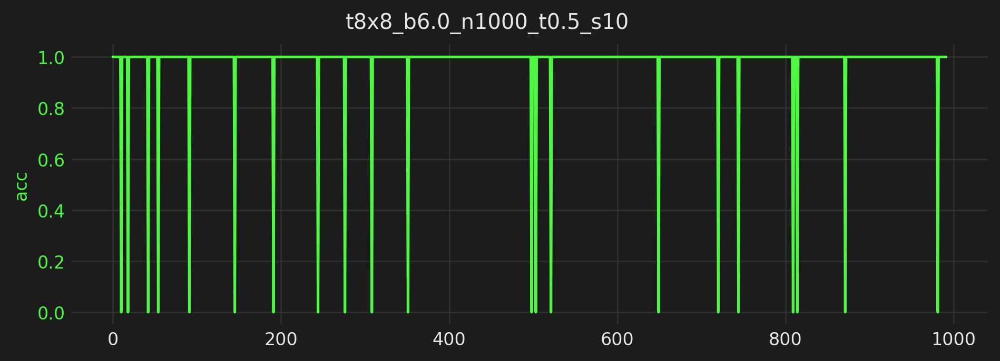

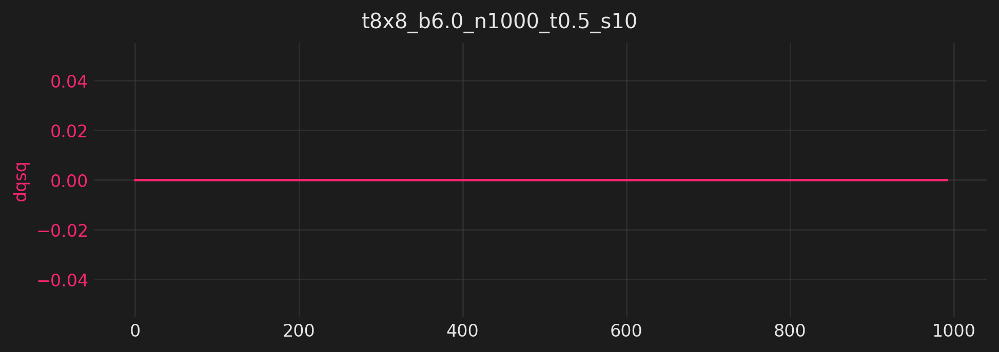

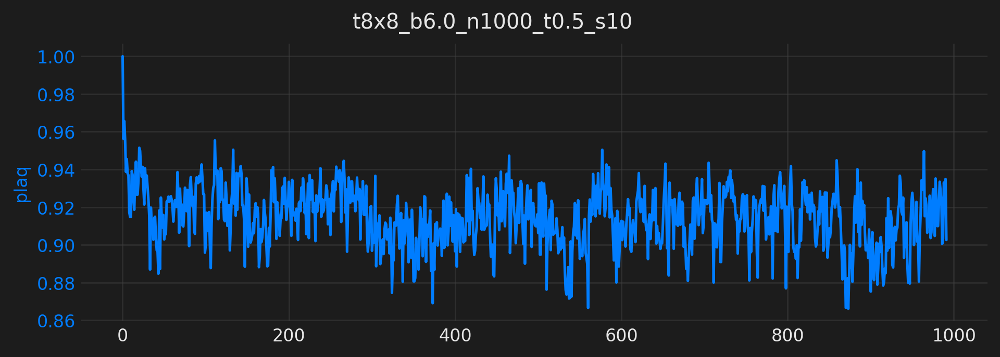

──────────────────────────────── RUN: 0, last took: 0 m 0 s ─────────────────────────────────

            plaq=1.000 q=0.000

[17:35:16]  traj=2 dt=0.009 acc=1.000 dH=0.027 q=0 dqsq=0 plaq=0.966

[17:35:22]  traj=102 dt=0.009 acc=1.000 dH=-0.034 q=0 dqsq=0 plaq=0.907

[17:35:28]  traj=202 dt=0.009 acc=1.000 dH=-0.051 q=0 dqsq=0 plaq=0.916

[17:35:34]  traj=302 dt=0.009 acc=1.000 dH=-0.021 q=0 dqsq=0 plaq=0.901

[17:35:41]  traj=402 dt=0.010 acc=1.000 dH=-0.084 q=0 dqsq=0 plaq=0.888

[17:35:47]  traj=502 dt=0.009 acc=1.000 dH=-0.069 q=0 dqsq=0 plaq=0.895

[17:35:53]  traj=602 dt=0.009 acc=1.000 dH=0.054 q=0 dqsq=0 plaq=0.912

[17:36:00]  traj=702 dt=0.010 acc=1.000 dH=-0.040 q=0 dqsq=0 plaq=0.924

[17:36:06]  traj=802 dt=0.009 acc=1.000 dH=0.061 q=0 dqsq=0 plaq=0.921

[17:36:13]  traj=902 dt=0.010 acc=1.000 dH=0.014 q=0 dqsq=0 plaq=0.907

[17:36:19]  Run times: ['63.1869']

            Per trajectory: ['0.0632']

[17:36:19]  Saving hmc_histories to                                                          
            ../../logs/hmc/t8x8_b6.0_n1000_t0.5_s10/2021-06-24-173515/hmc_histories.z.

[17:36:19]  Saving hmc_fields_arr to                                                         
            ../../logs/hmc/t8x8_b6.0_n1000_t0.5_s10/2021-06-24-173515/hmc_fields_arr.z.

[17:36:19]  Creating directory: ../../logs/t8x8_b6.0_n1000_t0.5_s10/nb256_nh16_ns2_ks3_hl888_
            lr0.001_era10_epoch1000

[17:36:19]  Creating directory: ../../logs/t8x8_b6.0_n1000_t0.5_s10/nb256_nh16_ns2_ks3_hl888_
            lr0.001_era10_epoch1000/training

[17:36:19]  Creating directory: ../../logs/t8x8_b6.0_n1000_t0.5_s10/nb256_nh16_ns2_ks3_hl888_
            lr0.001_era10_epoch1000/training/plots

[17:36:19]  Creating directory: ../../logs/t8x8_b6.0_n1000_t0.5_s10/nb256_nh16_ns2_ks3_hl888_
            lr0.001_era10_epoch1000/training/checkpoints

[17:36:19]  Scheduler created!

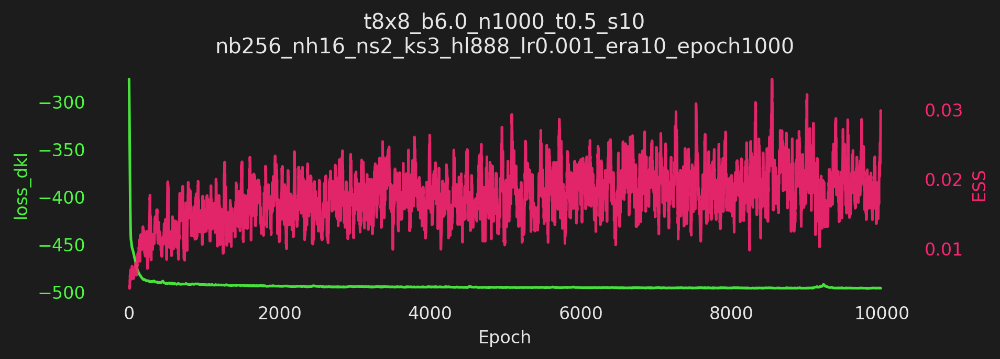

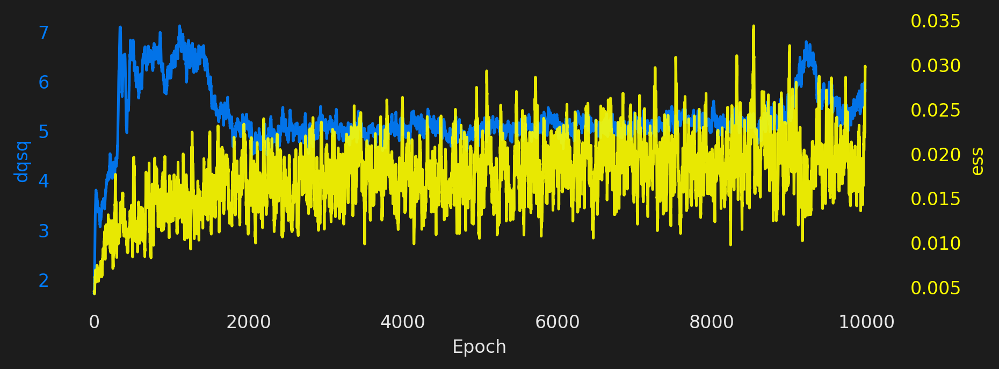

─────────────────────────────── ERA=0, last took: 0 min 0 sec ───────────────────────────────

[17:37:31]  (now) epoch: 499 dt=0.135 ess=0.004 loss_dkl=-490.251 dqsq=6.641 plaq=0.869

            (avg) epoch: 499 dt=0.135 ess=0.013 loss_dkl=-490.931 dqsq=6.599 plaq=0.870

Epoch   795: reducing learning rate of group 0 to 9.9000e-04.
Epoch   964: reducing learning rate of group 0 to 9.8010e-04.


[17:38:44]  (now) epoch: 999 dt=0.135 ess=0.020 loss_dkl=-491.730 dqsq=6.062 plaq=0.874

            (avg) epoch: 999 dt=0.135 ess=0.014 loss_dkl=-492.263 dqsq=6.311 plaq=0.875

[17:38:44]  Saving checkpoint to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/
            logs/t8x8_b6.0_n1000_t0.5_s10/nb256_nh16_ns2_ks3_hl888_lr0.001_era10_epoch1000/tr
            aining/checkpoints/ckpt-era0-epoch999.tar

───────────────────────────── ERA=1, last took: 2 min 24.91 sec ─────────────────────────────

Epoch  1187: reducing learning rate of group 0 to 9.7030e-04.
Epoch  1472: reducing learning rate of group 0 to 9.6060e-04.


[17:39:57]  (now) epoch: 499 dt=0.134 ess=0.006 loss_dkl=-493.190 dqsq=6.238 plaq=0.877

            (avg) epoch: 499 dt=0.135 ess=0.015 loss_dkl=-493.434 dqsq=6.110 plaq=0.880

Epoch  1589: reducing learning rate of group 0 to 9.5099e-04.
Epoch  1777: reducing learning rate of group 0 to 9.4148e-04.
Epoch  1948: reducing learning rate of group 0 to 9.3207e-04.


[17:41:09]  (now) epoch: 999 dt=0.135 ess=0.009 loss_dkl=-493.871 dqsq=5.574 plaq=0.878

            (avg) epoch: 999 dt=0.135 ess=0.015 loss_dkl=-493.902 dqsq=5.217 plaq=0.880

[17:41:10]  Saving checkpoint to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/
            logs/t8x8_b6.0_n1000_t0.5_s10/nb256_nh16_ns2_ks3_hl888_lr0.001_era10_epoch1000/tr
            aining/checkpoints/ckpt-era1-epoch999.tar

───────────────────────────── ERA=2, last took: 2 min 25.01 sec ─────────────────────────────

Epoch  2049: reducing learning rate of group 0 to 9.2274e-04.
Epoch  2150: reducing learning rate of group 0 to 9.1352e-04.


[17:42:22]  (now) epoch: 499 dt=0.133 ess=0.015 loss_dkl=-494.178 dqsq=4.570 plaq=0.889

            (avg) epoch: 499 dt=0.133 ess=0.015 loss_dkl=-494.168 dqsq=5.098 plaq=0.885

Epoch  2506: reducing learning rate of group 0 to 9.0438e-04.
Epoch  2942: reducing learning rate of group 0 to 8.9534e-04.


[17:43:34]  (now) epoch: 999 dt=0.133 ess=0.007 loss_dkl=-494.216 dqsq=4.652 plaq=0.884

            (avg) epoch: 999 dt=0.133 ess=0.015 loss_dkl=-494.615 dqsq=5.084 plaq=0.882

[17:43:34]  Saving checkpoint to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/
            logs/t8x8_b6.0_n1000_t0.5_s10/nb256_nh16_ns2_ks3_hl888_lr0.001_era10_epoch1000/tr
            aining/checkpoints/ckpt-era2-epoch999.tar

───────────────────────────── ERA=3, last took: 2 min 24.4 sec ──────────────────────────────

Epoch  3043: reducing learning rate of group 0 to 8.8638e-04.
Epoch  3144: reducing learning rate of group 0 to 8.7752e-04.
Epoch  3317: reducing learning rate of group 0 to 8.6875e-04.
Epoch  3462: reducing learning rate of group 0 to 8.6006e-04.


[17:44:46]  (now) epoch: 499 dt=0.133 ess=0.013 loss_dkl=-494.579 dqsq=5.430 plaq=0.884

            (avg) epoch: 499 dt=0.133 ess=0.017 loss_dkl=-494.782 dqsq=4.894 plaq=0.884

Epoch  3644: reducing learning rate of group 0 to 8.5146e-04.
Epoch  3793: reducing learning rate of group 0 to 8.4294e-04.
Epoch  3894: reducing learning rate of group 0 to 8.3451e-04.
Epoch  3995: reducing learning rate of group 0 to 8.2617e-04.


[17:45:58]  (now) epoch: 999 dt=0.133 ess=0.046 loss_dkl=-494.882 dqsq=5.367 plaq=0.882

            (avg) epoch: 999 dt=0.133 ess=0.020 loss_dkl=-494.710 dqsq=5.029 plaq=0.884

[17:45:59]  Saving checkpoint to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/
            logs/t8x8_b6.0_n1000_t0.5_s10/nb256_nh16_ns2_ks3_hl888_lr0.001_era10_epoch1000/tr
            aining/checkpoints/ckpt-era3-epoch999.tar

───────────────────────────── ERA=4, last took: 2 min 24.42 sec ─────────────────────────────

Epoch  4096: reducing learning rate of group 0 to 8.1791e-04.
Epoch  4197: reducing learning rate of group 0 to 8.0973e-04.
Epoch  4298: reducing learning rate of group 0 to 8.0163e-04.
Epoch  4479: reducing learning rate of group 0 to 7.9361e-04.


[17:47:10]  (now) epoch: 499 dt=0.133 ess=0.023 loss_dkl=-495.677 dqsq=4.492 plaq=0.887

            (avg) epoch: 499 dt=0.133 ess=0.023 loss_dkl=-495.409 dqsq=4.969 plaq=0.887

Epoch  4580: reducing learning rate of group 0 to 7.8568e-04.
Epoch  4681: reducing learning rate of group 0 to 7.7782e-04.
Epoch  4782: reducing learning rate of group 0 to 7.7004e-04.
Epoch  4951: reducing learning rate of group 0 to 7.6234e-04.


[17:48:23]  (now) epoch: 999 dt=0.133 ess=0.022 loss_dkl=-495.513 dqsq=5.445 plaq=0.885

            (avg) epoch: 999 dt=0.133 ess=0.011 loss_dkl=-495.502 dqsq=4.916 plaq=0.887

[17:48:23]  Saving checkpoint to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/
            logs/t8x8_b6.0_n1000_t0.5_s10/nb256_nh16_ns2_ks3_hl888_lr0.001_era10_epoch1000/tr
            aining/checkpoints/ckpt-era4-epoch999.tar

───────────────────────────── ERA=5, last took: 2 min 24.2 sec ──────────────────────────────

Epoch  5052: reducing learning rate of group 0 to 7.5472e-04.
Epoch  5255: reducing learning rate of group 0 to 7.4717e-04.


[17:49:35]  (now) epoch: 499 dt=0.133 ess=0.034 loss_dkl=-495.605 dqsq=5.219 plaq=0.891

            (avg) epoch: 499 dt=0.133 ess=0.020 loss_dkl=-495.329 dqsq=5.044 plaq=0.889

Epoch  5631: reducing learning rate of group 0 to 7.3970e-04.
Epoch  5839: reducing learning rate of group 0 to 7.3230e-04.
Epoch  5940: reducing learning rate of group 0 to 7.2498e-04.


[17:50:47]  (now) epoch: 999 dt=0.133 ess=0.016 loss_dkl=-495.679 dqsq=5.160 plaq=0.890

            (avg) epoch: 999 dt=0.133 ess=0.020 loss_dkl=-495.437 dqsq=5.120 plaq=0.887

[17:50:48]  Saving checkpoint to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/
            logs/t8x8_b6.0_n1000_t0.5_s10/nb256_nh16_ns2_ks3_hl888_lr0.001_era10_epoch1000/tr
            aining/checkpoints/ckpt-era5-epoch999.tar

───────────────────────────── ERA=6, last took: 2 min 24.64 sec ─────────────────────────────

Epoch  6041: reducing learning rate of group 0 to 7.1773e-04.
Epoch  6142: reducing learning rate of group 0 to 7.1055e-04.
Epoch  6266: reducing learning rate of group 0 to 7.0345e-04.
Epoch  6367: reducing learning rate of group 0 to 6.9641e-04.
Epoch  6468: reducing learning rate of group 0 to 6.8945e-04.


[17:52:00]  (now) epoch: 499 dt=0.133 ess=0.017 loss_dkl=-496.361 dqsq=5.406 plaq=0.888

            (avg) epoch: 499 dt=0.133 ess=0.017 loss_dkl=-495.680 dqsq=5.086 plaq=0.888

Epoch  6569: reducing learning rate of group 0 to 6.8255e-04.
Epoch  6678: reducing learning rate of group 0 to 6.7573e-04.
Epoch  6779: reducing learning rate of group 0 to 6.6897e-04.
Epoch  6880: reducing learning rate of group 0 to 6.6228e-04.
Epoch  6981: reducing learning rate of group 0 to 6.5566e-04.


[17:53:13]  (now) epoch: 999 dt=0.133 ess=0.011 loss_dkl=-495.603 dqsq=5.285 plaq=0.887

            (avg) epoch: 999 dt=0.133 ess=0.016 loss_dkl=-495.826 dqsq=5.142 plaq=0.889

[17:53:13]  Saving checkpoint to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/
            logs/t8x8_b6.0_n1000_t0.5_s10/nb256_nh16_ns2_ks3_hl888_lr0.001_era10_epoch1000/tr
            aining/checkpoints/ckpt-era6-epoch999.tar

───────────────────────────── ERA=7, last took: 2 min 25.16 sec ─────────────────────────────

Epoch  7173: reducing learning rate of group 0 to 6.4910e-04.
Epoch  7463: reducing learning rate of group 0 to 6.4261e-04.


[17:54:26]  (now) epoch: 499 dt=0.134 ess=0.009 loss_dkl=-496.602 dqsq=4.426 plaq=0.891

            (avg) epoch: 499 dt=0.134 ess=0.020 loss_dkl=-495.942 dqsq=5.398 plaq=0.888

Epoch  7576: reducing learning rate of group 0 to 6.3619e-04.
Epoch  7677: reducing learning rate of group 0 to 6.2982e-04.
Epoch  7801: reducing learning rate of group 0 to 6.2353e-04.
Epoch  7902: reducing learning rate of group 0 to 6.1729e-04.


[17:55:39]  (now) epoch: 999 dt=0.134 ess=0.008 loss_dkl=-496.261 dqsq=4.832 plaq=0.893

            (avg) epoch: 999 dt=0.134 ess=0.018 loss_dkl=-496.011 dqsq=5.011 plaq=0.890

[17:55:40]  Saving checkpoint to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/
            logs/t8x8_b6.0_n1000_t0.5_s10/nb256_nh16_ns2_ks3_hl888_lr0.001_era10_epoch1000/tr
            aining/checkpoints/ckpt-era7-epoch999.tar

───────────────────────────── ERA=8, last took: 2 min 25.65 sec ─────────────────────────────

Epoch  8003: reducing learning rate of group 0 to 6.1112e-04.
Epoch  8104: reducing learning rate of group 0 to 6.0501e-04.
Epoch  8205: reducing learning rate of group 0 to 5.9896e-04.
Epoch  8374: reducing learning rate of group 0 to 5.9297e-04.
Epoch  8475: reducing learning rate of group 0 to 5.8704e-04.


[17:56:52]  (now) epoch: 499 dt=0.134 ess=0.009 loss_dkl=-495.885 dqsq=5.141 plaq=0.892

            (avg) epoch: 499 dt=0.134 ess=0.017 loss_dkl=-495.881 dqsq=5.221 plaq=0.890

Epoch  8576: reducing learning rate of group 0 to 5.8117e-04.
Epoch  8747: reducing learning rate of group 0 to 5.7535e-04.
Epoch  8848: reducing learning rate of group 0 to 5.6960e-04.
Epoch  8949: reducing learning rate of group 0 to 5.6391e-04.


[17:58:05]  (now) epoch: 999 dt=0.134 ess=0.007 loss_dkl=-496.329 dqsq=5.352 plaq=0.888

            (avg) epoch: 999 dt=0.134 ess=0.019 loss_dkl=-496.139 dqsq=5.653 plaq=0.889

[17:58:05]  Saving checkpoint to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/
            logs/t8x8_b6.0_n1000_t0.5_s10/nb256_nh16_ns2_ks3_hl888_lr0.001_era10_epoch1000/tr
            aining/checkpoints/ckpt-era8-epoch999.tar

───────────────────────────── ERA=9, last took: 2 min 25.47 sec ─────────────────────────────

Epoch  9050: reducing learning rate of group 0 to 5.5827e-04.
Epoch  9151: reducing learning rate of group 0 to 5.5268e-04.
Epoch  9252: reducing learning rate of group 0 to 5.4716e-04.
Epoch  9353: reducing learning rate of group 0 to 5.4169e-04.
Epoch  9454: reducing learning rate of group 0 to 5.3627e-04.


[17:59:18]  (now) epoch: 499 dt=0.134 ess=0.012 loss_dkl=-496.574 dqsq=5.609 plaq=0.890

            (avg) epoch: 499 dt=0.134 ess=0.025 loss_dkl=-496.135 dqsq=5.609 plaq=0.888

Epoch  9635: reducing learning rate of group 0 to 5.3091e-04.
Epoch  9736: reducing learning rate of group 0 to 5.2560e-04.
Epoch  9924: reducing learning rate of group 0 to 5.2034e-04.


[18:00:31]  (now) epoch: 999 dt=0.134 ess=0.009 loss_dkl=-496.318 dqsq=5.551 plaq=0.892

            (avg) epoch: 999 dt=0.134 ess=0.026 loss_dkl=-496.143 dqsq=5.839 plaq=0.890

[18:00:32]  Saving checkpoint to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/
            logs/t8x8_b6.0_n1000_t0.5_s10/nb256_nh16_ns2_ks3_hl888_lr0.001_era10_epoch1000/tr
            aining/checkpoints/ckpt-era9-epoch999.tar

            Saving checkpoint to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/
            logs/t8x8_b6.0_n1000_t0.5_s10/nb256_nh16_ns2_ks3_hl888_lr0.001_era10_epoch1000/tr
            aining/checkpoints/ckpt-era10-epoch1001.tar

[18:00:32]  Saving live plots to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/
            logs/t8x8_b6.0_n1000_t0.5_s10/nb256_nh16_ns2_ks3_hl888_lr0.001_era10_epoch1000/tr
            aining/plots

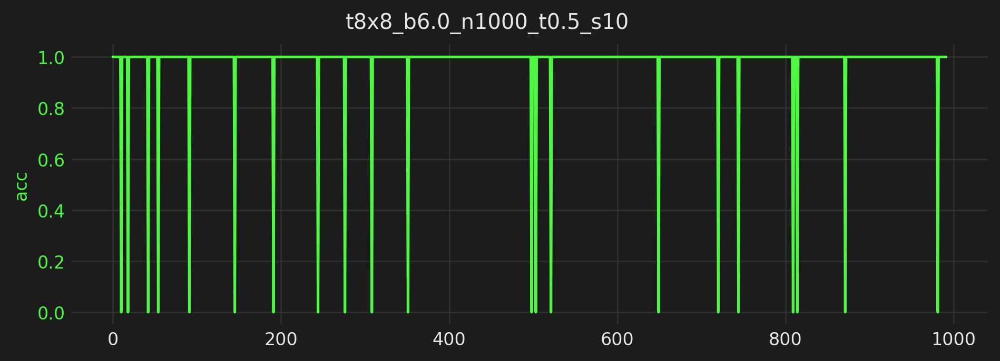

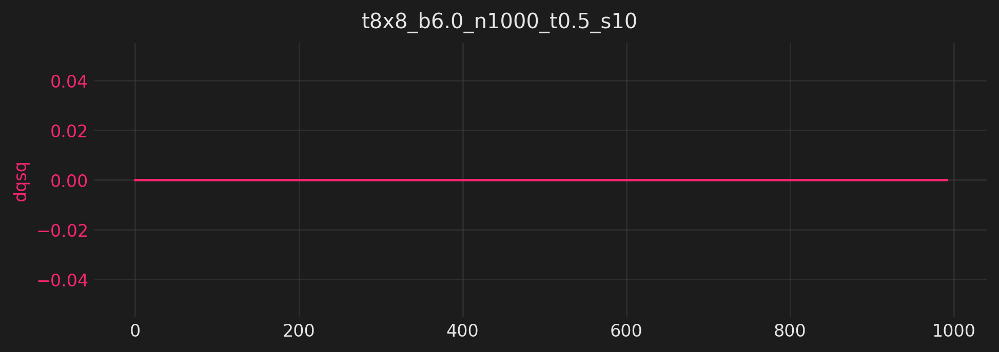

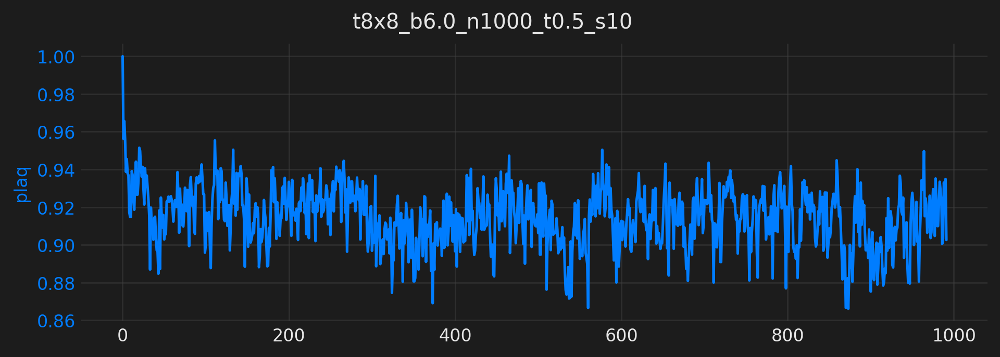

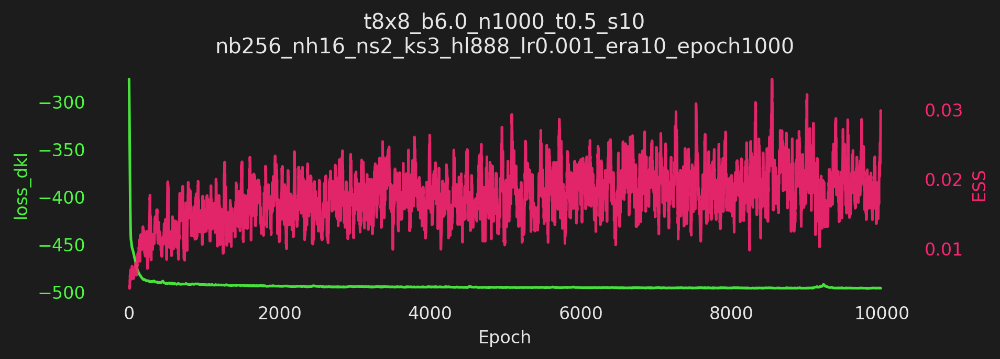

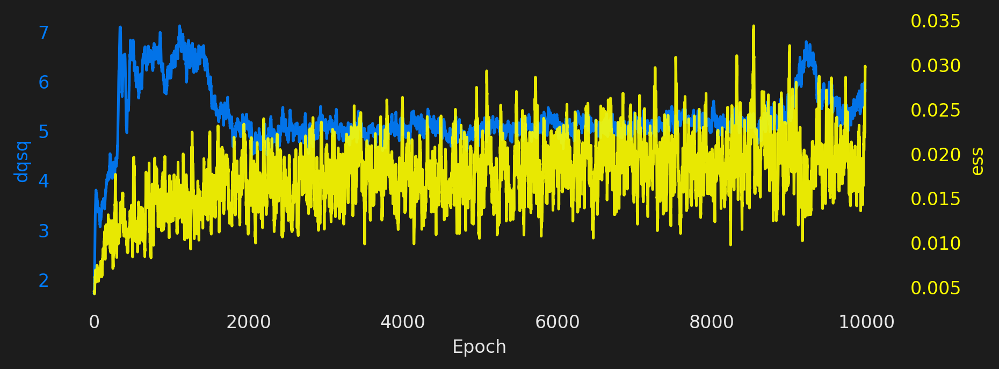

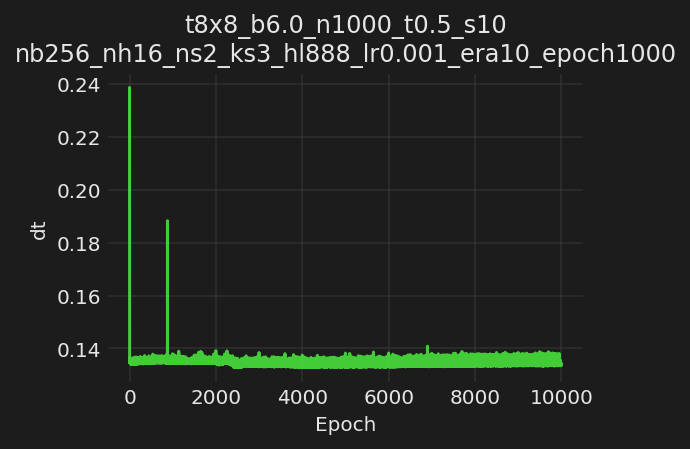

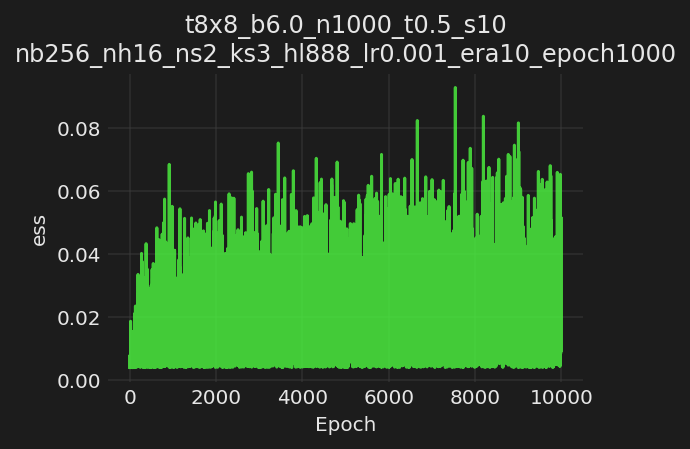

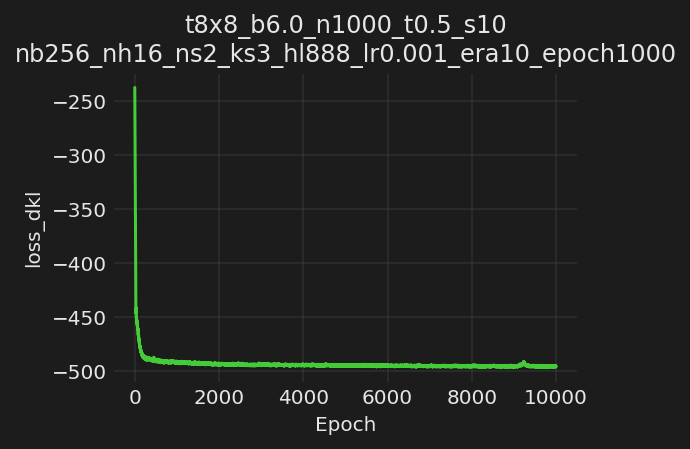

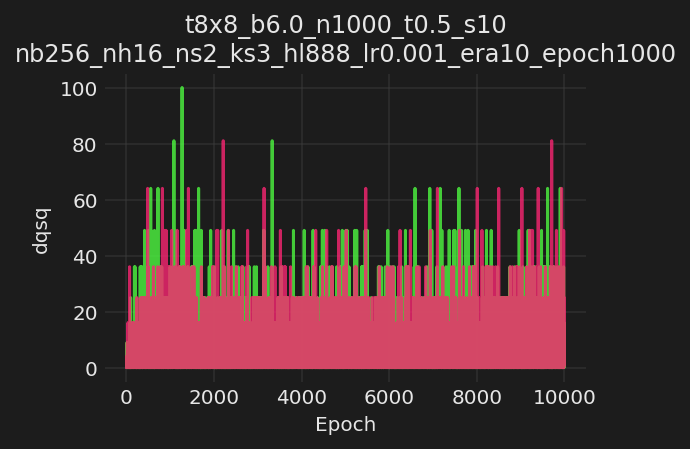

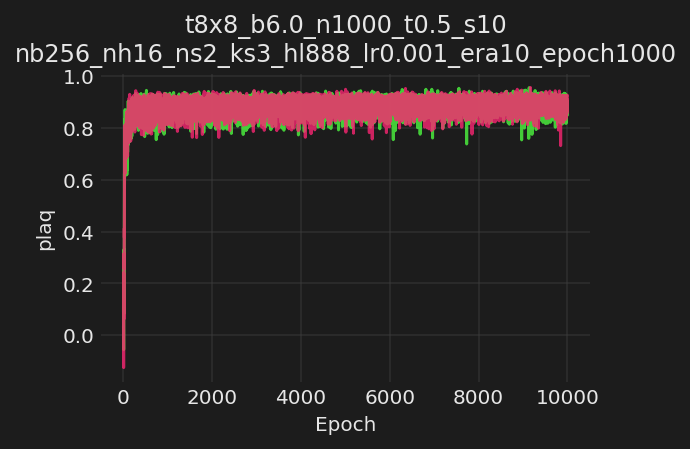

[18:00:37]  Saving train_history to ../../logs/t8x8_b6.0_n1000_t0.5_s10/nb256_nh16_ns2_ks3_hl
            888_lr0.001_era10_epoch1000/training/train_history.z.

[18:00:40]  Creating directory: ../../logs/t8x8_b6.0_n1000_t0.5_s10/nb256_nh16_ns2_ks3_hl888_
            lr0.001_era10_epoch1000/inference/plots

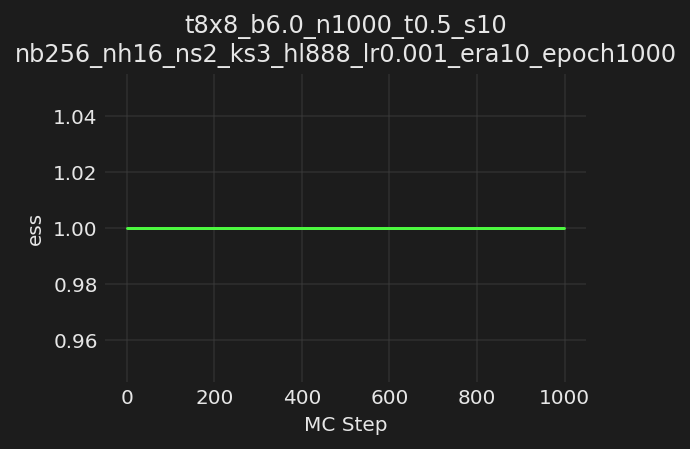

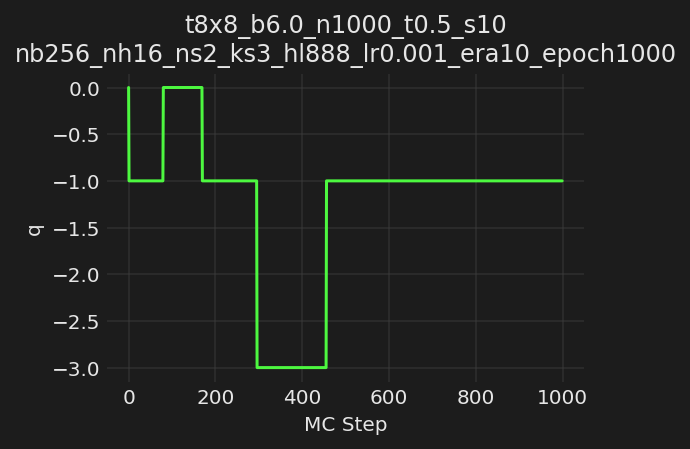

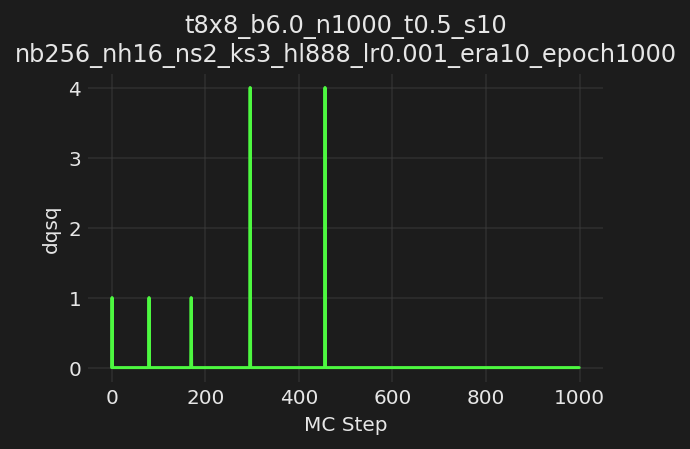

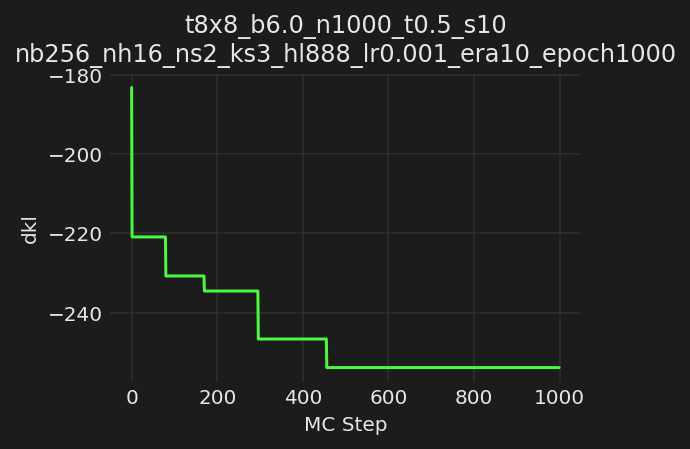

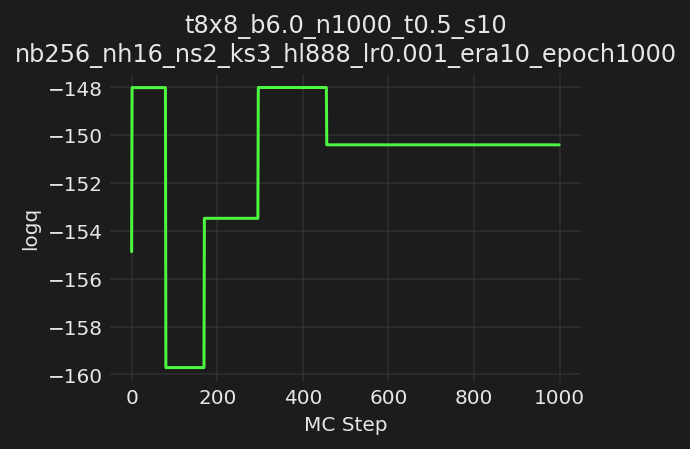

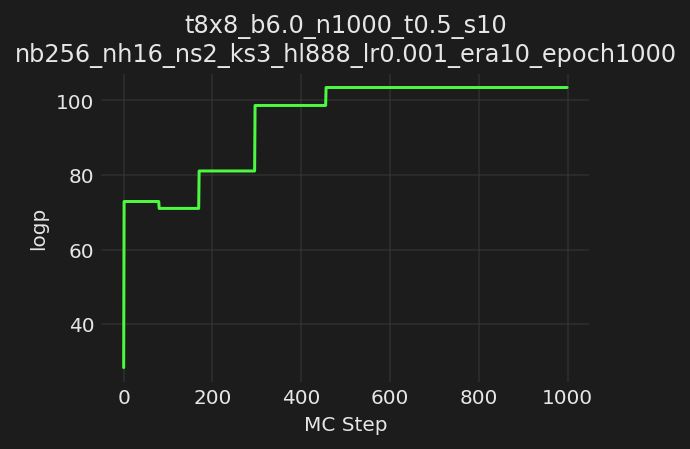

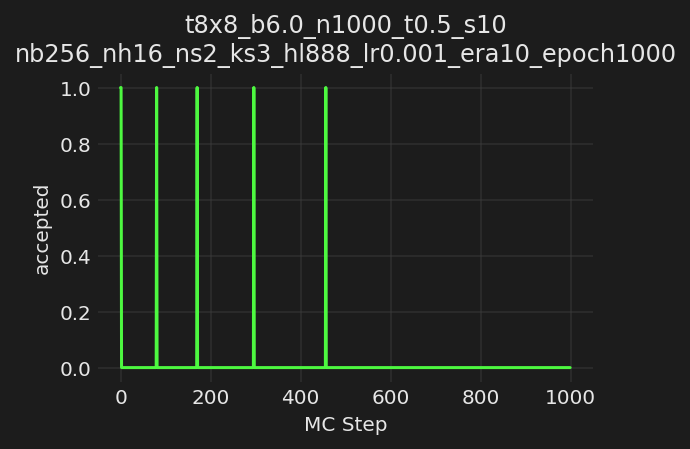

In [7]:
import numpy as np

from train import SchedulerConfig

plt.style.use('~/.matplotlib/stylelib/molokai.mplstyle')

# -------------------------------------------
# Specify `param` and `train_config` objects
# -------------------------------------------

# param.formatting:
# -----------------
# t{L}x{L}_b{beta}_n{ntraj}_t{tau}_s{nstep}

param = {
    'L': 8,
    'tau': 0.5,
    'nrun': 1,
    'beta': 6.,
    'nstep': 10,
    'ntraj': 1000,
    'nprint': 100,
    'seed': 1331,
}

param = Param(**param)
logger.log(param)

train_config = TrainConfig(**{
    'n_era': 10,
    'n_epoch': 1000,
    'n_layers': 16,
    'n_s_nets': 2,
    'hidden_sizes': [8, 8, 8],
    'kernel_size': 3,
    'batch_size': 256,
    'print_freq': 500,
    'plot_freq': 50,
})

scheduler_config = SchedulerConfig(
    factor=0.99,
    mode='min',
    patience=100,
    min_lr=5e-6,
    verbose=True,
)

logger.log(repr(train_config))

#torch.set_num_threads(param.nth)
#torch.set_num_interop_threads(param.nth_interop)
#os.environ["OMP_NUM_THREADS"] = str(param.nth)
os.environ["KMP_BLOCKTIME"] = "0"
os.environ["KMP_SETTINGS"] = "1"
os.environ["KMP_AFFINITY"]= "granularity=fine,verbose,compact,1,0"


# train_config.uniquestr() = '_'.join([
#    f'nb{batch_size}',
#    f'nh{n_layers}',
#    f'ns{n_s_nets}',
#    f'ks{kernel_size}',
#    f'hl{hstr}',
#    f'lr{base_lr}',
#    f'era{n_era}',
#    f'epoch{n_epoch}',
# ]
 

# ------------------------------
# Run HMC using `param` above
# ------------------------------
from fthmc.hmc import run_hmc

hmc_fields, hmc_history = run_hmc(param, plot_metrics=False)


# ---------------------------------------
# Train model using `train_config` above
# ---------------------------------------
from fthmc.train import train


train_outputs = train(param,
                      train_config,
                      model=None,  # train_outputs['model'],
                      pre_model=None,
                      figsize=(8, 2.75),
                      dpi=150,
                      scheduler_config=scheduler_config)

pre_flow_plots = train_outputs['plots']
pre_flow_history = train_outputs['history']
flow_act = train_outputs['action']
pre_flow_model = train_outputs['model']
pre_flow_optimizer = train_outputs['optimizer']


# -----------------------------------------------------------
# Run inference on trained model and evaluate / plot metrics
# -----------------------------------------------------------
import fthmc.utils.qed_helpers as qed
from fthmc.utils.plot_helpers import plot_history
from fthmc.utils.samplers import make_mcmc_ensemble

action_fn = qed.BatchAction(param.beta)
dirs = train_outputs['dirs']
logdir = dirs['logdir']

inf_dir = os.path.join(logdir, 'inference')
inf_pdir = os.path.join(inf_dir, 'plots')
history = make_mcmc_ensemble(model=train_outputs['model'], action_fn=action_fn,
                             batch_size=train_config.batch_size, num_samples=1000)
plot_history(history=history,
             param=param, config=train_config, skip=['epoch', 'x'],
             num_chains=4, therm_frac=0.0, xlabel='MC Step', outdir=inf_pdir)

In [8]:
import time
import torch.nn as nn

from fthmc.utils.plot_helpers import init_live_plot, update_plot
from math import pi as PI

TWO_PI = 2. * PI

In [75]:
from fthmc.utils.plot_helpers import update_plot
from fthmc.field_transformation import FieldTransformation

flow = train_outputs['model'].layers
flow.eval()

#param = Param(**{
#    'L': 8,
#    'tau': 0.5,
#    'nrun': 1,
#    'beta': 4.,
#    'nstep': 10,
#    'ntraj': 1000,
#    'nprint': 100,
#    'seed': 1331,
#})


#x_ = x[None, :]
#x_.requires_grad_(True)
#@param.tau = 0.1
#param.nstep = 10
#x = param.initializer()
#param.tau = 0.25
#param.nstep = 5 
#x_ = 2torch.uni(1, 2, 8, 8)
x = torch.empty((1, 2, 8, 8)).uniform_(-PI, PI)
field_transformation = FieldTransformation(flow=flow, param=param)

ModuleList(
  (0): GaugeEquivCouplingLayer(
    (plaq_coupling): NCPPlaqCouplingLayer(
      (net): Sequential(
        (0): Conv2d(2, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (1): SiLU()
        (2): Conv2d(8, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (3): SiLU()
        (4): Conv2d(8, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (5): SiLU()
        (6): Conv2d(8, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
      )
    )
  )
  (1): GaugeEquivCouplingLayer(
    (plaq_coupling): NCPPlaqCouplingLayer(
      (net): Sequential(
        (0): Conv2d(2, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (1): SiLU()
        (2): Conv2d(8, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (3): SiLU()
        (4): Conv2d(8, 8, kernel_size=(3, 3), stride=(1, 1), padding=(

In [76]:
flow = train_outputs['model'].layers
flow.to('cuda')
flow.eval()

ModuleList(
  (0): GaugeEquivCouplingLayer(
    (plaq_coupling): NCPPlaqCouplingLayer(
      (net): Sequential(
        (0): Conv2d(2, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (1): SiLU()
        (2): Conv2d(8, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (3): SiLU()
        (4): Conv2d(8, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (5): SiLU()
        (6): Conv2d(8, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
      )
    )
  )
  (1): GaugeEquivCouplingLayer(
    (plaq_coupling): NCPPlaqCouplingLayer(
      (net): Sequential(
        (0): Conv2d(2, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (1): SiLU()
        (2): Conv2d(8, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (3): SiLU()
        (4): Conv2d(8, 8, kernel_size=(3, 3), stride=(1, 1), padding=(

ModuleList(
  (0): GaugeEquivCouplingLayer(
    (plaq_coupling): NCPPlaqCouplingLayer(
      (net): Sequential(
        (0): Conv2d(2, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (1): SiLU()
        (2): Conv2d(8, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (3): SiLU()
        (4): Conv2d(8, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (5): SiLU()
        (6): Conv2d(8, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
      )
    )
  )
  (1): GaugeEquivCouplingLayer(
    (plaq_coupling): NCPPlaqCouplingLayer(
      (net): Sequential(
        (0): Conv2d(2, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (1): SiLU()
        (2): Conv2d(8, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (3): SiLU()
        (4): Conv2d(8, 8, kernel_size=(3, 3), stride=(1, 1), padding=(

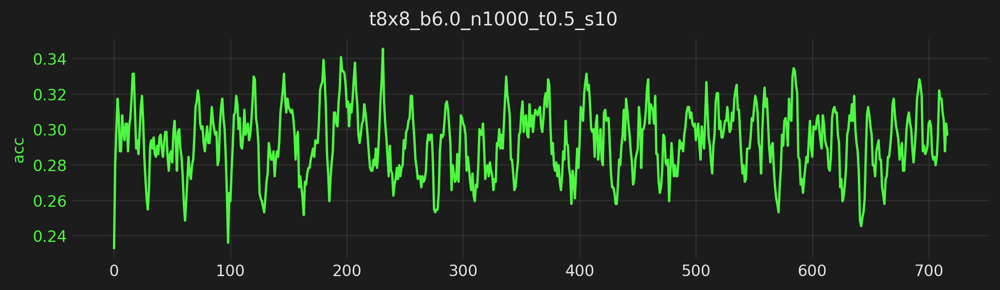

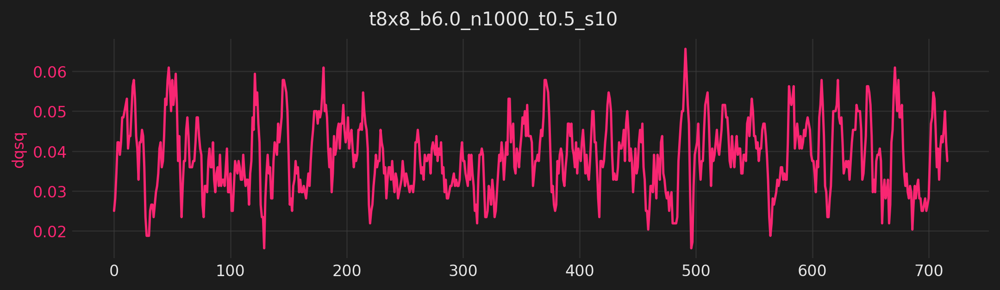

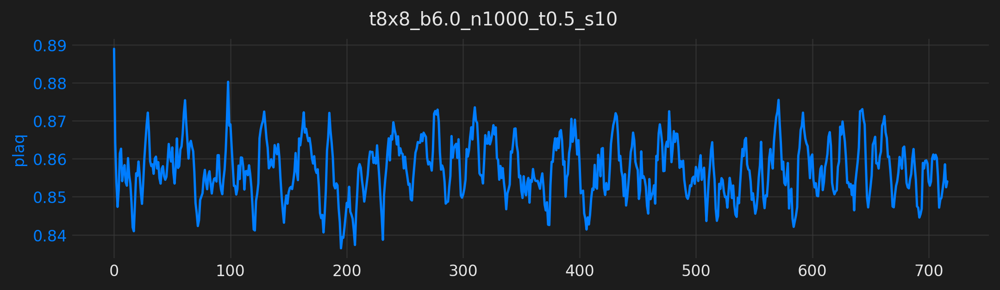

[20:15:37]  traj=25 dt=0.512 acc=0.336 dh=2.951 exp_mdh=2.386 q=-0.148 dqsq=0.047 plaq=0.842

[20:15:51]  traj=50 dt=0.515 acc=0.281 dh=2.844 exp_mdh=7.045 q=-0.164 dqsq=0.055 plaq=0.860

[20:16:05]  traj=75 dt=0.512 acc=0.320 dh=2.689 exp_mdh=16.144 q=-0.148 dqsq=0.039 plaq=0.845

[20:16:19]  traj=100 dt=0.516 acc=0.281 dh=3.681 exp_mdh=2.609 q=-0.117 dqsq=0.023 plaq=0.866

[20:16:33]  traj=125 dt=0.513 acc=0.383 dh=3.324 exp_mdh=1.956 q=-0.141 dqsq=0.023 plaq=0.820

[20:16:47]  traj=150 dt=0.514 acc=0.312 dh=2.669 exp_mdh=1.470 q=-0.164 dqsq=0.063 plaq=0.847

[20:17:02]  traj=175 dt=0.514 acc=0.289 dh=3.389 exp_mdh=1.862 q=-0.188 dqsq=0.047 plaq=0.854

[20:17:16]  traj=200 dt=0.514 acc=0.359 dh=2.828 exp_mdh=1.035 q=-0.188 dqsq=0.047 plaq=0.830

[20:17:30]  traj=225 dt=0.513 acc=0.258 dh=3.634 exp_mdh=2.822 q=-0.102 dqsq=0.016 plaq=0.867

[20:17:44]  traj=250 dt=0.516 acc=0.281 dh=3.357 exp_mdh=2.457 q=-0.102 dqsq=0.031 plaq=0.856

[20:17:58]  traj=275 dt=0.513 acc=0.352 dh=3.212 exp_mdh=3.392 q=-0.094 dqsq=0.039 plaq=0.837

[20:18:12]  traj=300 dt=0.516 acc=0.320 dh=3.033 exp_mdh=3.564 q=-0.156 dqsq=0.031 plaq=0.851

[20:18:27]  traj=325 dt=0.514 acc=0.273 dh=3.479 exp_mdh=1.387 q=-0.172 dqsq=0.016 plaq=0.864

[20:18:41]  traj=350 dt=0.516 acc=0.297 dh=3.053 exp_mdh=1.799 q=-0.148 dqsq=0.031 plaq=0.859

[20:18:55]  traj=375 dt=0.515 acc=0.320 dh=3.354 exp_mdh=2.216 q=-0.070 dqsq=0.070 plaq=0.843

[20:19:09]  traj=400 dt=0.515 acc=0.234 dh=4.068 exp_mdh=1.751 q=-0.164 dqsq=0.055 plaq=0.879

[20:19:24]  traj=425 dt=0.514 acc=0.273 dh=3.418 exp_mdh=0.874 q=-0.141 dqsq=0.008 plaq=0.862

[20:19:38]  traj=450 dt=0.516 acc=0.328 dh=3.404 exp_mdh=1.488 q=-0.180 dqsq=0.055 plaq=0.840

[20:19:52]  traj=475 dt=0.513 acc=0.312 dh=3.826 exp_mdh=1.092 q=-0.141 dqsq=0.047 plaq=0.849

[20:20:06]  traj=500 dt=0.515 acc=0.320 dh=3.135 exp_mdh=2.962 q=-0.117 dqsq=0.023 plaq=0.843

[20:20:20]  traj=525 dt=0.514 acc=0.258 dh=3.668 exp_mdh=1.160 q=-0.180 dqsq=0.039 plaq=0.870

[20:20:34]  traj=550 dt=0.516 acc=0.258 dh=3.209 exp_mdh=3.837 q=-0.156 dqsq=0.055 plaq=0.865

[20:20:49]  traj=575 dt=0.515 acc=0.258 dh=3.078 exp_mdh=16.769 q=-0.125 dqsq=0.055          
            plaq=0.876

[20:21:03]  traj=600 dt=0.516 acc=0.312 dh=3.262 exp_mdh=0.971 q=-0.078 dqsq=0.062 plaq=0.852

[20:21:17]  traj=625 dt=0.515 acc=0.250 dh=3.481 exp_mdh=1.668 q=-0.219 dqsq=0.031 plaq=0.875

[20:21:31]  traj=650 dt=0.517 acc=0.297 dh=3.328 exp_mdh=1.958 q=-0.156 dqsq=0.070 plaq=0.857

[20:21:46]  traj=675 dt=0.516 acc=0.328 dh=2.460 exp_mdh=2.465 q=-0.141 dqsq=0.078 plaq=0.844

[20:22:00]  traj=700 dt=0.516 acc=0.242 dh=3.306 exp_mdh=1.564 q=-0.156 dqsq=0.023 plaq=0.877

In [ ]:
#x_ = x[None, :]
#x_.requires_grad_(True)
#param.tau = 0.1
#param.nstep = 2
#x = param.initializer()
#param.tau = 0.25
#param.nstep = 5 
param.tau = 0.5
param.nstep = 10
param.ntraj = 1000
x_ = torch.ones(128, 2, 8, 8).cuda()

runs_history = field_transformation.run(x=x_, nprint=25,
                                        figsize=(9., 2.5),
                                        dpi=120, nplot=10)

In [80]:
%debug

> /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/fthmc/utils/plot_helpers.py(134)plot_metric()
    132 
    133     if isinstance(metric, list) and isinstance(metric[0], torch.Tensor):
--> 134         metric = torch.Tensor(metric).detach().cpu().numpy().squeeze()
    135 
    136     if isinstance(metric, torch.Tensor):

ipdb> l
    129     if isinstance(metric, list):
    130         if isinstance(metric[0], tuple) and len(metric[0]) == 1:
    131             metric = [grab(m[0]) for m in metric]
    132 
    133     if isinstance(metric, list) and isinstance(metric[0], torch.Tensor):
--> 134         metric = torch.Tensor(metric).detach().cpu().numpy().squeeze()
    135 
    136     if isinstance(metric, torch.Tensor):
    137         metric = torch.Tensor(metric).detach().cpu().numpy().squeeze()
    138 
    139     metric = np.array(metric)

ipdb> up
> /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/fthmc/utils/plot_helpers.py(204)plot_history()
    202       

ipdb> val[0]
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0.,
        0., 0., 1., 0., 0., 0., 1., 1., 0., 0., 1., 0., 1., 1., 1., 1., 0., 0.,
        0., 0., 1., 0., 1., 1., 0., 0., 0., 0., 0., 0., 1., 1., 0., 0., 0., 1.,
        0., 0., 1., 1., 0., 0., 1., 0., 0., 0.])
ipdb> vt = torch.Tensor(torch.stack(val))
ipdb> vt.shape
torch.Size([999, 64])
ipdb> l
    199 
    200         if title is None:
    201             tarr = get_title(param, config)
    202             title = '\n'.join(tarr) if len(tarr) > 0 else None
    203 
--> 204         _ = plot_metric(val,
    205                         ylabel=key,
    206                         title=title,
    207                         xlabel=xlabel,
    208                         outfile=outfile,
    209                         thin=thin,

ipdb> up
> /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/fthmc/field_transformation.py(335)run()
    333 
    334             runs_history[n] = history
--> 3

In [66]:
%debug

> /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/fthmc/utils/plot_helpers.py(429)update_plot()
    427 
    428     if isinstance(y, list) and isinstance(y[0], torch.Tensor):
--> 429         y = torch.Tensor(y).detach().cpu().numpy().squeeze()
    430 
    431     if isinstance(y, torch.Tensor):

ipdb> y.shape
*** AttributeError: 'list' object has no attribute 'shape'
ipdb> len(y)
1
ipdb> yt = torch.Tensor(y)
*** ValueError: only one element tensors can be converted to Python scalars
ipdb> yt = torch.tensor(y)
*** ValueError: only one element tensors can be converted to Python scalars
ipdb> y
[tensor([0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 5.7594e-15, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 1.2959e-14])]
ipdb> yt = torch.Tensor(torch.stack(y))
ipdb> yt
tensor([[0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 5.7594e-15, 0.0000e+00,
         0.0000e+00, 0.0000e+00, 0.0000

In [62]:
%debug

> /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/fthmc/utils/qed_helpers.py(98)batch_plaqs()
     96     return (x[mu, :],
     97             - x[nu, :]
---> 98             - torch.roll(x[mu, :], -1, nu + 1)
     99             + torch.roll(x[nu, :], -1, mu + 1))
    100 

ipdb> x.shape
torch.Size([16, 128])
ipdb> up
> /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/fthmc/utils/qed_helpers.py(107)batch_charges()
    105             raise ValueError('Either `x` or `plaq` must be specified.')
    106 
--> 107         plaqs = torch_wrap(batch_plaqs(x, mu=0, nu=1))
    108 
    109     axes = tuple(range(1, len(plaqs.shape)))

ipdb> up
> /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/fthmc/field_transformation.py(87)<lambda>()
     85         self._action_fn = lambda x: action_fn(x)
     86         self._denom = (self.param.beta * self.param.volume)
---> 87         self._charges_fn = lambda x: qed.batch_charges(x).detach()
     88         self._plaq_fn =

## New heading

In [55]:
x0 = torch.zeros(16, 2, 8, 8)

x1 = torch.arange(16 * 2 * 8 * 8).reshape(x0.shape)

x0 = x0.flatten(1)
x1 = x1.flatten(1)

mask = np.array([np.random.rand() < 0.5 for _ in range(x0.shape[0])])

mask = torch.from_numpy(mask)

logger.log(mask)

[18:43:48]  tensor([ True, False, False, False, False,  True,  True, False, False, False,    
                     True, False, False,  True,  True,  True], device='cpu')

In [60]:
mask[:, None].to(torch.uint8) * x1

RuntimeError: Expected all tensors to be on the same device, but found at least two devices, cuda:0 and cpu!

In [46]:
mask.shape

torch.Size([16])

In [ ]:
x1 = x1.flatten(start_dim=1)

In [41]:
x_ = mask[:, None] * x1.flatten(start_dim=1) + (1 - mask)[:, None] * x0.flatten(start_dim=1)

RuntimeError: Expected all tensors to be on the same device, but found at least two devices, cuda:0 and cpu!

In [38]:
x0.flatten(start_dim=1).shape

torch.Size([16, 128])

In [33]:
x1.shape

torch.Size([16, 2, 8, 8])

In [31]:
x1 * mask

RuntimeError: The size of tensor a (8) must match the size of tensor b (16) at non-singleton dimension 3

In [28]:
x_ = torch.empty_like(x1)

In [ ]:
x_ = torch.stack([x1[mask]])

In [ ]:
x = torch.arange(16 * 2 * 4 * 4)

In [53]:
x = x.reshape(16, 2, 4, 4)
x.shape

torch.Size([16, 2, 4, 4])

In [56]:
x1 = torch.ones_like(x)

In [54]:
acc = torch.rand(16) < torch.rand(16)

In [55]:
acc

tensor([False,  True,  True, False,  True,  True, False,  True, False,  True,
        False,  True, False, False,  True,  True])

In [57]:
accf = acc.float()

In [59]:
xnew = torch.zeros_like(x)
xnew[acc] = x1

rej = torch.logical_not(acc)
xnew[rej] = x

RuntimeError: shape mismatch: value tensor of shape [16, 2, 4, 4] cannot be broadcast to indexing result of shape [9, 2, 4, 4]

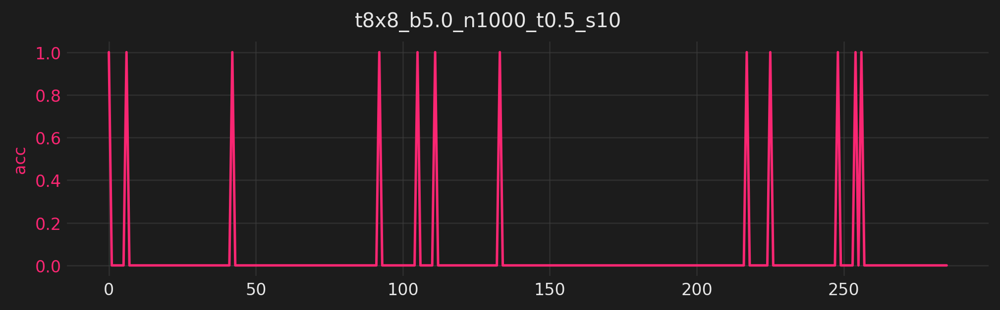

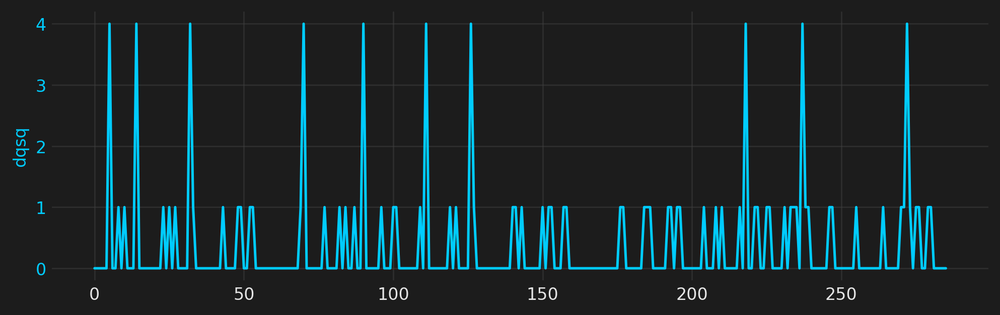

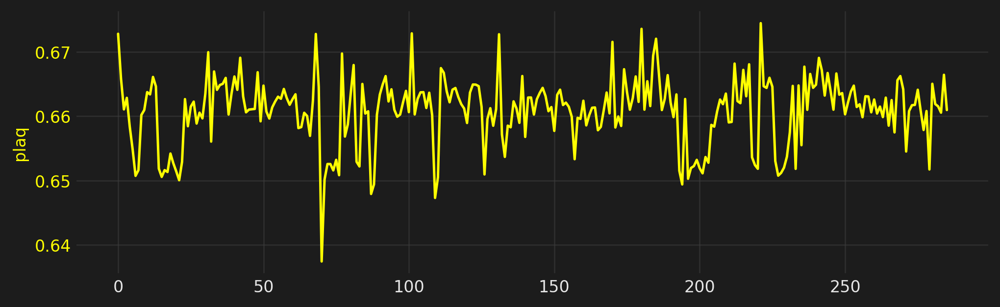

[20:02:20]  plaq=0.673 q=0.000

[20:02:23]  (now) traj=3.333 dt=0.377 acc=0.167 dH=0.000 exp_mdh=0.237 dqsq=0.667 plaq=0.663 
            dh=9.427

            (avg) traj=6.000 dt=0.451 acc=0.000 dH=0.000 exp_mdh=0.000 dqsq=4.000 plaq=0.655 
            dh=11.548

[20:02:26]  (now) traj=5.909 dt=0.407 acc=0.182 dH=0.000 exp_mdh=0.230 dqsq=0.545 plaq=0.660 
            dh=11.308

            (avg) traj=6.500 dt=0.448 acc=0.100 dH=0.000 exp_mdh=0.153 dqsq=0.600 plaq=0.659 
            dh=11.308

[20:02:28]  (now) traj=8.438 dt=0.418 acc=0.125 dH=0.000 exp_mdh=0.158 dqsq=0.625 plaq=0.660 
            dh=12.722

            (avg) traj=11.500 dt=0.444 acc=0.100 dH=0.000 exp_mdh=0.111 dqsq=0.600 plaq=0.658
            dh=14.369

[20:02:31]  (now) traj=10.952 dt=0.424 acc=0.095 dH=0.000 exp_mdh=0.121 dqsq=0.476 plaq=0.658
            dh=13.214

            (avg) traj=16.500 dt=0.443 acc=0.000 dH=0.000 exp_mdh=0.000 dqsq=0.400 plaq=0.656
            dh=15.120

[20:02:34]  (now) traj=13.462 dt=0.428 acc=0.077 dH=0.000 exp_mdh=0.098 dqsq=0.462 plaq=0.658
            dh=13.298

            (avg) traj=21.500 dt=0.443 acc=0.000 dH=0.000 exp_mdh=0.000 dqsq=0.200 plaq=0.655
            dh=14.162

[20:02:36]  (now) traj=15.968 dt=0.430 acc=0.065 dH=0.000 exp_mdh=0.082 dqsq=0.419 plaq=0.658
            dh=13.486

            (avg) traj=26.500 dt=0.443 acc=0.000 dH=0.000 exp_mdh=0.000 dqsq=0.300 plaq=0.659
            dh=14.029

[20:02:39]  (now) traj=18.472 dt=0.432 acc=0.056 dH=0.000 exp_mdh=0.070 dqsq=0.500 plaq=0.659
            dh=13.343

            (avg) traj=31.500 dt=0.443 acc=0.000 dH=0.000 exp_mdh=0.000 dqsq=0.600 plaq=0.663
            dh=13.456

[20:02:41]  (now) traj=20.976 dt=0.433 acc=0.049 dH=0.000 exp_mdh=0.062 dqsq=0.439 plaq=0.660
            dh=13.526

            (avg) traj=36.500 dt=0.443 acc=0.000 dH=0.000 exp_mdh=0.000 dqsq=0.500 plaq=0.664
            dh=13.647

[20:02:44]  (now) traj=23.478 dt=0.434 acc=0.065 dH=0.000 exp_mdh=0.069 dqsq=0.413 plaq=0.660
            dh=12.977

            (avg) traj=41.500 dt=0.443 acc=0.100 dH=0.000 exp_mdh=0.062 dqsq=0.100 plaq=0.664
            dh=11.697

[20:02:47]  (now) traj=25.980 dt=0.435 acc=0.059 dH=0.000 exp_mdh=0.062 dqsq=0.412 plaq=0.660
            dh=13.108

            (avg) traj=46.500 dt=0.441 acc=0.100 dH=0.000 exp_mdh=0.062 dqsq=0.300 plaq=0.663
            dh=11.437

[20:02:49]  (now) traj=28.482 dt=0.436 acc=0.054 dH=0.000 exp_mdh=0.057 dqsq=0.411 plaq=0.661
            dh=12.876

            (avg) traj=51.500 dt=0.441 acc=0.000 dH=0.000 exp_mdh=0.006 dqsq=0.400 plaq=0.662
            dh=12.419

[20:02:52]  (now) traj=30.984 dt=0.437 acc=0.049 dH=0.000 exp_mdh=0.060 dqsq=0.377 plaq=0.661
            dh=12.464

            (avg) traj=56.500 dt=0.445 acc=0.000 dH=0.000 exp_mdh=0.050 dqsq=0.200 plaq=0.662
            dh=9.242

[20:02:54]  (now) traj=33.485 dt=0.437 acc=0.045 dH=0.000 exp_mdh=0.056 dqsq=0.348 plaq=0.661
            dh=12.108

            (avg) traj=61.500 dt=0.446 acc=0.000 dH=0.000 exp_mdh=0.050 dqsq=0.000 plaq=0.661
            dh=7.882

[20:02:57]  (now) traj=35.986 dt=0.437 acc=0.042 dH=0.000 exp_mdh=0.052 dqsq=0.394 plaq=0.661
            dh=12.300

            (avg) traj=66.500 dt=0.443 acc=0.000 dH=0.000 exp_mdh=0.006 dqsq=0.500 plaq=0.659
            dh=11.317

[20:03:00]  (now) traj=38.487 dt=0.438 acc=0.039 dH=0.000 exp_mdh=0.049 dqsq=0.368 plaq=0.660
            dh=12.195

            (avg) traj=71.500 dt=0.441 acc=0.000 dH=0.000 exp_mdh=0.002 dqsq=0.500 plaq=0.655
            dh=12.759

[20:03:02]  (now) traj=40.988 dt=0.438 acc=0.037 dH=0.000 exp_mdh=0.046 dqsq=0.358 plaq=0.660
            dh=12.499

            (avg) traj=76.500 dt=0.442 acc=0.000 dH=0.000 exp_mdh=0.001 dqsq=0.100 plaq=0.656
            dh=13.893

[20:03:05]  (now) traj=43.488 dt=0.438 acc=0.035 dH=0.000 exp_mdh=0.043 dqsq=0.360 plaq=0.660
            dh=12.664

            (avg) traj=81.500 dt=0.441 acc=0.000 dH=0.000 exp_mdh=0.000 dqsq=0.300 plaq=0.660
            dh=16.181

[20:03:08]  (now) traj=45.989 dt=0.438 acc=0.033 dH=0.000 exp_mdh=0.041 dqsq=0.396 plaq=0.660
            dh=12.683

            (avg) traj=86.500 dt=0.441 acc=0.000 dH=0.000 exp_mdh=0.000 dqsq=0.700 plaq=0.658
            dh=14.152

[20:03:10]  (now) traj=48.490 dt=0.438 acc=0.042 dH=0.000 exp_mdh=0.041 dqsq=0.375 plaq=0.660
            dh=12.535

            (avg) traj=91.500 dt=0.440 acc=0.100 dH=0.000 exp_mdh=0.022 dqsq=0.500 plaq=0.660
            dh=11.443

[20:03:13]  (now) traj=50.990 dt=0.438 acc=0.040 dH=0.000 exp_mdh=0.039 dqsq=0.376 plaq=0.660
            dh=12.712

            (avg) traj=96.500 dt=0.440 acc=0.100 dH=0.000 exp_mdh=0.022 dqsq=0.200 plaq=0.663
            dh=12.971

[20:03:15]  (now) traj=53.491 dt=0.439 acc=0.047 dH=0.000 exp_mdh=9.959 dqsq=0.368 plaq=0.660
            dh=12.644

            (avg) traj=101.500 dt=0.440 acc=0.100 dH=0.000 exp_mdh=105.175 dqsq=0.300        
            plaq=0.663 dh=13.683

[20:03:18]  (now) traj=55.991 dt=0.439 acc=0.045 dH=0.000 exp_mdh=9.511 dqsq=0.360 plaq=0.660
            dh=12.577

            (avg) traj=106.500 dt=0.439 acc=0.100 dH=0.000 exp_mdh=105.175 dqsq=0.200        
            plaq=0.661 dh=11.234

[20:03:21]  (now) traj=58.491 dt=0.439 acc=0.052 dH=0.000 exp_mdh=9.101 dqsq=0.379 plaq=0.660
            dh=12.487

            (avg) traj=111.500 dt=0.439 acc=0.100 dH=0.000 exp_mdh=0.005 dqsq=0.500          
            plaq=0.661 dh=10.838

[20:03:23]  (now) traj=60.992 dt=0.439 acc=0.050 dH=0.000 exp_mdh=8.726 dqsq=0.372 plaq=0.660
            dh=12.429

            (avg) traj=116.500 dt=0.440 acc=0.100 dH=0.000 exp_mdh=0.009 dqsq=0.500          
            plaq=0.663 dh=10.797

[20:03:26]  (now) traj=63.492 dt=0.439 acc=0.048 dH=0.000 exp_mdh=8.379 dqsq=0.365 plaq=0.661
            dh=12.461

            (avg) traj=121.500 dt=0.439 acc=0.000 dH=0.000 exp_mdh=0.005 dqsq=0.200          
            plaq=0.663 dh=12.155

[20:03:28]  (now) traj=65.992 dt=0.439 acc=0.046 dH=0.000 exp_mdh=8.060 dqsq=0.389 plaq=0.660
            dh=12.492

            (avg) traj=126.500 dt=0.439 acc=0.000 dH=0.000 exp_mdh=0.001 dqsq=0.600          
            plaq=0.661 dh=13.248

[20:03:31]  (now) traj=68.493 dt=0.439 acc=0.051 dH=0.000 exp_mdh=7.774 dqsq=0.375 plaq=0.660
            dh=12.560

            (avg) traj=131.500 dt=0.439 acc=0.100 dH=0.000 exp_mdh=0.143 dqsq=0.500          
            plaq=0.659 dh=13.804

[20:03:34]  (now) traj=70.993 dt=0.439 acc=0.050 dH=0.000 exp_mdh=7.498 dqsq=0.369 plaq=0.660
            dh=12.732

            (avg) traj=136.500 dt=0.439 acc=0.100 dH=0.000 exp_mdh=0.143 dqsq=0.100          
            plaq=0.661 dh=15.845

[20:03:36]  (now) traj=73.493 dt=0.439 acc=0.048 dH=0.000 exp_mdh=7.243 dqsq=0.370 plaq=0.661
            dh=12.575

            (avg) traj=141.500 dt=0.440 acc=0.000 dH=0.000 exp_mdh=0.022 dqsq=0.300          
            plaq=0.662 dh=12.770

[20:03:39]  (now) traj=75.993 dt=0.439 acc=0.046 dH=0.000 exp_mdh=7.003 dqsq=0.364 plaq=0.661
            dh=12.579

            (avg) traj=146.500 dt=0.439 acc=0.000 dH=0.000 exp_mdh=0.022 dqsq=0.300          
            plaq=0.662 dh=10.446

[20:03:41]  (now) traj=78.494 dt=0.439 acc=0.045 dH=0.000 exp_mdh=6.778 dqsq=0.365 plaq=0.661
            dh=12.595

            (avg) traj=151.500 dt=0.438 acc=0.000 dH=0.000 exp_mdh=0.000 dqsq=0.300          
            plaq=0.662 dh=12.887

[20:03:44]  (now) traj=80.994 dt=0.439 acc=0.043 dH=0.000 exp_mdh=6.568 dqsq=0.366 plaq=0.661
            dh=12.596

            (avg) traj=156.500 dt=0.440 acc=0.000 dH=0.000 exp_mdh=0.000 dqsq=0.400          
            plaq=0.661 dh=12.846

[20:03:47]  (now) traj=83.494 dt=0.439 acc=0.042 dH=0.000 exp_mdh=6.370 dqsq=0.355 plaq=0.661
            dh=12.640

            (avg) traj=161.500 dt=0.440 acc=0.000 dH=0.000 exp_mdh=0.000 dqsq=0.200          
            plaq=0.659 dh=13.341

[20:03:49]  (now) traj=85.994 dt=0.439 acc=0.041 dH=0.000 exp_mdh=6.184 dqsq=0.345 plaq=0.661
            dh=12.868

            (avg) traj=166.500 dt=0.440 acc=0.000 dH=0.000 exp_mdh=0.000 dqsq=0.000          
            plaq=0.661 dh=17.225

[20:03:52]  (now) traj=88.494 dt=0.439 acc=0.040 dH=0.000 exp_mdh=6.008 dqsq=0.335 plaq=0.661
            dh=12.965

            (avg) traj=171.500 dt=0.441 acc=0.000 dH=0.000 exp_mdh=0.000 dqsq=0.000          
            plaq=0.662 dh=18.330

[20:03:55]  (now) traj=90.994 dt=0.439 acc=0.039 dH=0.000 exp_mdh=5.842 dqsq=0.337 plaq=0.661
            dh=13.026

            (avg) traj=176.500 dt=0.440 acc=0.000 dH=0.000 exp_mdh=0.000 dqsq=0.200          
            plaq=0.663 dh=15.706

[20:03:57]  (now) traj=93.495 dt=0.439 acc=0.038 dH=0.000 exp_mdh=5.685 dqsq=0.339 plaq=0.661
            dh=13.093

            (avg) traj=181.500 dt=0.440 acc=0.000 dH=0.000 exp_mdh=0.000 dqsq=0.400          
            plaq=0.666 dh=15.336

[20:04:00]  (now) traj=95.995 dt=0.439 acc=0.037 dH=0.000 exp_mdh=5.536 dqsq=0.335 plaq=0.661
            dh=13.141

            (avg) traj=186.500 dt=0.440 acc=0.000 dH=0.000 exp_mdh=0.000 dqsq=0.300          
            plaq=0.665 dh=15.220

[20:04:02]  (now) traj=98.495 dt=0.439 acc=0.036 dH=0.000 exp_mdh=5.395 dqsq=0.342 plaq=0.661
            dh=13.208

            (avg) traj=191.500 dt=0.440 acc=0.000 dH=0.000 exp_mdh=0.000 dqsq=0.400          
            plaq=0.661 dh=15.327

[20:04:05]  (now) traj=100.995 dt=0.439 acc=0.035 dH=0.000 exp_mdh=5.261 dqsq=0.338          
            plaq=0.661 dh=13.229

            (avg) traj=196.500 dt=0.439 acc=0.000 dH=0.000 exp_mdh=0.001 dqsq=0.400          
            plaq=0.655 dh=14.887

[20:04:08]  (now) traj=103.495 dt=0.439 acc=0.034 dH=0.000 exp_mdh=5.133 dqsq=0.335          
            plaq=0.661 dh=13.255

            (avg) traj=201.500 dt=0.439 acc=0.000 dH=0.000 exp_mdh=0.001 dqsq=0.200          
            plaq=0.653 dh=14.181

[20:04:10]  (now) traj=105.995 dt=0.439 acc=0.033 dH=0.000 exp_mdh=5.012 dqsq=0.336          
            plaq=0.661 dh=13.244

            (avg) traj=206.500 dt=0.438 acc=0.000 dH=0.000 exp_mdh=0.001 dqsq=0.300          
            plaq=0.658 dh=13.550

[20:04:13]  (now) traj=108.495 dt=0.439 acc=0.032 dH=0.000 exp_mdh=4.896 dqsq=0.329          
            plaq=0.661 dh=13.198

            (avg) traj=211.500 dt=0.439 acc=0.000 dH=0.000 exp_mdh=0.006 dqsq=0.200          
            plaq=0.663 dh=12.025

[20:04:15]  (now) traj=110.995 dt=0.439 acc=0.036 dH=0.000 exp_mdh=4.788 dqsq=0.344          
            plaq=0.661 dh=13.132

            (avg) traj=216.500 dt=0.439 acc=0.100 dH=0.000 exp_mdh=0.075 dqsq=0.500          
            plaq=0.661 dh=10.787

[20:04:18]  (now) traj=113.496 dt=0.439 acc=0.040 dH=0.000 exp_mdh=4.683 dqsq=0.350          
            plaq=0.661 dh=12.994

            (avg) traj=221.500 dt=0.438 acc=0.200 dH=0.000 exp_mdh=0.077 dqsq=0.800          
            plaq=0.662 dh=8.593

[20:04:21]  (now) traj=115.996 dt=0.439 acc=0.039 dH=0.000 exp_mdh=4.581 dqsq=0.346          
            plaq=0.660 dh=12.910

            (avg) traj=226.500 dt=0.438 acc=0.100 dH=0.000 exp_mdh=0.011 dqsq=0.400          
            plaq=0.659 dh=8.014

[20:04:23]  (now) traj=118.496 dt=0.439 acc=0.038 dH=0.000 exp_mdh=4.485 dqsq=0.356          
            plaq=0.660 dh=12.821

            (avg) traj=231.500 dt=0.439 acc=0.000 dH=0.000 exp_mdh=0.018 dqsq=0.500          
            plaq=0.655 dh=8.940

[20:04:26]  (now) traj=120.996 dt=0.439 acc=0.037 dH=0.000 exp_mdh=4.392 dqsq=0.373          
            plaq=0.661 dh=12.877

            (avg) traj=236.500 dt=0.438 acc=0.000 dH=0.000 exp_mdh=0.017 dqsq=1.000          
            plaq=0.662 dh=12.130

[20:04:28]  (now) traj=123.496 dt=0.439 acc=0.037 dH=0.000 exp_mdh=4.304 dqsq=0.366          
            plaq=0.661 dh=12.836

            (avg) traj=241.500 dt=0.438 acc=0.000 dH=0.000 exp_mdh=0.020 dqsq=0.600          
            plaq=0.665 dh=13.200

[20:04:31]  (now) traj=125.996 dt=0.439 acc=0.040 dH=0.000 exp_mdh=4.458 dqsq=0.367          
            plaq=0.661 dh=12.853

            (avg) traj=246.500 dt=0.439 acc=0.100 dH=0.000 exp_mdh=6.055 dqsq=0.200          
            plaq=0.664 dh=12.282

[20:04:34]  (now) traj=128.496 dt=0.439 acc=0.043 dH=0.000 exp_mdh=4.375 dqsq=0.363          
            plaq=0.661 dh=12.894

            (avg) traj=251.500 dt=0.439 acc=0.200 dH=0.000 exp_mdh=6.136 dqsq=0.300          
            plaq=0.663 dh=14.315

[20:04:36]  (now) traj=130.996 dt=0.439 acc=0.046 dH=0.000 exp_mdh=4.294 dqsq=0.356          
            plaq=0.661 dh=12.873

            (avg) traj=256.500 dt=0.439 acc=0.200 dH=0.000 exp_mdh=0.166 dqsq=0.100          
            plaq=0.662 dh=13.378

[20:04:39]  (now) traj=133.496 dt=0.439 acc=0.045 dH=0.000 exp_mdh=4.213 dqsq=0.353          
            plaq=0.661 dh=12.947

            (avg) traj=261.500 dt=0.439 acc=0.100 dH=0.000 exp_mdh=0.068 dqsq=0.100          
            plaq=0.661 dh=14.279

[20:04:41]  (now) traj=135.996 dt=0.439 acc=0.044 dH=0.000 exp_mdh=4.135 dqsq=0.351          
            plaq=0.661 dh=13.020

            (avg) traj=266.500 dt=0.439 acc=0.000 dH=0.000 exp_mdh=0.000 dqsq=0.200          
            plaq=0.662 dh=16.822

[20:04:44]  (now) traj=138.496 dt=0.439 acc=0.043 dH=0.000 exp_mdh=4.061 dqsq=0.370          
            plaq=0.661 dh=13.023

            (avg) traj=271.500 dt=0.440 acc=0.000 dH=0.000 exp_mdh=0.000 dqsq=0.800          
            plaq=0.662 dh=15.037

[20:04:46]  (now) traj=140.996 dt=0.439 acc=0.043 dH=0.000 exp_mdh=3.988 dqsq=0.374          
            plaq=0.661 dh=12.991

            (avg) traj=276.500 dt=0.439 acc=0.000 dH=0.000 exp_mdh=0.000 dqsq=1.000          
            plaq=0.660 dh=12.223

[20:04:49]  (now) traj=143.497 dt=0.439 acc=0.042 dH=0.000 exp_mdh=3.919 dqsq=0.367          
            plaq=0.661 dh=12.918

            (avg) traj=281.500 dt=0.439 acc=0.000 dH=0.000 exp_mdh=0.001 dqsq=0.300          
            plaq=0.661 dh=10.049

In [ ]:
param.tau = 0.5
param.nstep = 10 
x = param.initializer()
#param.tau = 0.25
#param.nstep = 5 
x_ = torch.ones(1, 2, 8, 8)

runs_history = field_transformation.run(x=x[None, :],  nprint=5,
                                        figsize=(8.5, 2.5),
                                        dpi=120, nplot=5)

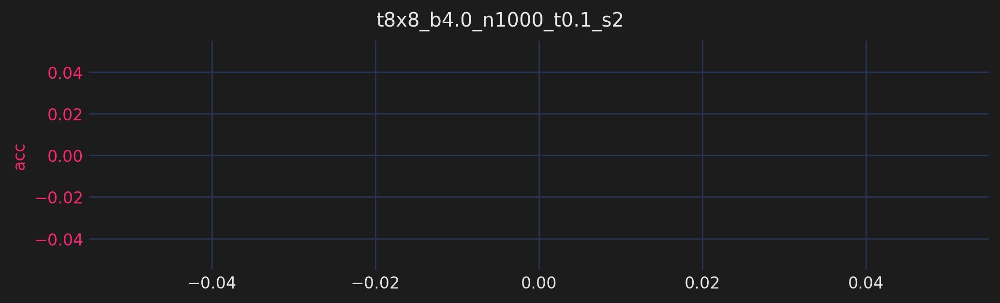

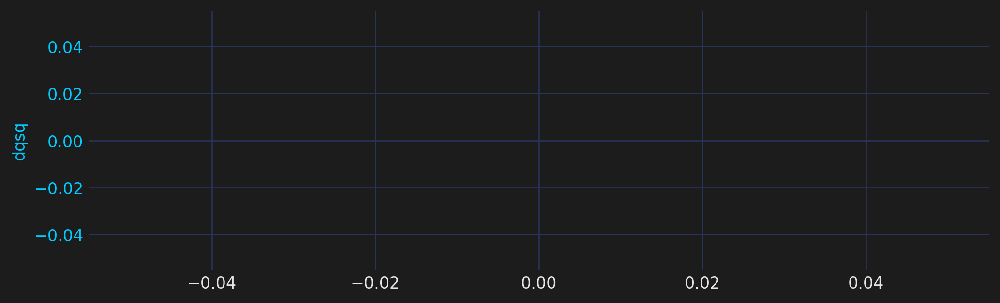

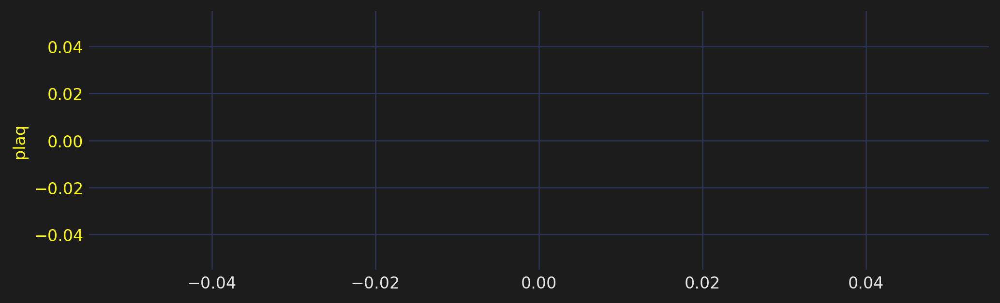

[13:29:47]  plaq=0.589 q=0.000

RuntimeError: element 0 of tensors does not require grad and does not have a grad_fn

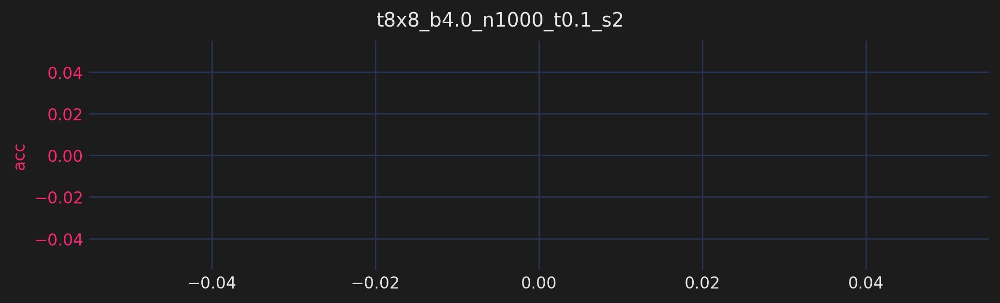

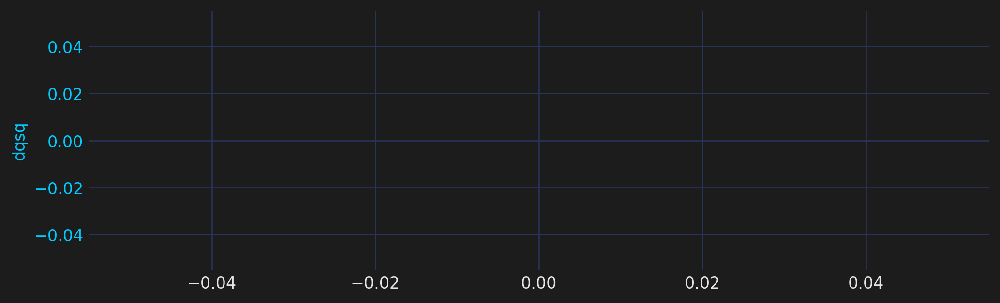

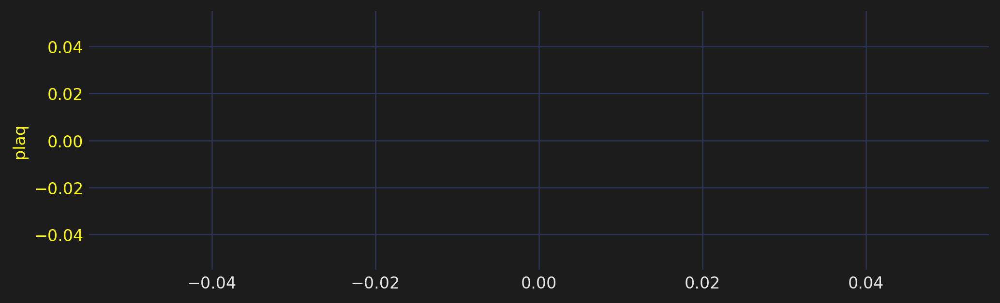

In [94]:
plt.style.use('~/.matplotlib/stylelib/molokai.mplstyle')

#x_ = x[None, :]
#x_.requires_grad_(True)
param.tau = 0.1
param.nstep = 2
x = param.initializer()
#param.tau = 0.25
#param.nstep = 5 
x_ = torch.ones(1, 2, 8, 8)

runs_history = field_transformation.run(x=x[None, :],  nprint=5,
                                        figsize=(8.5, 2.5),
                                        dpi=120, nplot=5)

In [87]:
from fthmc.hmc import HamiltonianMonteCarlo

hmc = HamiltonianMonteCarlo(param)

hmc.run()



from fthmc.hmc import run_hmc, run_hmc1

hmc_fields_arr,  hmc_histories = run_hmc1(param)

# Compare with training run above

In [ ]:
from fthmc.train import train
from fthmc.hmc import run_hmc
param = {
    'L': 8,
    'tau': 0.5,
    'nrun': 1,
    'beta': np.float32(4.),
    'nstep': 20,
    'ntraj': 1000,
    'nprint': 100,
    'seed': 1331,
}

train_config = TrainConfig(**{
    'n_era': 50,
    'n_epoch': 500,
    'n_layers': 24,
    'n_s_nets': 2,
    'hidden_sizes': [8, 8],
    'kernel_size': 5,
    'batch_size': 64,
    'print_freq': 100,
    'plot_freq': 100,
})


param = Param(**param)
logger.log(repr(train_config))

# ------------------------------
# Run HMC using `param` above
# ------------------------------

hmc_fields, hmc_history = run_hmc(param)


# ---------------------------------------
# Train model using `train_config` above
# ---------------------------------------

%matplotlib inline
plt.style.use('/lus/grand/projects/DLHMC/molokai.mplstyle')
sns.set_context('paper', font_scale=0.6)

train_outputs = train(param,
                      train_config,
                      model=None,
                      pre_model=None,
                      figsize=(5, 2))

pre_flow_plots = train_outputs['plots']
pre_flow_history = train_outputs['history']
flow_act = train_outputs['action']
pre_flow_model = train_outputs['model']
pre_flow_optimizer = train_outputs['optimizer']


# -----------------------------------------------------------
# Run inference on trained model and evaluate / plot metrics
# -----------------------------------------------------------
import fthmc.utils.qed_helpers as qed
from fthmc.utils.plot_helpers import plot_history
from fthmc.utils.samplers import make_mcmc_ensemble

action_fn = qed.BatchAction(param.beta)
dirs = train_outputs['dirs']
logdir = dirs['logdir']

inf_dir = os.path.join(logdir, 'inference')
inf_pdir = os.path.join(inf_dir, 'plots')
history = make_mcmc_ensemble(model=train_outputs['model'], action_fn=action_fn,
                             batch_size=train_config.batch_size, num_samples=1000)
plot_history(history=history,
             param=param, config=train_config, skip=['epoch', 'x'],
             num_chains=4, therm_frac=0.0, xlabel='MC Step', outdir=inf_pdir)

# Transfer to larger lattice

In [21]:
from dataclasses import asdict
from fthmc.train import train, transfer_to_new_lattice
%matplotlib inline

from torch import nn 

plt.style.use('default')
plt.style.use('/lus/grand/projects/DLHMC/molokai.mplstyle')
sns.set_context('paper', font_scale=0.6)


def transfer(
        L: int,
        param_init: Param,
        config_init: TrainConfig,
        layers_init: nn.ModuleList,
        new_lr: float = None,
        run_hmc: bool = True
):
    xfr = transfer_to_new_lattice(L=L,
                                  layers=layers,
                                  param_init=param_init)
    param_new = xfr['param']
    model_new = xfr['model']
    # ----------------------------------------------
    # Run HMC using new (transferred) `param` above
    # ----------------------------------------------
    if run_hmc:
        from fthmc.hmc import run_hmc
        hmc_fields, hmc_history = run_hmc(param_new)


    if new_lr is not None:
        cfg_dict = asdict(config_init)
        cfg_dict['base_lr'] = new_lr
        config_new = TrainConfig(**cfg_dict)
    else:
        config_new = config_init

    train_outputs = train(param_new,
                          config_new,
                          model=model_new,
                          pre_model=None,
                          figsize=(5, 2))
    return {
        'param': param_new,
        'config': config_new,
        'model': model_new,
        'outputs': train_outputs
    }

ModuleList(
  (0): GaugeEquivCouplingLayer(
    (plaq_coupling): NCPPlaqCouplingLayer(
      (net): Sequential(
        (0): Conv2d(2, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (1): SiLU()
        (2): Conv2d(8, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (3): SiLU()
        (4): Conv2d(8, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
      )
    )
  )
  (1): GaugeEquivCouplingLayer(
    (plaq_coupling): NCPPlaqCouplingLayer(
      (net): Sequential(
        (0): Conv2d(2, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (1): SiLU()
        (2): Conv2d(8, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (3): SiLU()
        (4): Conv2d(8, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
      )
    )
  )
  (2): GaugeEquivCouplingLayer(
    (plaq_coupling): NCPPlaqCouplingLaye

[22:18:46]  Creating directory: ../../logs/hmc/t8x8_b5.0_n1000_t0.5_s10/2021-06-21-221846

[22:18:46]  Creating directory:                                                              
            ../../logs/hmc/t8x8_b5.0_n1000_t0.5_s10/2021-06-21-221846/plots

[22:18:46]  Param:                                                                           
            ----------------                                                                 
            beta=5.0                                                                         
            L=8                                                                              
            tau=0.5                                                                          
            nstep=10                                                                         
            ntraj=1000                                                                       
            nrun=1                                                                           
            nprint=100                                                                       
            seed=1331                                                                        
            randinit=False                                                                   
            nth_interop=2                                                                    
            nth=2                                                                            
            lat=[8, 8]                                                                       
            nd=2                                                                             
            shape=[2, 8, 8]                                                                  
            volume=64                                                                        
            dt=0.05

──────────────────────────────── RUN: 0, last took: 0 m 0 s ─────────────────────────────────

            plaq=1.000 q=0.000

            traj=2 dt=0.006 acc=1.000 dH=-0.062 q=0 dqsq=0 plaq=0.919

[22:18:47]  traj=102 dt=0.006 acc=1.000 dH=0.029 q=0 dqsq=0 plaq=0.901

[22:18:48]  traj=202 dt=0.006 acc=1.000 dH=0.027 q=0 dqsq=0 plaq=0.919

            traj=302 dt=0.006 acc=1.000 dH=0.089 q=0 dqsq=0 plaq=0.888

[22:18:49]  traj=402 dt=0.006 acc=1.000 dH=0.038 q=0 dqsq=0 plaq=0.872

            traj=502 dt=0.006 acc=1.000 dH=-0.076 q=0 dqsq=0 plaq=0.905

[22:18:50]  traj=602 dt=0.006 acc=1.000 dH=-0.123 q=0 dqsq=0 plaq=0.887

            traj=702 dt=0.006 acc=1.000 dH=0.024 q=0 dqsq=0 plaq=0.894

[22:18:51]  traj=802 dt=0.006 acc=1.000 dH=0.034 q=0 dqsq=0 plaq=0.907

[22:18:52]  traj=902 dt=0.006 acc=1.000 dH=-0.047 q=0 dqsq=0 plaq=0.911

[22:18:52]  Creating directory:                                                              
            ../../logs/hmc/t8x8_b5.0_n1000_t0.5_s10/2021-06-21-221846/plots/run0

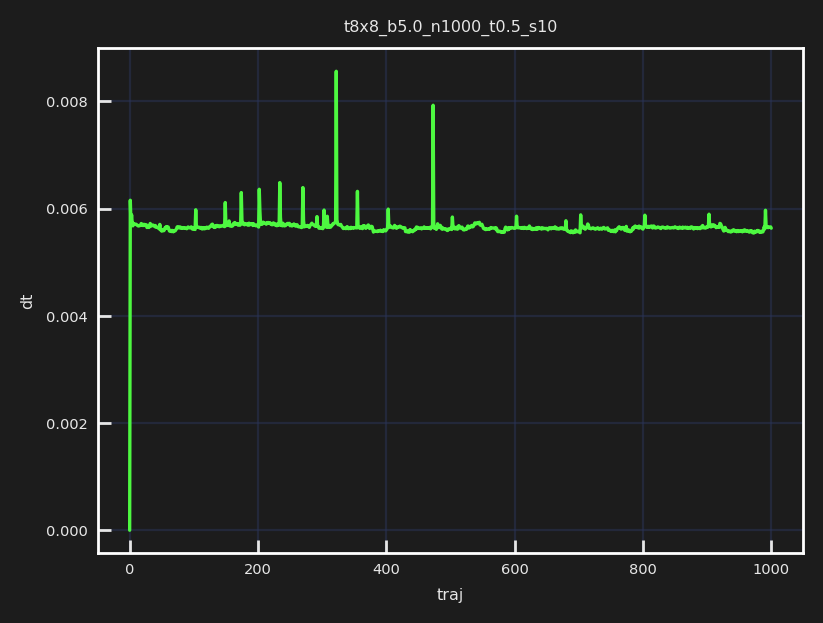

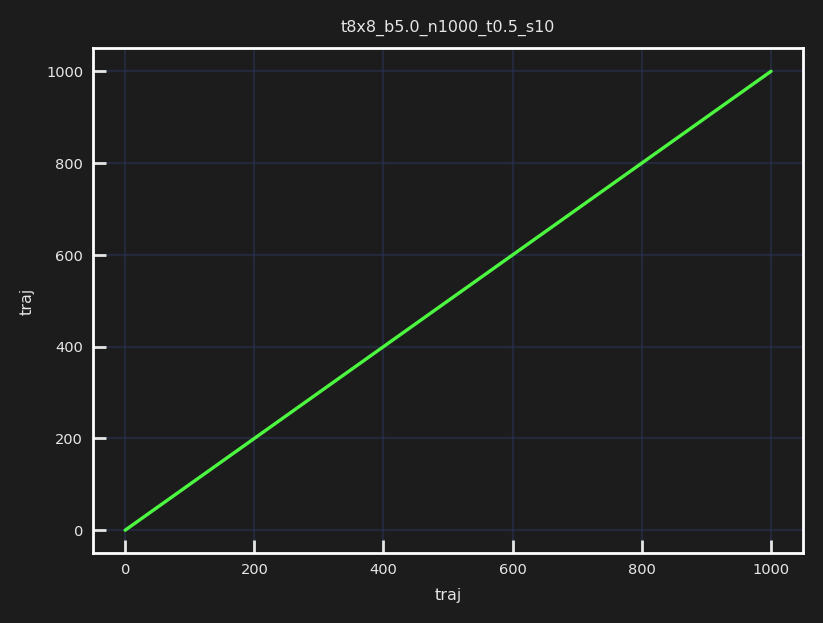

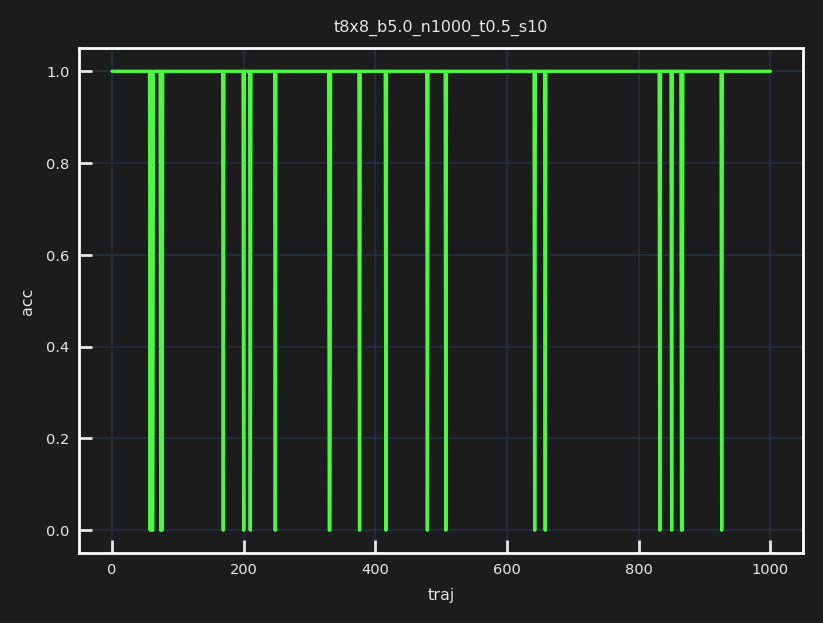

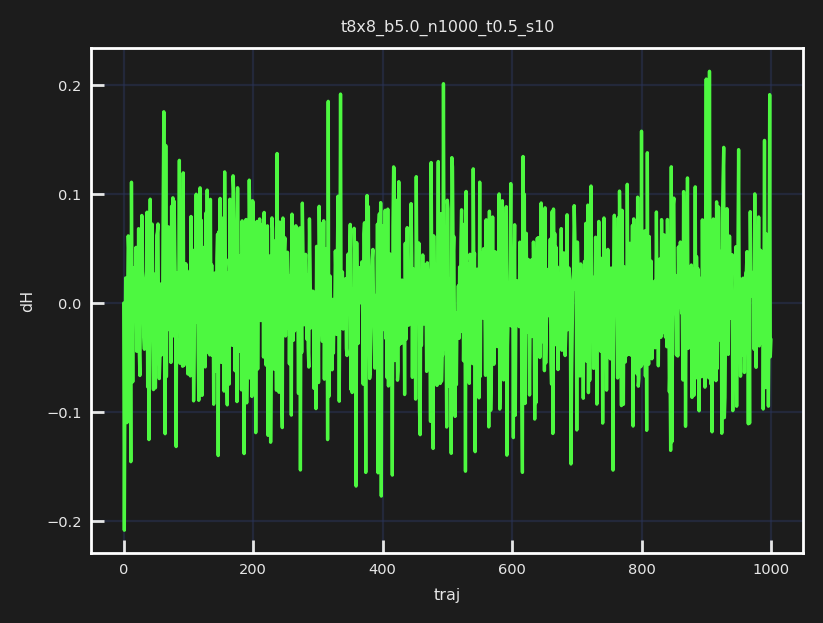

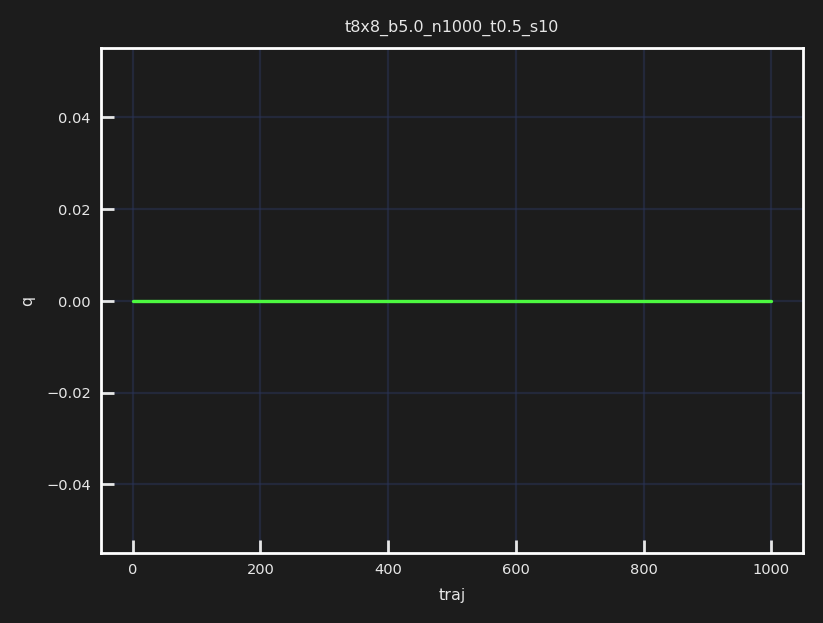

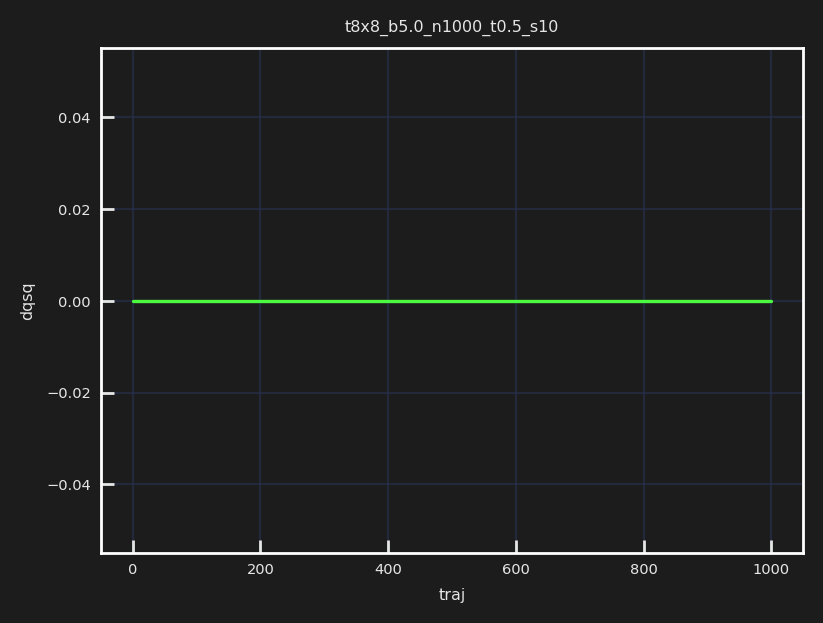

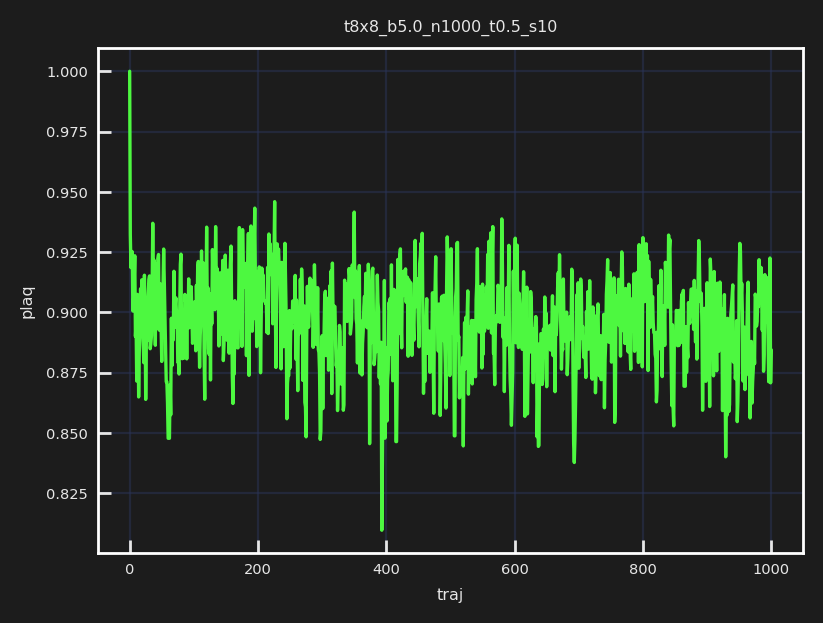

[22:18:54]  Run times: ['5.7975']

            Per trajectory: ['0.0058']

[22:18:54]  Saving hmc_histories to                                                          
            ../../logs/hmc/t8x8_b5.0_n1000_t0.5_s10/2021-06-21-221846/hmc_histories.z.

[22:18:54]  Saving hmc_fields_arr to                                                         
            ../../logs/hmc/t8x8_b5.0_n1000_t0.5_s10/2021-06-21-221846/hmc_fields_arr.z.

[22:18:54]  Creating directory: ../../logs/t8x8_b5.0_n1000_t0.5_s10/nb128_nh24_ns2_ks3_hl88_l
            r0.0001_era10_epoch1000/training/2021-06-21-221854

[22:18:54]  Creating directory: ../../logs/t8x8_b5.0_n1000_t0.5_s10/nb128_nh24_ns2_ks3_hl88_l
            r0.0001_era10_epoch1000/training/2021-06-21-221854/plots

[22:18:54]  Creating directory: ../../logs/t8x8_b5.0_n1000_t0.5_s10/nb128_nh24_ns2_ks3_hl88_l
            r0.0001_era10_epoch1000/training/2021-06-21-221854/checkpoints

[22:18:54]  Scheduler created!

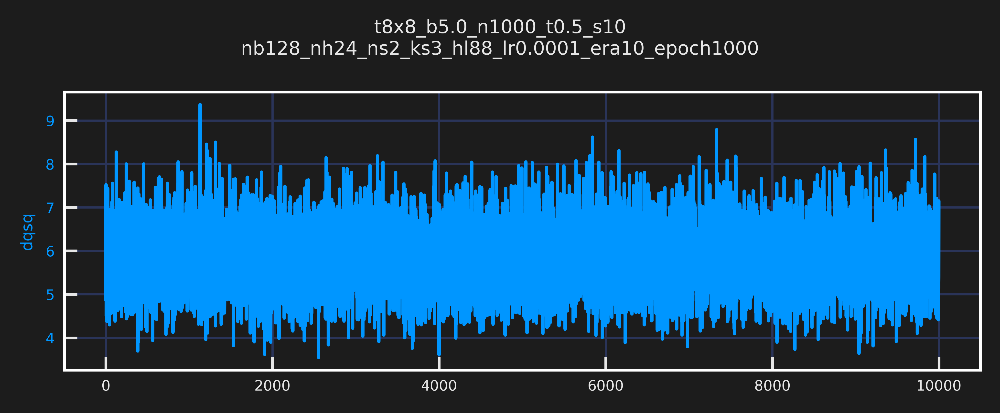

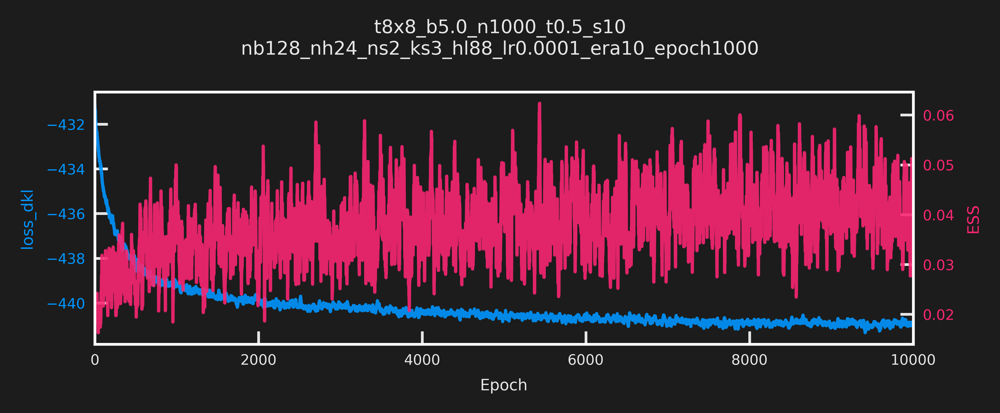

─────────────────────────────── ERA=0, last took: 0 min 0 sec ───────────────────────────────

[22:20:01]  (now) epoch: 499 dt=0.127 ess=0.022 loss_dkl=-437.964 logp=276.086 logq=-161.878 
            dqsq=6.625 plaq=0.863

            (avg) epoch: 499 dt=0.127 ess=0.029 loss_dkl=-437.980 logp=276.742 logq=-161.238 
            dqsq=5.769 plaq=0.865

[22:21:07]  (now) epoch: 999 dt=0.127 ess=0.070 loss_dkl=-438.883 logp=276.161 logq=-162.721 
            dqsq=5.391 plaq=0.863

            (avg) epoch: 999 dt=0.127 ess=0.045 loss_dkl=-439.076 logp=277.758 logq=-161.318 
            dqsq=5.776 plaq=0.868

[22:21:08]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t8x8_b5.0_n1000
            _t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/2021-06-21-22
            1854/checkpoints/ckpt-era0-epoch999.tar

───────────────────────────── ERA=1, last took: 2 min 12.89 sec ─────────────────────────────

[22:22:14]  (now) epoch: 499 dt=0.128 ess=0.025 loss_dkl=-439.497 logp=278.935 logq=-160.563 
            dqsq=4.875 plaq=0.872

            (avg) epoch: 499 dt=0.128 ess=0.042 loss_dkl=-439.759 logp=278.446 logq=-161.313 
            dqsq=5.979 plaq=0.870

[22:23:20]  (now) epoch: 999 dt=0.128 ess=0.033 loss_dkl=-440.089 logp=279.348 logq=-160.741 
            dqsq=5.766 plaq=0.873

            (avg) epoch: 999 dt=0.128 ess=0.027 loss_dkl=-439.818 logp=278.799 logq=-161.019 
            dqsq=5.585 plaq=0.871

[22:23:21]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t8x8_b5.0_n1000
            _t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/2021-06-21-22
            1854/checkpoints/ckpt-era1-epoch999.tar

───────────────────────────── ERA=2, last took: 2 min 12.69 sec ─────────────────────────────

[22:24:26]  (now) epoch: 499 dt=0.132 ess=0.017 loss_dkl=-440.023 logp=279.319 logq=-160.703 
            dqsq=5.805 plaq=0.873

            (avg) epoch: 499 dt=0.134 ess=0.038 loss_dkl=-440.171 logp=278.949 logq=-161.221 
            dqsq=5.797 plaq=0.872

[22:25:33]  (now) epoch: 999 dt=0.128 ess=0.021 loss_dkl=-440.620 logp=278.257 logq=-162.362 
            dqsq=6.461 plaq=0.870

[22:25:34]  (avg) epoch: 999 dt=0.128 ess=0.031 loss_dkl=-440.093 logp=278.867 logq=-161.226 
            dqsq=5.965 plaq=0.871

[22:25:35]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t8x8_b5.0_n1000
            _t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/2021-06-21-22
            1854/checkpoints/ckpt-era2-epoch999.tar

───────────────────────────── ERA=3, last took: 2 min 13.33 sec ─────────────────────────────

[22:26:44]  (now) epoch: 499 dt=0.137 ess=0.025 loss_dkl=-440.242 logp=279.472 logq=-160.770 
            dqsq=6.383 plaq=0.873

            (avg) epoch: 499 dt=0.137 ess=0.044 loss_dkl=-440.252 logp=279.208 logq=-161.043 
            dqsq=5.793 plaq=0.873

[22:27:53]  (now) epoch: 999 dt=0.132 ess=0.039 loss_dkl=-440.816 logp=280.050 logq=-160.766 
            dqsq=6.094 plaq=0.875

            (avg) epoch: 999 dt=0.132 ess=0.043 loss_dkl=-440.367 logp=278.846 logq=-161.522 
            dqsq=5.736 plaq=0.871

[22:27:54]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t8x8_b5.0_n1000
            _t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/2021-06-21-22
            1854/checkpoints/ckpt-era3-epoch999.tar

───────────────────────────── ERA=4, last took: 2 min 19.15 sec ─────────────────────────────

[22:29:00]  (now) epoch: 499 dt=0.138 ess=0.036 loss_dkl=-440.592 logp=279.237 logq=-161.355 
            dqsq=6.625 plaq=0.873

            (avg) epoch: 499 dt=0.130 ess=0.027 loss_dkl=-440.363 logp=278.981 logq=-161.382 
            dqsq=5.815 plaq=0.872

[22:30:08]  (now) epoch: 999 dt=0.130 ess=0.062 loss_dkl=-440.433 logp=278.883 logq=-161.550 
            dqsq=5.398 plaq=0.872

            (avg) epoch: 999 dt=0.130 ess=0.049 loss_dkl=-440.750 logp=279.451 logq=-161.299 
            dqsq=5.712 plaq=0.873

[22:30:09]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t8x8_b5.0_n1000
            _t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/2021-06-21-22
            1854/checkpoints/ckpt-era4-epoch999.tar

───────────────────────────── ERA=5, last took: 2 min 14.4 sec ──────────────────────────────

[22:31:16]  (now) epoch: 499 dt=0.133 ess=0.009 loss_dkl=-440.502 logp=280.040 logq=-160.463 
            dqsq=4.852 plaq=0.875

            (avg) epoch: 499 dt=0.133 ess=0.034 loss_dkl=-440.601 logp=279.254 logq=-161.347 
            dqsq=6.062 plaq=0.873

[22:32:26]  (now) epoch: 999 dt=0.138 ess=0.022 loss_dkl=-440.376 logp=278.650 logq=-161.725 
            dqsq=6.031 plaq=0.871

            (avg) epoch: 999 dt=0.134 ess=0.032 loss_dkl=-440.539 logp=279.023 logq=-161.517 
            dqsq=5.909 plaq=0.872

[22:32:27]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t8x8_b5.0_n1000
            _t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/2021-06-21-22
            1854/checkpoints/ckpt-era5-epoch999.tar

───────────────────────────── ERA=6, last took: 2 min 17.75 sec ─────────────────────────────

[22:33:34]  (now) epoch: 499 dt=0.131 ess=0.030 loss_dkl=-440.530 logp=278.719 logq=-161.812 
            dqsq=6.984 plaq=0.871

            (avg) epoch: 499 dt=0.131 ess=0.049 loss_dkl=-440.669 logp=279.318 logq=-161.351 
            dqsq=5.979 plaq=0.873

[22:34:41]  (now) epoch: 999 dt=0.131 ess=0.080 loss_dkl=-441.407 logp=280.187 logq=-161.220 
            dqsq=5.305 plaq=0.876

            (avg) epoch: 999 dt=0.130 ess=0.034 loss_dkl=-440.909 logp=279.460 logq=-161.449 
            dqsq=5.650 plaq=0.873

[22:34:43]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t8x8_b5.0_n1000
            _t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/2021-06-21-22
            1854/checkpoints/ckpt-era6-epoch999.tar

───────────────────────────── ERA=7, last took: 2 min 15.4 sec ──────────────────────────────

[22:35:50]  (now) epoch: 499 dt=0.130 ess=0.062 loss_dkl=-441.468 logp=280.428 logq=-161.040 
            dqsq=5.984 plaq=0.876

            (avg) epoch: 499 dt=0.130 ess=0.044 loss_dkl=-440.928 logp=279.252 logq=-161.676 
            dqsq=5.779 plaq=0.873

[22:36:59]  (now) epoch: 999 dt=0.134 ess=0.033 loss_dkl=-440.369 logp=277.852 logq=-162.517 
            dqsq=5.609 plaq=0.868

            (avg) epoch: 999 dt=0.135 ess=0.037 loss_dkl=-440.848 logp=279.428 logq=-161.420 
            dqsq=5.629 plaq=0.873

[22:37:00]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t8x8_b5.0_n1000
            _t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/2021-06-21-22
            1854/checkpoints/ckpt-era7-epoch999.tar

───────────────────────────── ERA=8, last took: 2 min 17.15 sec ─────────────────────────────

[22:38:07]  (now) epoch: 499 dt=0.130 ess=0.031 loss_dkl=-440.727 logp=278.715 logq=-162.012 
            dqsq=4.687 plaq=0.871

            (avg) epoch: 499 dt=0.130 ess=0.041 loss_dkl=-441.042 logp=279.973 logq=-161.070 
            dqsq=5.609 plaq=0.875

[22:39:15]  (now) epoch: 999 dt=0.133 ess=0.024 loss_dkl=-441.354 logp=280.587 logq=-160.768 
            dqsq=5.711 plaq=0.877

            (avg) epoch: 999 dt=0.134 ess=0.039 loss_dkl=-441.018 logp=279.975 logq=-161.042 
            dqsq=5.667 plaq=0.875

[22:39:17]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t8x8_b5.0_n1000
            _t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/2021-06-21-22
            1854/checkpoints/ckpt-era8-epoch999.tar

───────────────────────────── ERA=9, last took: 2 min 15.61 sec ─────────────────────────────

[22:40:25]  (now) epoch: 499 dt=0.130 ess=0.051 loss_dkl=-441.454 logp=280.475 logq=-160.978 
            dqsq=6.891 plaq=0.876

            (avg) epoch: 499 dt=0.130 ess=0.040 loss_dkl=-441.078 logp=280.039 logq=-161.040 
            dqsq=5.793 plaq=0.875

[22:41:33]  (now) epoch: 999 dt=0.130 ess=0.031 loss_dkl=-440.961 logp=279.972 logq=-160.989 
            dqsq=7.148 plaq=0.875

            (avg) epoch: 999 dt=0.130 ess=0.045 loss_dkl=-440.967 logp=280.087 logq=-160.880 
            dqsq=5.933 plaq=0.875

[22:41:34]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t8x8_b5.0_n1000
            _t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/2021-06-21-22
            1854/checkpoints/ckpt-era9-epoch999.tar

[22:41:35]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t8x8_b5.0_n1000
            _t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/2021-06-21-22
            1854/checkpoints/ckpt-era10-epoch1001.tar

[22:41:36]  Saving live plots to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t8x8_b5.0_n1000
            _t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/2021-06-21-22
            1854/plots

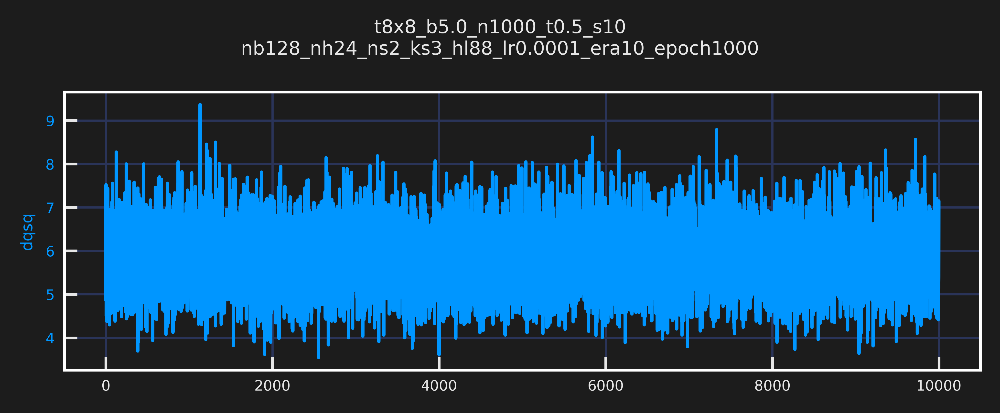

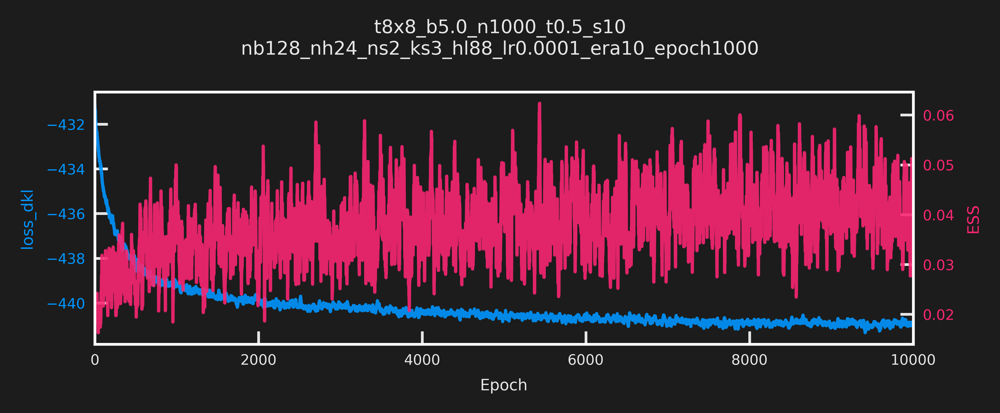

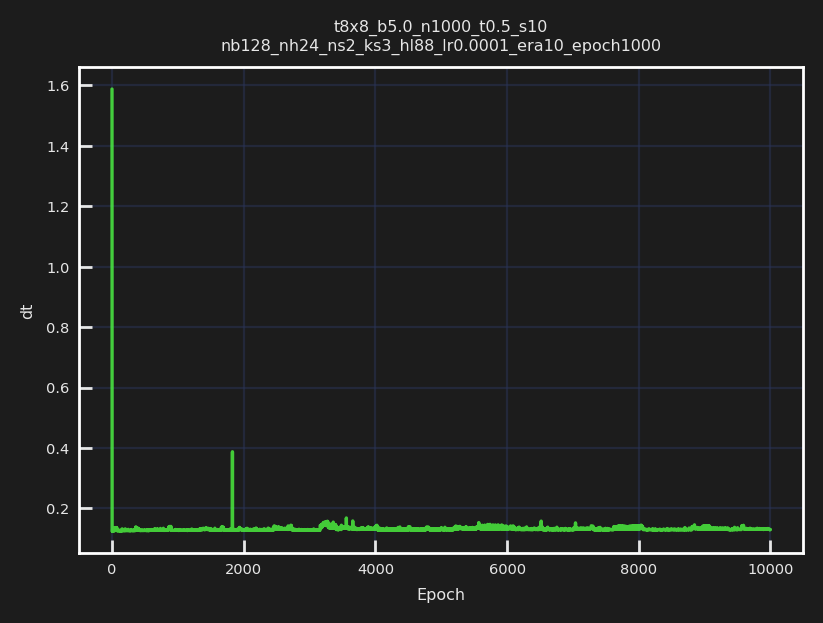

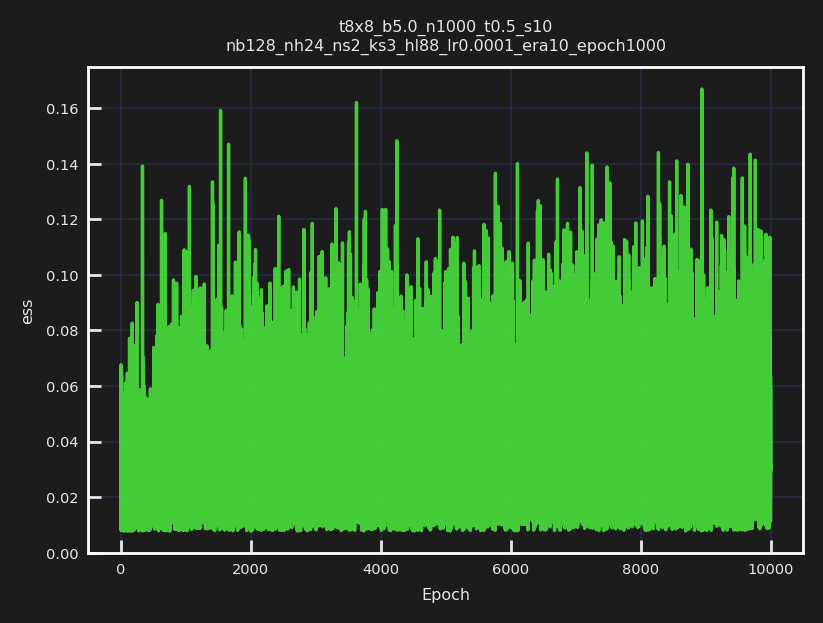

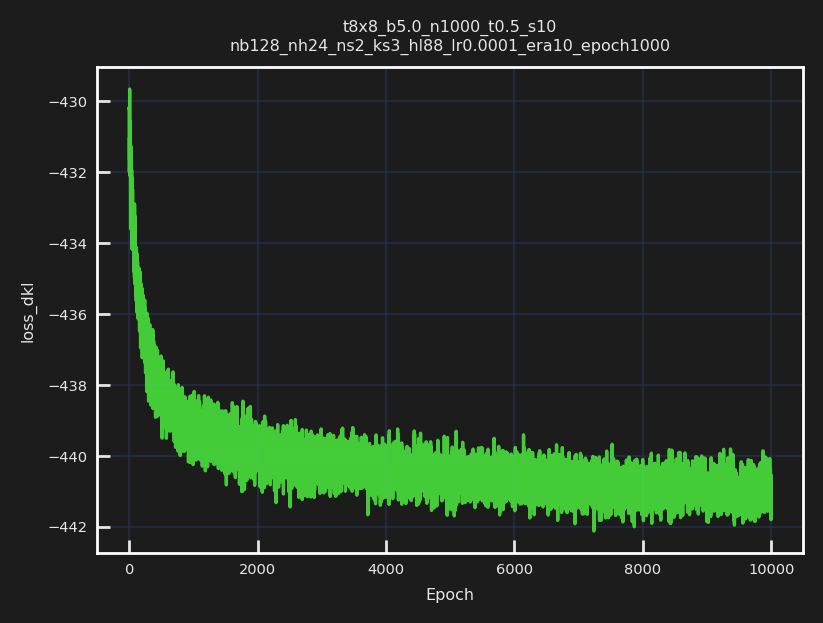

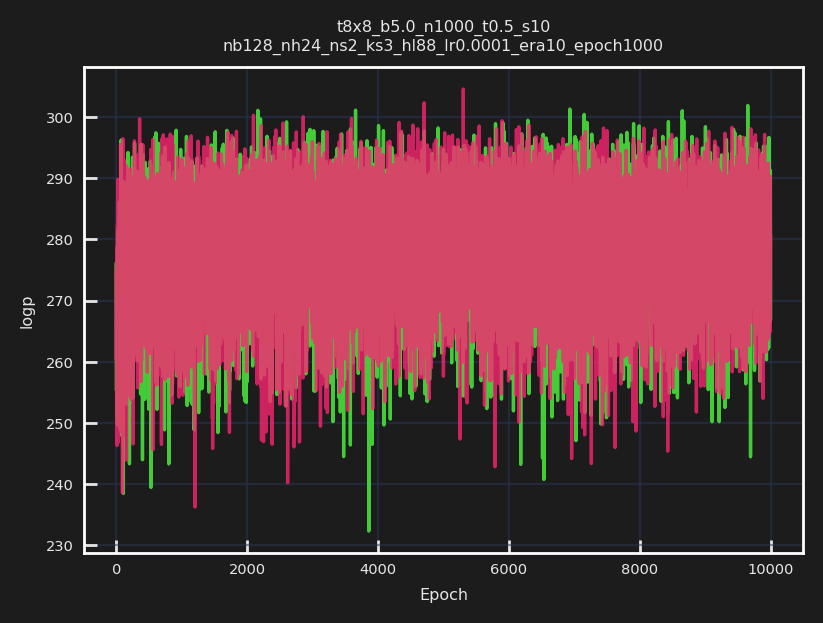

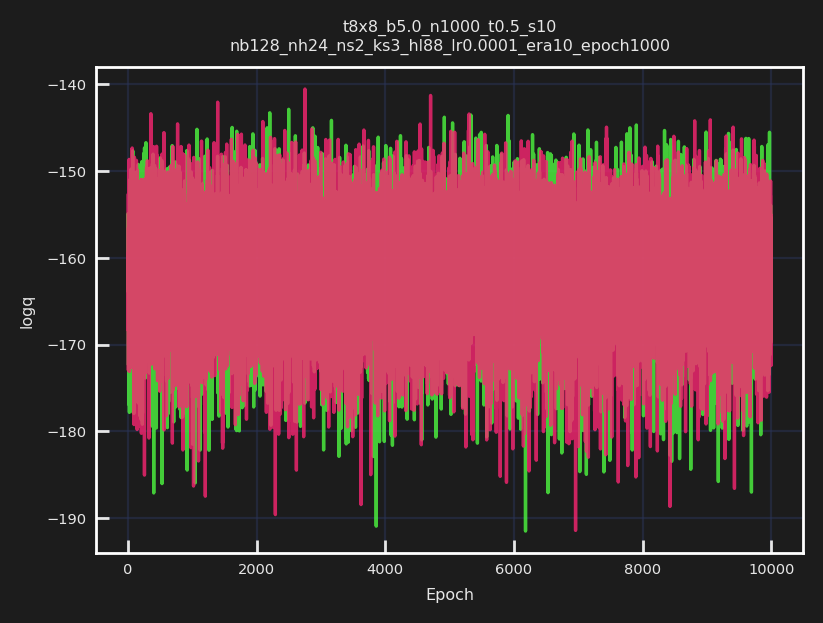

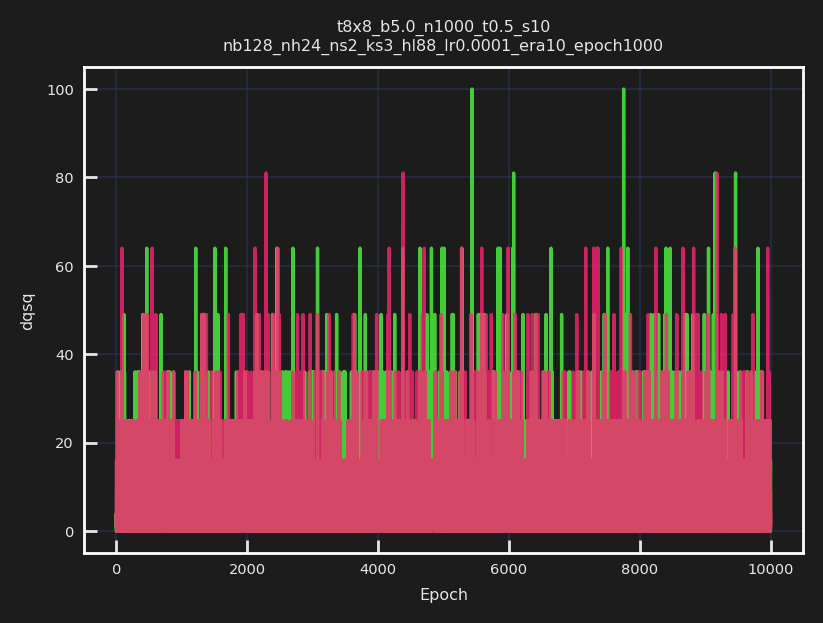

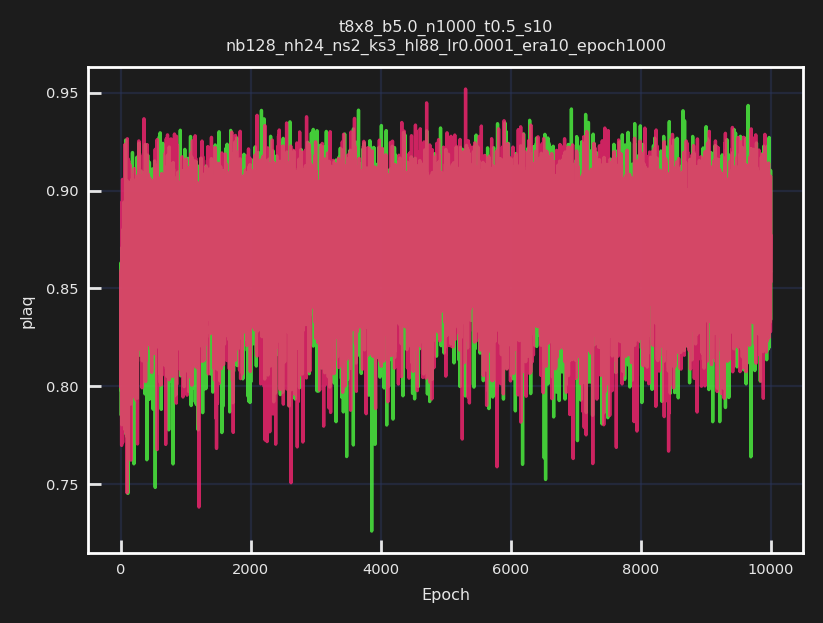

[22:41:40]  Saving train_history to ../../logs/t8x8_b5.0_n1000_t0.5_s10/nb128_nh24_ns2_ks3_hl
            88_lr0.0001_era10_epoch1000/training/2021-06-21-221854/train_history.z.

In [13]:
layers = train_outputs['model'].layers #['layers']
layers.train()
train_outputs8 = transfer(L=8, param_init=param,
                          config_init=train_config,
                          layers_init=layers, 
                          new_lr=0.0001, run_hmc=True)

In [16]:
from dataclasses import asdict

param8 = Param(**asdict(param))
logger.log(param8)

train_config8 = TrainConfig(**asdict(train_config))
train_config8.base_lr = 0.0001

[23:06:12]  Param:                                                                           
            ----------------                                                                 
            beta=5.0                                                                         
            L=4                                                                              
            tau=0.5                                                                          
            nstep=10                                                                         
            ntraj=1000                                                                       
            nrun=1                                                                           
            nprint=100                                                                       
            seed=1331                                                                        
            randinit=False                                                                   
            nth_interop=2                                                                    
            nth=2                                                                            
            lat=[4, 4]                                                                       
            nd=2                                                                             
            shape=[2, 4, 4]                                                                  
            volume=16                                                                        
            dt=0.05

[23:08:30]  Existing file found!                                                             
            Renaming outfile to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t8x8_b5.0_n1000_
            t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/inference/plots/ess_230
            830.pdf

[23:08:31]  Existing file found!                                                             
            Renaming outfile to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t8x8_b5.0_n1000_
            t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/inference/plots/q_23083
            1.pdf

            Existing file found!                                                             
            Renaming outfile to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t8x8_b5.0_n1000_
            t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/inference/plots/dqsq_23
            0831.pdf

            Existing file found!                                                             
            Renaming outfile to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t8x8_b5.0_n1000_
            t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/inference/plots/dkl_230
            831.pdf

            Existing file found!                                                             
            Renaming outfile to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t8x8_b5.0_n1000_
            t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/inference/plots/logq_23
            0831.pdf

            Existing file found!                                                             
            Renaming outfile to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t8x8_b5.0_n1000_
            t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/inference/plots/logp_23
            0831.pdf

            Existing file found!                                                             
            Renaming outfile to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t8x8_b5.0_n1000_
            t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/inference/plots/accepte
            d_230831.pdf

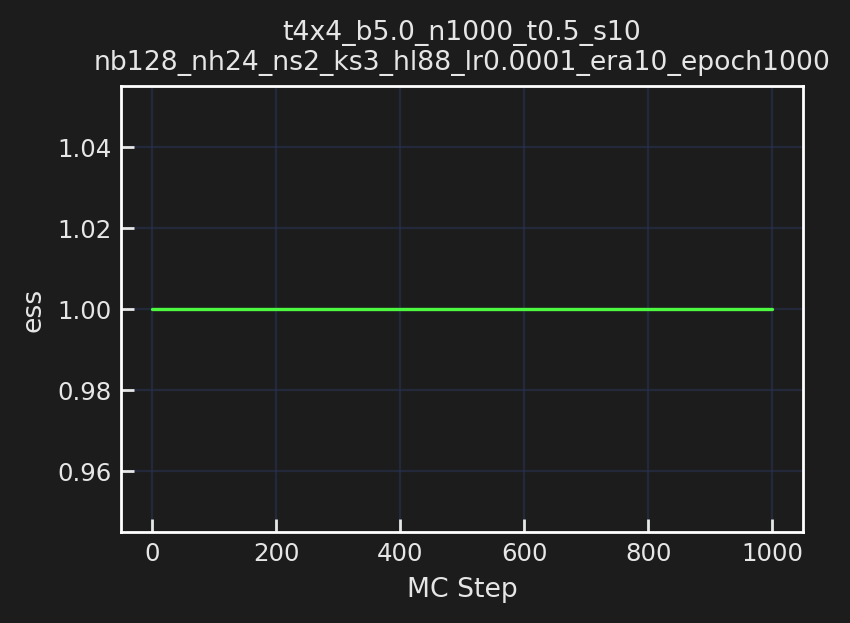

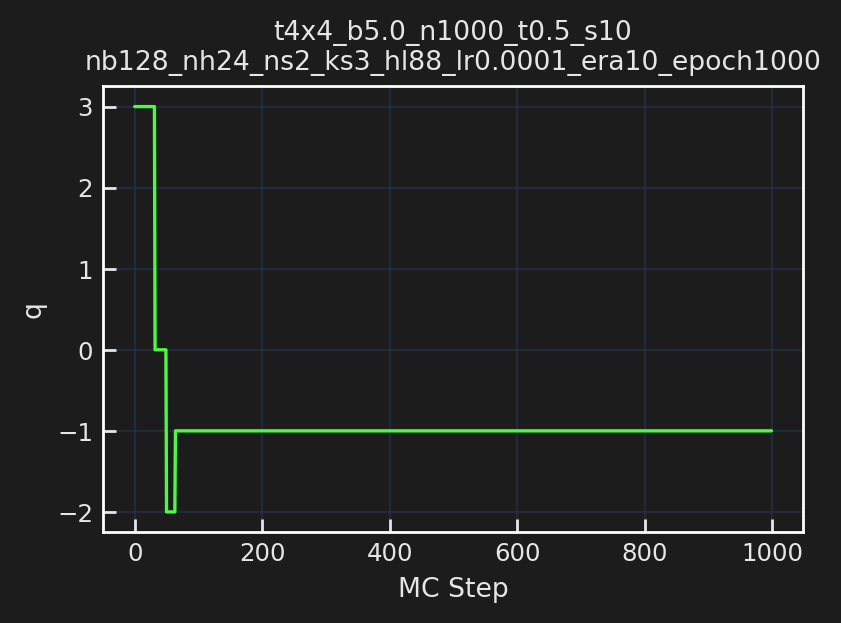

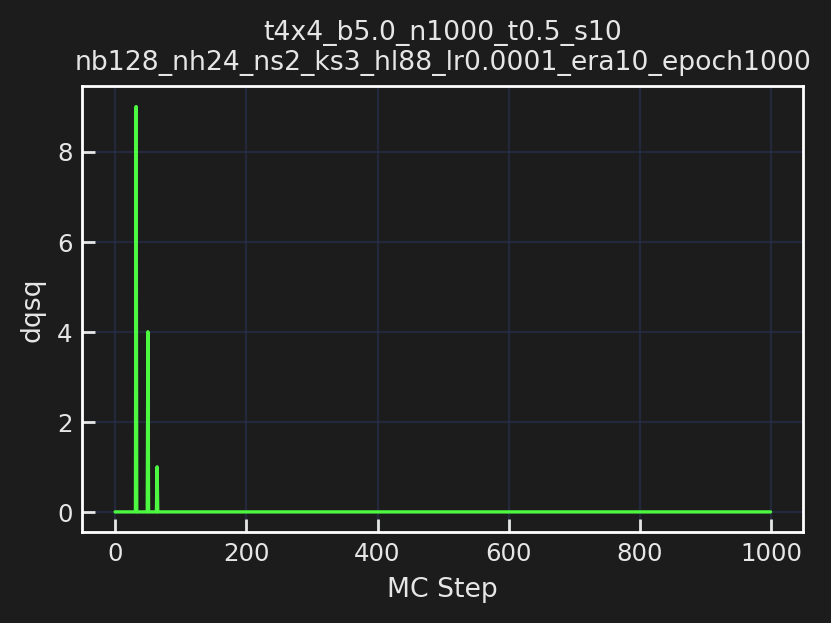

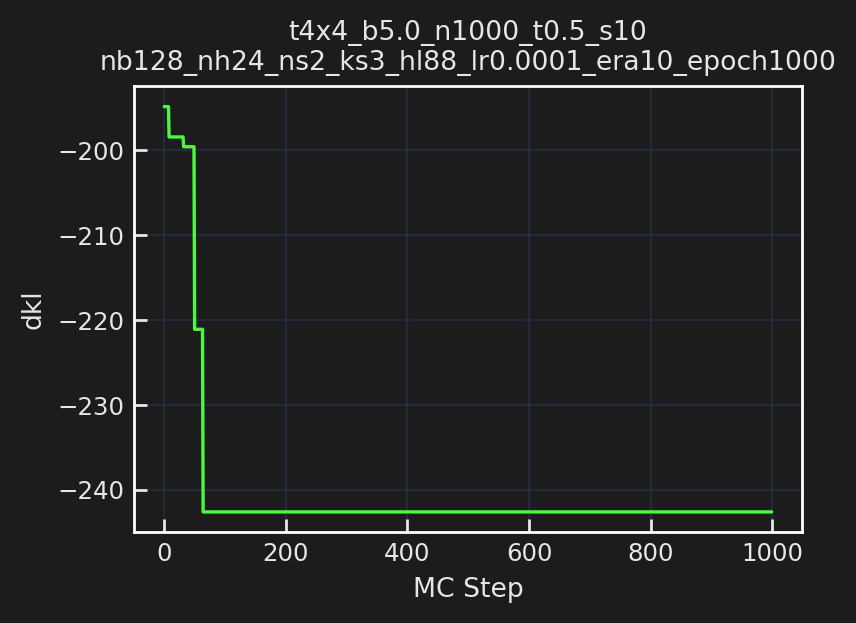

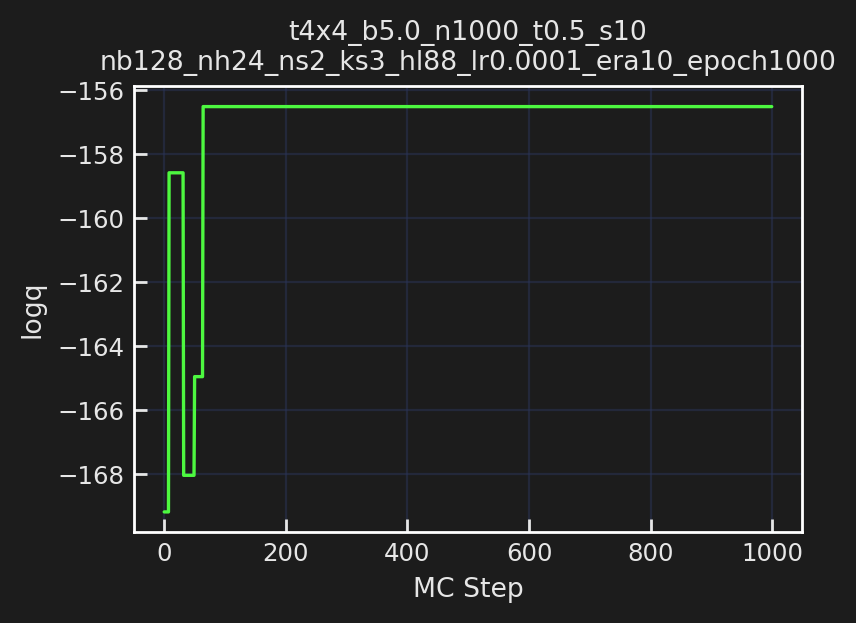

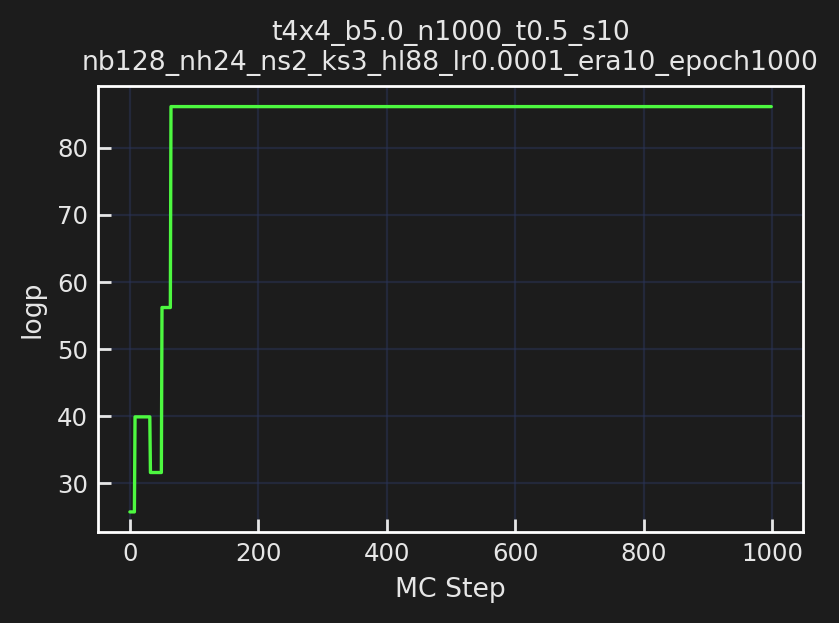

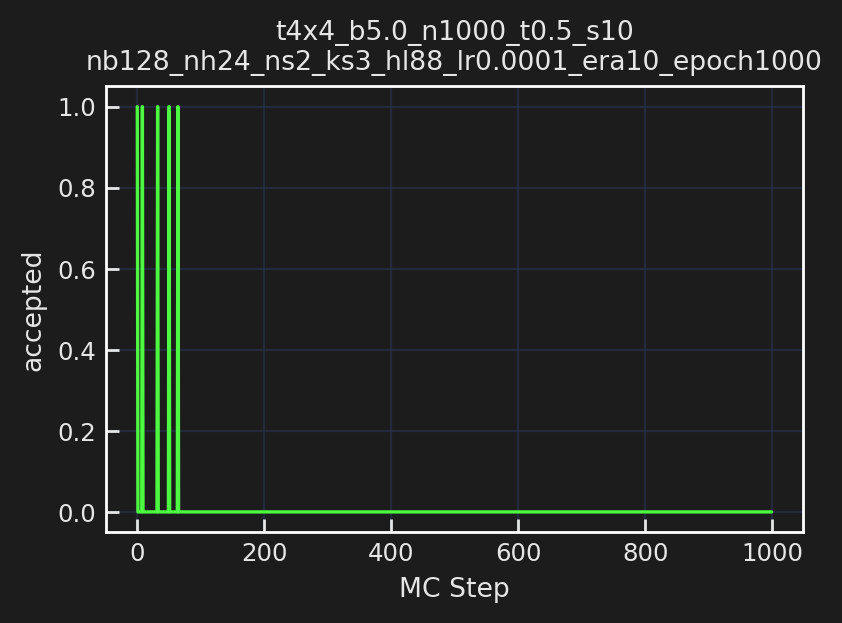

In [20]:
# ----------------------------------------------------------------
# Run inference on transferred model and evaluate / plot metrics
# ----------------------------------------------------------------
import fthmc.utils.qed_helpers as qed
from fthmc.utils.plot_helpers import plot_history
from fthmc.utils.samplers import make_mcmc_ensemble

sns.set_context('paper')
action_fn8 = qed.BatchAction(param8.beta)
dirs8 = train_outputs8['dirs']
logdir8 = dirs8['logdir']

inf_dir8 = os.path.join(logdir8, 'inference')
inf_pdir8 = os.path.join(inf_dir8, 'plots')
history8 = make_mcmc_ensemble(model=train_outputs8['model'],
                               action_fn=action_fn8,
                               batch_size=train_config8.batch_size,
                               num_samples=1000)
plot_history(history=history8,
             param=param8, config=train_config8, skip=['epoch', 'x'],
             num_chains=4, therm_frac=0.0, xlabel='MC Step', outdir=inf_pdir8)

ModuleList(
  (0): GaugeEquivCouplingLayer(
    (plaq_coupling): NCPPlaqCouplingLayer(
      (net): Sequential(
        (0): Conv2d(2, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (1): SiLU()
        (2): Conv2d(8, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (3): SiLU()
        (4): Conv2d(8, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
      )
    )
  )
  (1): GaugeEquivCouplingLayer(
    (plaq_coupling): NCPPlaqCouplingLayer(
      (net): Sequential(
        (0): Conv2d(2, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (1): SiLU()
        (2): Conv2d(8, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (3): SiLU()
        (4): Conv2d(8, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
      )
    )
  )
  (2): GaugeEquivCouplingLayer(
    (plaq_coupling): NCPPlaqCouplingLaye

[23:11:36]  Creating directory: ../../logs/hmc/t16x16_b5.0_n1000_t0.5_s10/plots

[23:11:36]  Param:                                                                           
            ----------------                                                                 
            beta=5.0                                                                         
            L=16                                                                             
            tau=0.5                                                                          
            nstep=10                                                                         
            ntraj=1000                                                                       
            nrun=1                                                                           
            nprint=100                                                                       
            seed=1331                                                                        
            randinit=False                                                                   
            nth_interop=2                                                                    
            nth=2                                                                            
            lat=[16, 16]                                                                     
            nd=2                                                                             
            shape=[2, 16, 16]                                                                
            volume=256                                                                       
            dt=0.05

──────────────────────────────── RUN: 0, last took: 0 m 0 s ─────────────────────────────────

            plaq=1.000 q=0.000

            traj=2 dt=0.007 acc=1.000 dH=-0.064 q=0 dqsq=0 plaq=0.937

[23:11:37]  traj=102 dt=0.006 acc=1.000 dH=0.001 q=0 dqsq=0 plaq=0.903

            traj=202 dt=0.007 acc=1.000 dH=0.010 q=0 dqsq=0 plaq=0.906

[23:11:38]  traj=302 dt=0.006 acc=1.000 dH=-0.053 q=0 dqsq=0 plaq=0.895

[23:11:39]  traj=402 dt=0.006 acc=1.000 dH=0.071 q=0 dqsq=0 plaq=0.906

            traj=502 dt=0.006 acc=1.000 dH=-0.300 q=-1 dqsq=0 plaq=0.878

[23:11:40]  traj=602 dt=0.006 acc=1.000 dH=-0.128 q=-1 dqsq=1 plaq=0.897

            traj=702 dt=0.006 acc=1.000 dH=0.001 q=-1 dqsq=0 plaq=0.890

[23:11:41]  traj=802 dt=0.006 acc=1.000 dH=-0.092 q=-1 dqsq=0 plaq=0.870

[23:11:42]  traj=902 dt=0.006 acc=1.000 dH=-0.013 q=0 dqsq=0 plaq=0.894

[23:11:42]  Creating directory: ../../logs/hmc/t16x16_b5.0_n1000_t0.5_s10/plots/run0

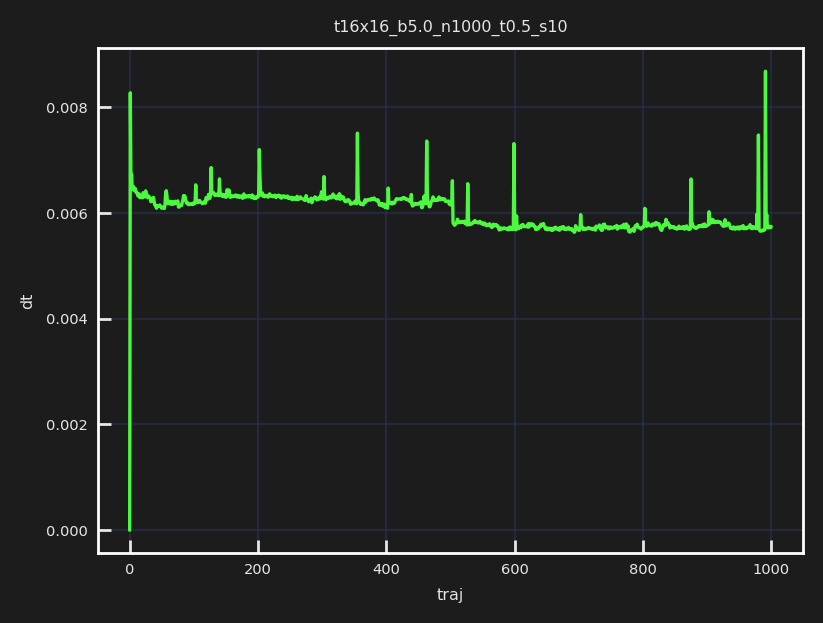

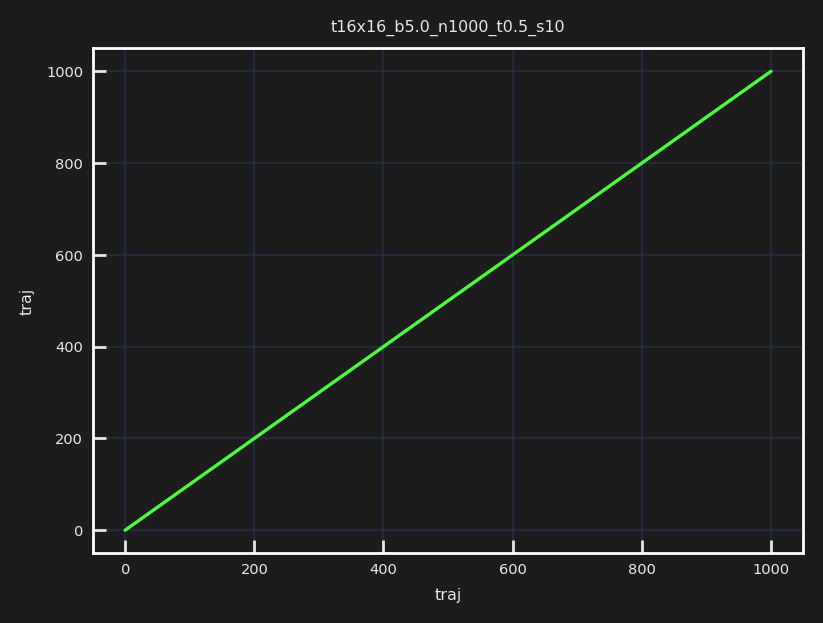

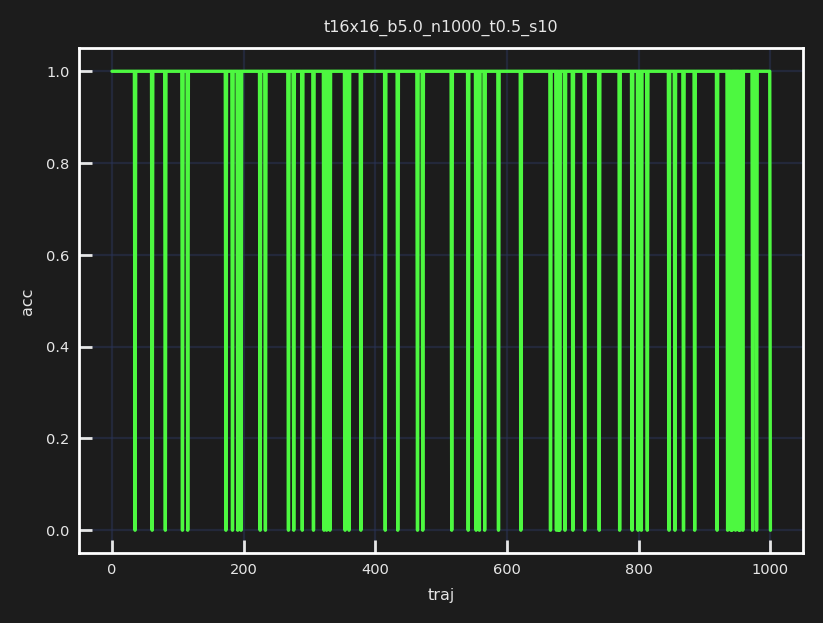

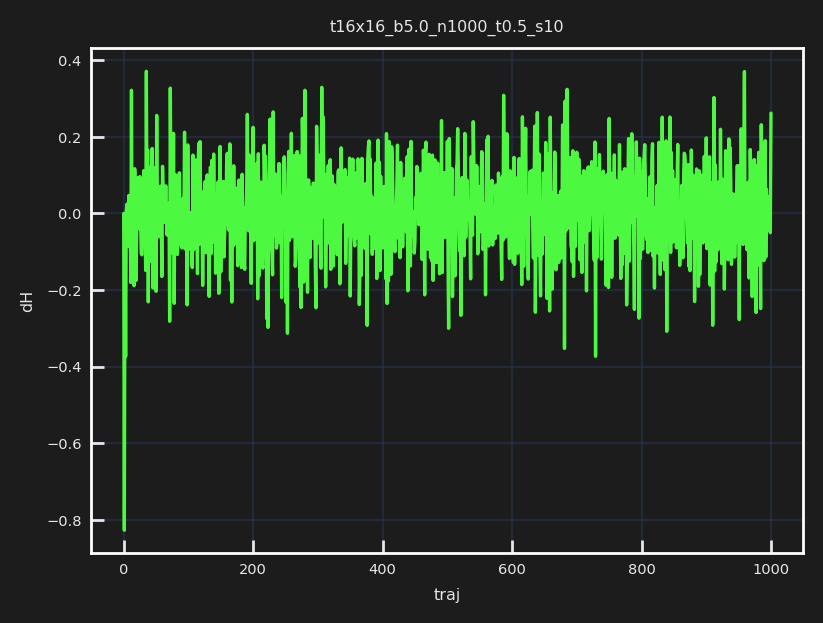

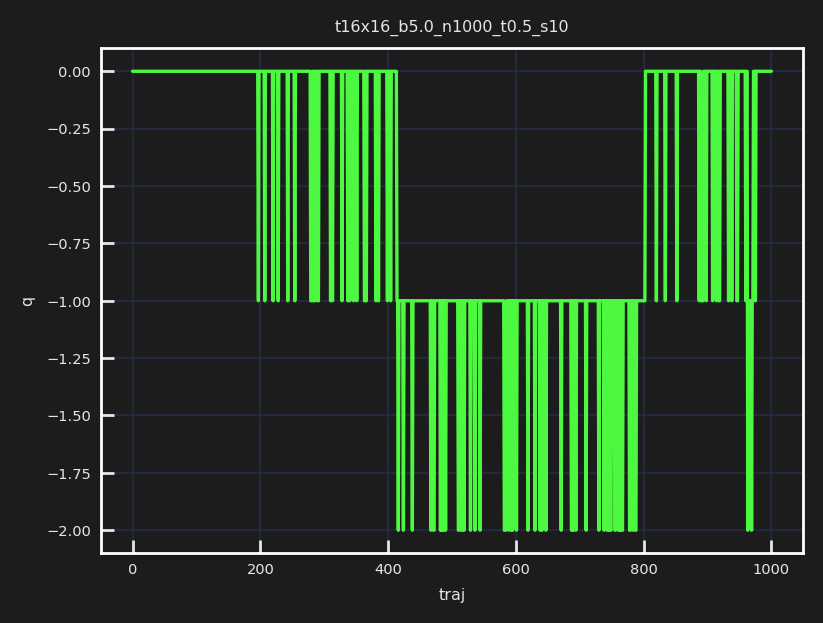

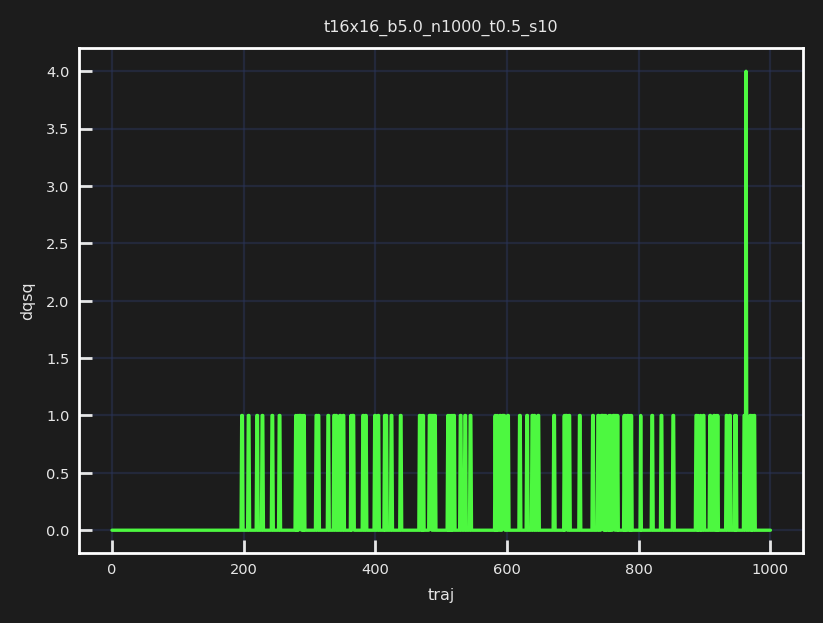

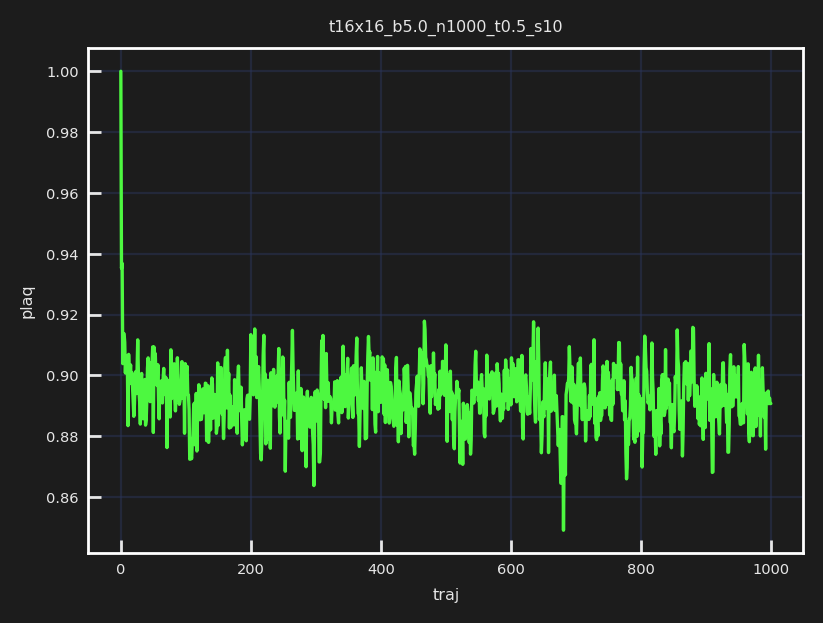

[23:11:44]  Run times: ['6.1637']

            Per trajectory: ['0.0062']

[23:11:44]  Saving hmc_histories to                                                          
            ../../logs/hmc/t16x16_b5.0_n1000_t0.5_s10/hmc_histories.z.

[23:11:45]  Saving hmc_fields_arr to                                                         
            ../../logs/hmc/t16x16_b5.0_n1000_t0.5_s10/hmc_fields_arr.z.

[23:11:45]  Creating directory: ../../logs/t16x16_b5.0_n1000_t0.5_s10/nb128_nh24_ns2_ks3_hl88
            _lr0.0001_era10_epoch1000

[23:11:45]  Creating directory: ../../logs/t16x16_b5.0_n1000_t0.5_s10/nb128_nh24_ns2_ks3_hl88
            _lr0.0001_era10_epoch1000/training

[23:11:45]  Creating directory: ../../logs/t16x16_b5.0_n1000_t0.5_s10/nb128_nh24_ns2_ks3_hl88
            _lr0.0001_era10_epoch1000/training/plots

[23:11:45]  Creating directory: ../../logs/t16x16_b5.0_n1000_t0.5_s10/nb128_nh24_ns2_ks3_hl88
            _lr0.0001_era10_epoch1000/training/checkpoints

[23:11:45]  Scheduler created!

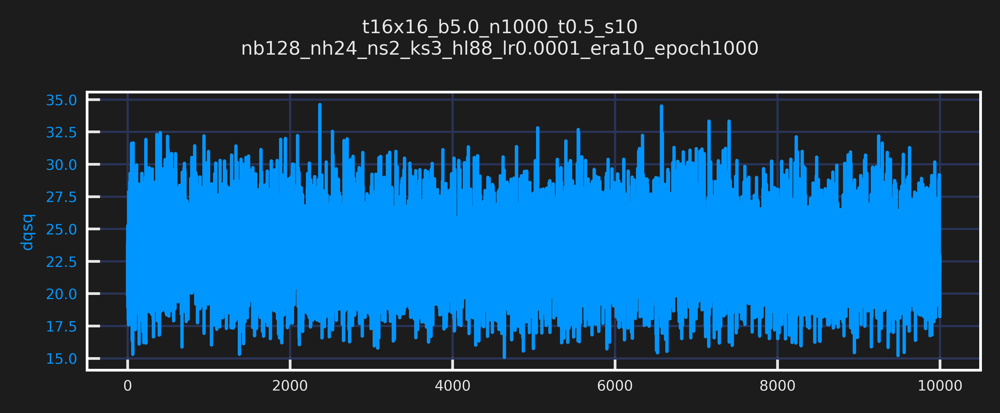

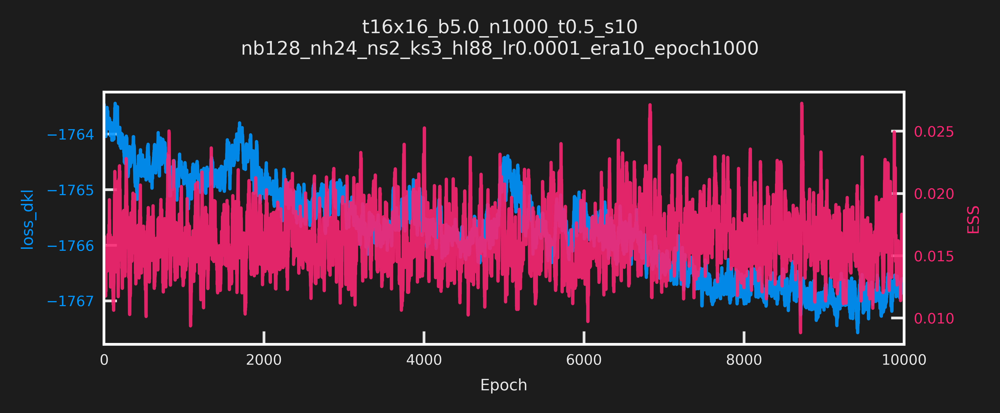

─────────────────────────────── ERA=0, last took: 0 min 0 sec ───────────────────────────────

[23:12:53]  (now) epoch: 499 dt=0.132 ess=0.021 loss_dkl=-1764.314 logp=1119.397             
            logq=-644.917 dqsq=31.117 plaq=0.875

            (avg) epoch: 499 dt=0.133 ess=0.016 loss_dkl=-1764.553 logp=1119.239             
            logq=-645.314 dqsq=23.265 plaq=0.874

[23:14:02]  (now) epoch: 999 dt=0.132 ess=0.010 loss_dkl=-1764.322 logp=1116.355             
            logq=-647.967 dqsq=23.477 plaq=0.872

            (avg) epoch: 999 dt=0.133 ess=0.014 loss_dkl=-1764.716 logp=1119.744             
            logq=-644.972 dqsq=23.305 plaq=0.875

[23:14:03]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t16x16_b5.0_n10
            00_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/checkpoints
            /ckpt-era0-epoch999.tar

───────────────────────────── ERA=1, last took: 2 min 17.06 sec ─────────────────────────────

[23:15:12]  (now) epoch: 499 dt=0.132 ess=0.019 loss_dkl=-1765.069 logp=1121.492             
            logq=-643.577 dqsq=28.250 plaq=0.876

            (avg) epoch: 499 dt=0.208 ess=0.017 loss_dkl=-1764.751 logp=1121.069             
            logq=-643.683 dqsq=24.691 plaq=0.876

[23:16:22]  (now) epoch: 999 dt=0.132 ess=0.008 loss_dkl=-1764.598 logp=1119.830             
            logq=-644.768 dqsq=21.445 plaq=0.875

            (avg) epoch: 999 dt=0.132 ess=0.014 loss_dkl=-1764.980 logp=1120.551             
            logq=-644.429 dqsq=23.460 plaq=0.875

[23:16:23]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t16x16_b5.0_n10
            00_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/checkpoints
            /ckpt-era1-epoch999.tar

───────────────────────────── ERA=2, last took: 2 min 20.18 sec ─────────────────────────────

[23:17:31]  (now) epoch: 499 dt=0.133 ess=0.013 loss_dkl=-1765.598 logp=1122.684             
            logq=-642.914 dqsq=25.242 plaq=0.877

            (avg) epoch: 499 dt=0.132 ess=0.014 loss_dkl=-1765.442 logp=1120.870             
            logq=-644.571 dqsq=22.111 plaq=0.876

[23:18:40]  (now) epoch: 999 dt=0.132 ess=0.010 loss_dkl=-1765.166 logp=1120.650             
            logq=-644.515 dqsq=25.883 plaq=0.876

            (avg) epoch: 999 dt=0.132 ess=0.018 loss_dkl=-1765.177 logp=1121.645             
            logq=-643.532 dqsq=22.620 plaq=0.876

[23:18:41]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t16x16_b5.0_n10
            00_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/checkpoints
            /ckpt-era2-epoch999.tar

───────────────────────────── ERA=3, last took: 2 min 18.14 sec ─────────────────────────────

[23:19:49]  (now) epoch: 499 dt=0.136 ess=0.012 loss_dkl=-1766.067 logp=1123.451             
            logq=-642.616 dqsq=24.641 plaq=0.878

            (avg) epoch: 499 dt=0.137 ess=0.015 loss_dkl=-1765.878 logp=1121.890             
            logq=-643.987 dqsq=22.670 plaq=0.876

[23:20:57]  (now) epoch: 999 dt=0.130 ess=0.012 loss_dkl=-1765.979 logp=1123.582             
            logq=-642.397 dqsq=22.773 plaq=0.878

            (avg) epoch: 999 dt=0.130 ess=0.014 loss_dkl=-1765.342 logp=1121.148             
            logq=-644.194 dqsq=23.109 plaq=0.876

[23:20:58]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t16x16_b5.0_n10
            00_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/checkpoints
            /ckpt-era3-epoch999.tar

───────────────────────────── ERA=4, last took: 2 min 16.62 sec ─────────────────────────────

[23:22:05]  (now) epoch: 499 dt=0.130 ess=0.016 loss_dkl=-1766.780 logp=1122.915             
            logq=-643.864 dqsq=25.227 plaq=0.877

            (avg) epoch: 499 dt=0.130 ess=0.017 loss_dkl=-1765.879 logp=1121.731             
            logq=-644.148 dqsq=22.668 plaq=0.876

[23:23:12]  (now) epoch: 999 dt=0.130 ess=0.012 loss_dkl=-1765.233 logp=1119.584             
            logq=-645.649 dqsq=27.766 plaq=0.875

            (avg) epoch: 999 dt=0.132 ess=0.015 loss_dkl=-1764.727 logp=1121.034             
            logq=-643.693 dqsq=22.817 plaq=0.876

[23:23:13]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t16x16_b5.0_n10
            00_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/checkpoints
            /ckpt-era4-epoch999.tar

───────────────────────────── ERA=5, last took: 2 min 14.57 sec ─────────────────────────────

[23:24:21]  (now) epoch: 499 dt=0.130 ess=0.008 loss_dkl=-1764.584 logp=1120.484             
            logq=-644.101 dqsq=21.047 plaq=0.875

            (avg) epoch: 499 dt=0.130 ess=0.018 loss_dkl=-1765.494 logp=1121.311             
            logq=-644.183 dqsq=22.661 plaq=0.876

[23:25:29]  (now) epoch: 999 dt=0.130 ess=0.015 loss_dkl=-1766.219 logp=1122.588             
            logq=-643.631 dqsq=24.172 plaq=0.877

            (avg) epoch: 999 dt=0.131 ess=0.015 loss_dkl=-1765.311 logp=1122.228             
            logq=-643.083 dqsq=22.669 plaq=0.877

[23:25:30]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t16x16_b5.0_n10
            00_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/checkpoints
            /ckpt-era5-epoch999.tar

───────────────────────────── ERA=6, last took: 2 min 15.58 sec ─────────────────────────────

[23:26:37]  (now) epoch: 499 dt=0.133 ess=0.012 loss_dkl=-1765.696 logp=1122.211             
            logq=-643.485 dqsq=28.680 plaq=0.877

[23:26:38]  (avg) epoch: 499 dt=0.133 ess=0.021 loss_dkl=-1765.912 logp=1122.850             
            logq=-643.062 dqsq=23.462 plaq=0.877

[23:27:47]  (now) epoch: 999 dt=0.133 ess=0.010 loss_dkl=-1765.623 logp=1121.539             
            logq=-644.083 dqsq=21.391 plaq=0.876

            (avg) epoch: 999 dt=0.133 ess=0.015 loss_dkl=-1766.240 logp=1121.629             
            logq=-644.611 dqsq=23.400 plaq=0.876

[23:27:48]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t16x16_b5.0_n10
            00_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/checkpoints
            /ckpt-era6-epoch999.tar

───────────────────────────── ERA=7, last took: 2 min 17.51 sec ─────────────────────────────

[23:28:56]  (now) epoch: 499 dt=0.133 ess=0.014 loss_dkl=-1766.757 logp=1125.348             
            logq=-641.409 dqsq=26.438 plaq=0.879

            (avg) epoch: 499 dt=0.133 ess=0.018 loss_dkl=-1766.759 logp=1123.146             
            logq=-643.613 dqsq=23.568 plaq=0.877

[23:30:06]  (now) epoch: 999 dt=0.138 ess=0.010 loss_dkl=-1766.950 logp=1125.261             
            logq=-641.688 dqsq=19.266 plaq=0.879

            (avg) epoch: 999 dt=0.138 ess=0.016 loss_dkl=-1766.761 logp=1122.689             
            logq=-644.072 dqsq=22.066 plaq=0.877

[23:30:07]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t16x16_b5.0_n10
            00_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/checkpoints
            /ckpt-era7-epoch999.tar

───────────────────────────── ERA=8, last took: 2 min 18.82 sec ─────────────────────────────

[23:31:15]  (now) epoch: 499 dt=0.130 ess=0.008 loss_dkl=-1765.982 logp=1121.958             
            logq=-644.024 dqsq=19.391 plaq=0.877

            (avg) epoch: 499 dt=0.130 ess=0.015 loss_dkl=-1766.561 logp=1122.850             
            logq=-643.711 dqsq=23.596 plaq=0.877

[23:32:23]  (now) epoch: 999 dt=0.130 ess=0.028 loss_dkl=-1767.569 logp=1125.249             
            logq=-642.320 dqsq=22.195 plaq=0.879

            (avg) epoch: 999 dt=0.130 ess=0.016 loss_dkl=-1766.933 logp=1123.240             
            logq=-643.694 dqsq=23.466 plaq=0.878

[23:32:24]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t16x16_b5.0_n10
            00_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/checkpoints
            /ckpt-era8-epoch999.tar

───────────────────────────── ERA=9, last took: 2 min 16.3 sec ──────────────────────────────

[23:33:31]  (now) epoch: 499 dt=0.130 ess=0.008 loss_dkl=-1766.168 logp=1120.319             
            logq=-645.850 dqsq=24.961 plaq=0.875

            (avg) epoch: 499 dt=0.130 ess=0.018 loss_dkl=-1766.947 logp=1123.608             
            logq=-643.340 dqsq=21.726 plaq=0.878

[23:34:39]  (now) epoch: 999 dt=0.134 ess=0.008 loss_dkl=-1767.219 logp=1122.893             
            logq=-644.327 dqsq=21.609 plaq=0.877

[23:34:40]  (avg) epoch: 999 dt=0.133 ess=0.015 loss_dkl=-1766.733 logp=1123.514             
            logq=-643.219 dqsq=23.026 plaq=0.878

[23:34:41]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t16x16_b5.0_n10
            00_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/checkpoints
            /ckpt-era9-epoch999.tar

[23:34:42]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t16x16_b5.0_n10
            00_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/checkpoints
            /ckpt-era10-epoch1001.tar

[23:34:43]  Saving live plots to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t16x16_b5.0_n10
            00_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/plots

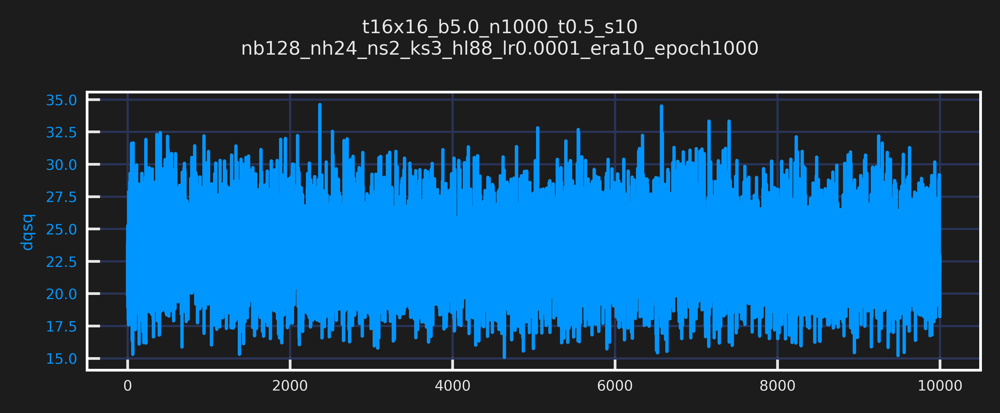

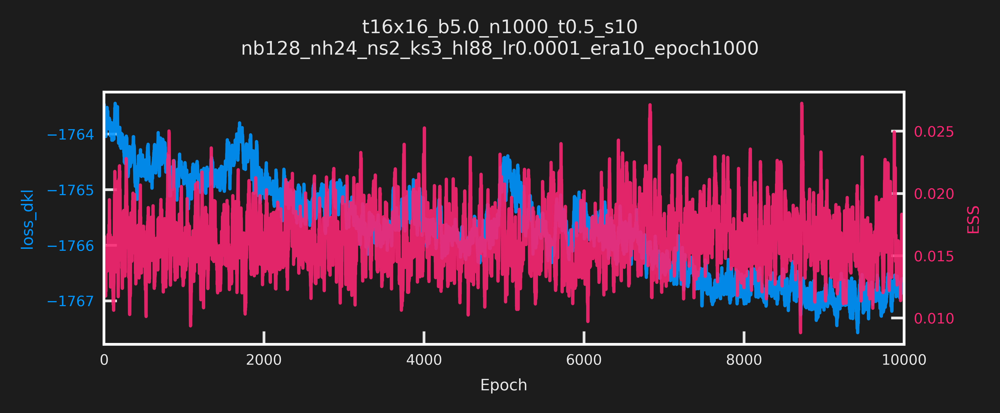

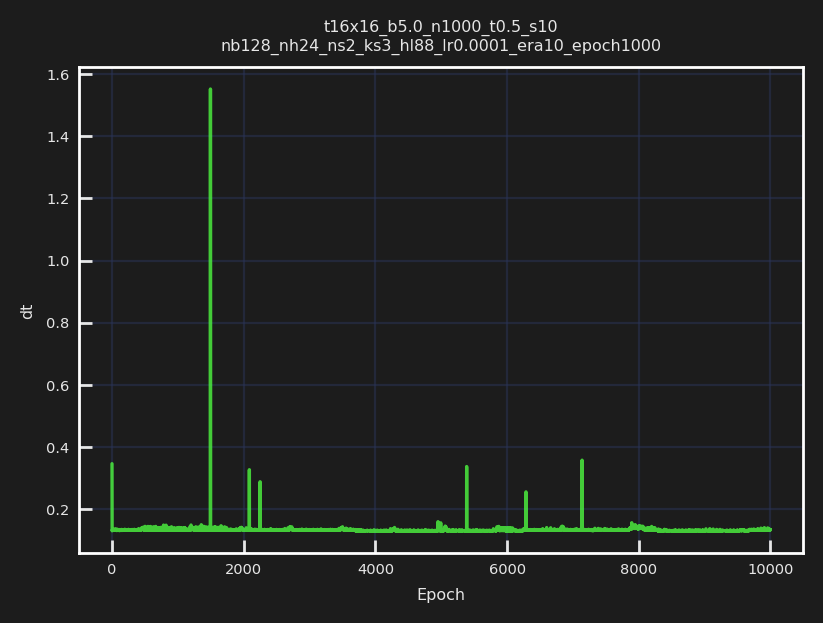

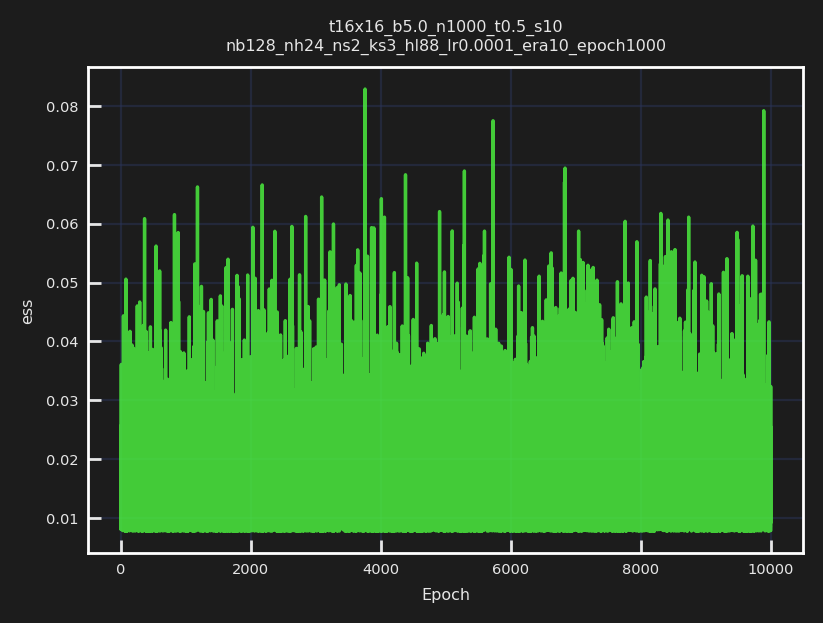

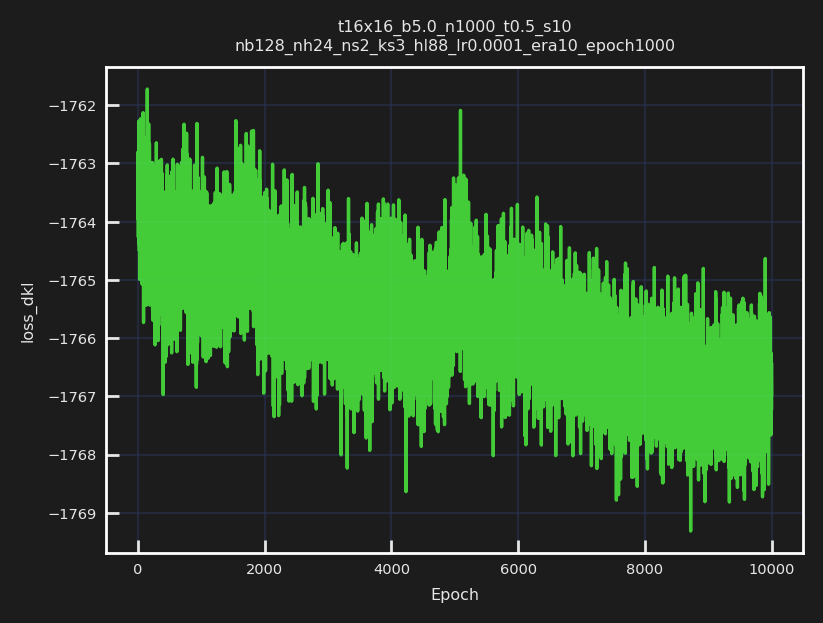

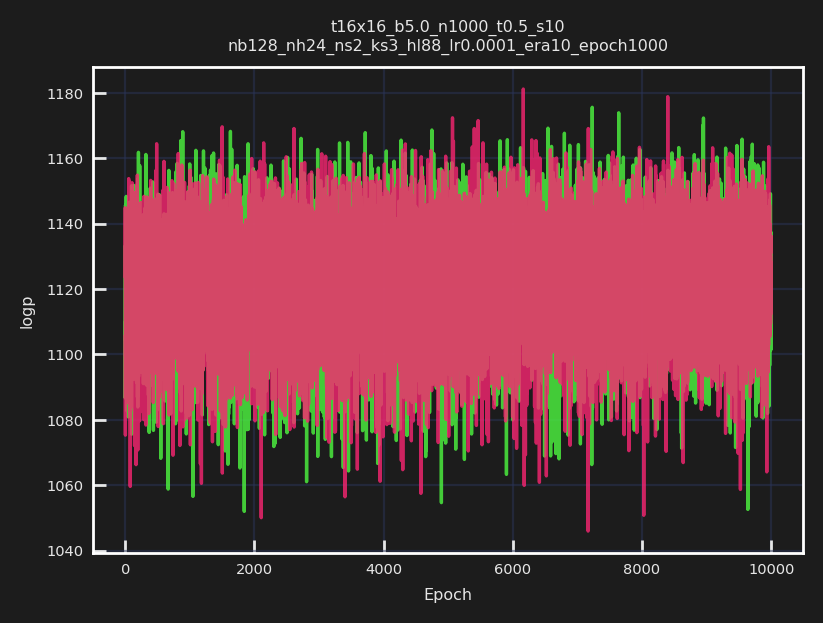

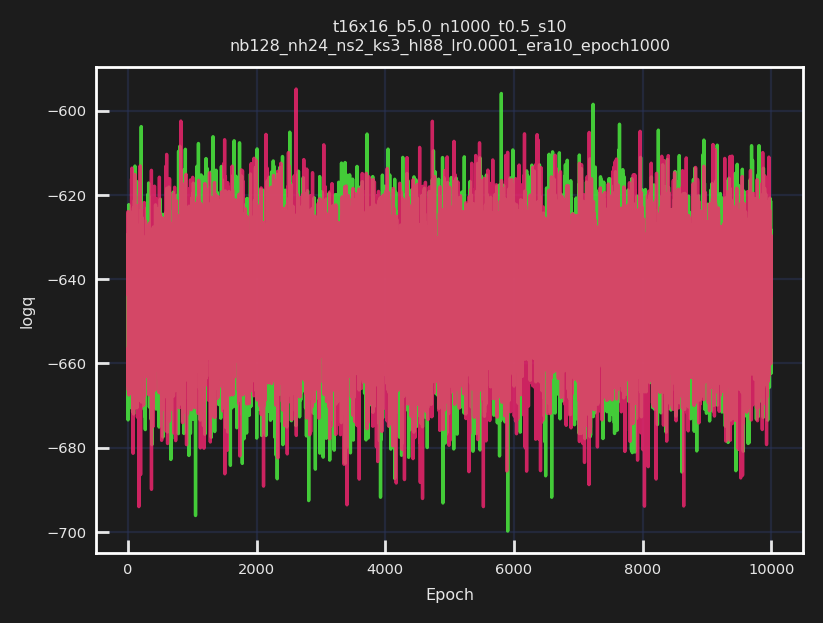

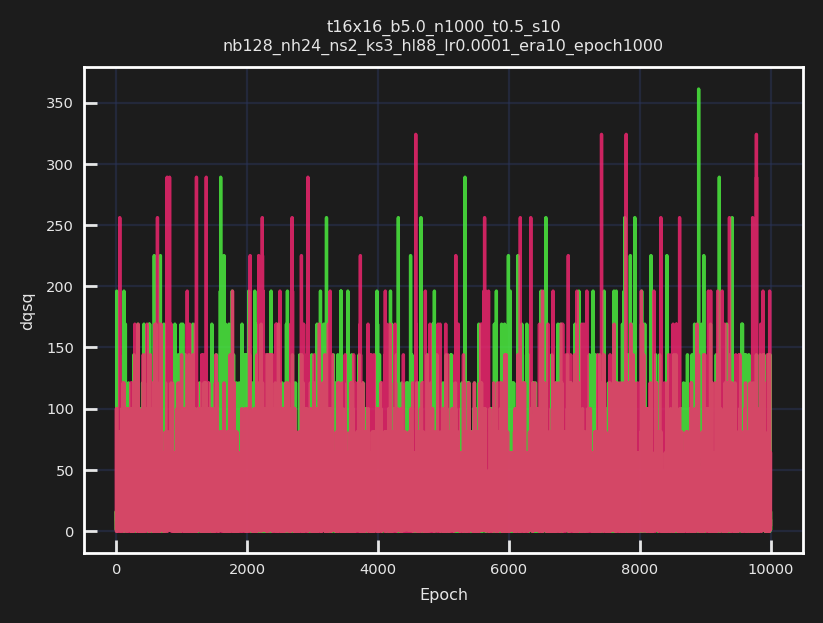

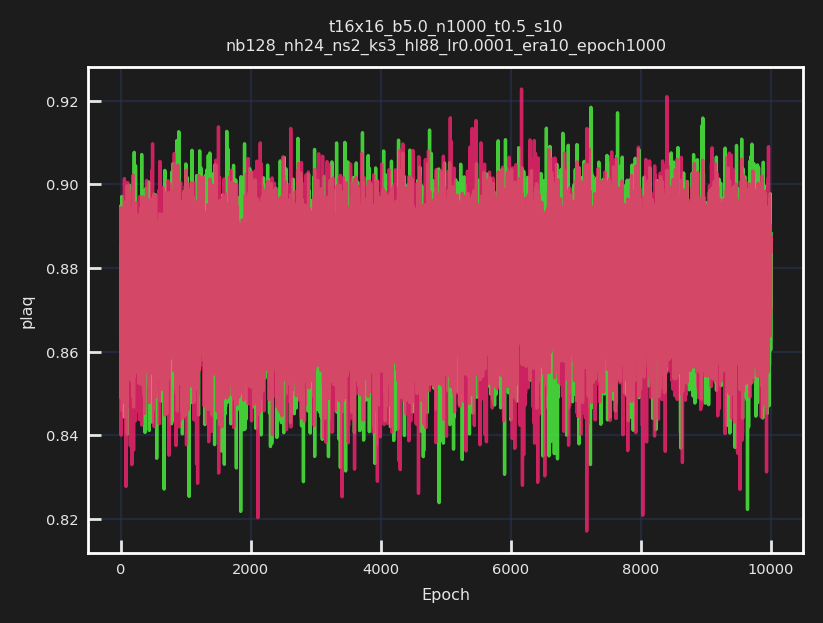

[23:34:47]  Saving train_history to ../../logs/t16x16_b5.0_n1000_t0.5_s10/nb128_nh24_ns2_ks3_
            hl88_lr0.0001_era10_epoch1000/training/train_history.z.

NameError: name 'param16' is not defined

In [22]:
layers = train_outputs['model'].layers #['layers']
layers.train()
train_outputs16 = transfer(L=16, param_init=param,
                          config_init=train_config,
                          layers_init=layers, 
                          new_lr=0.0001, run_hmc=True)

# ----------------------------------------------------------------
# Run inference on transferred model and evaluate / plot metrics
# ----------------------------------------------------------------
import fthmc.utils.qed_helpers as qed
from fthmc.utils.plot_helpers import plot_history
from fthmc.utils.samplers import make_mcmc_ensemble

sns.set_context('paper')
action_fn16 = qed.BatchAction(param16.beta)
dirs16 = train_outputs16['dirs']
logdir16 = dirs16['logdir']

inf_dir16 = os.path.join(logdir16, 'inference')
inf_pdir16 = os.path.join(inf_dir16, 'plots')
history16 = make_mcmc_ensemble(model=train_outputs16['model'],
                               action_fn=action_fn16,
                               batch_size=train_config16.batch_size,
                               num_samples=1000)
plot_history(history=history16,
             param=param16, config=train_config16, skip=['epoch', 'x'],
             num_chains=4, therm_frac=0.0, xlabel='MC Step', outdir=inf_pdir16)

In [23]:
train_outputs16.keys()

dict_keys(['param', 'config', 'model', 'outputs'])

[23:46:18]  Creating directory: ../../logs/t16x16_b5.0_n1000_t0.5_s10/nb128_nh24_ns2_ks3_hl88
            _lr0.0001_era10_epoch1000/inference/plots

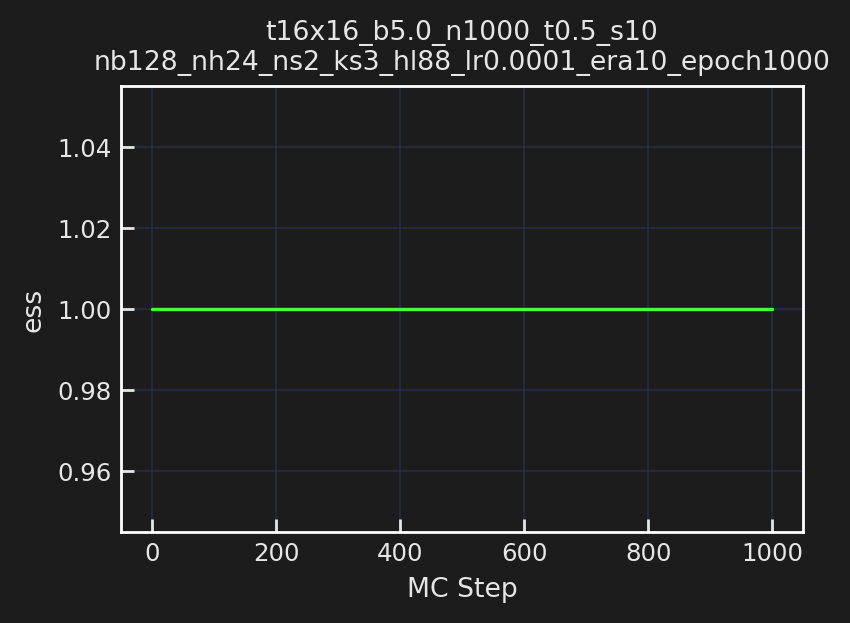

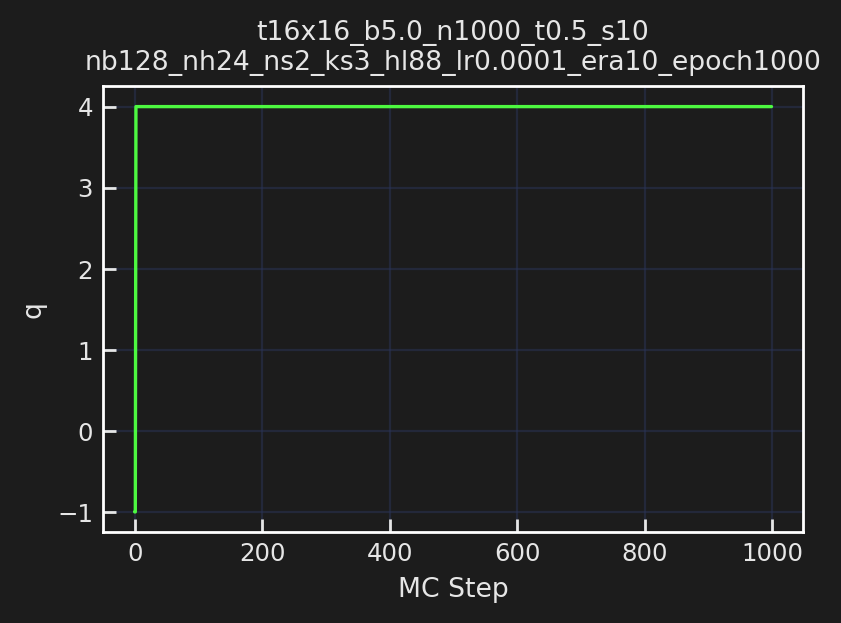

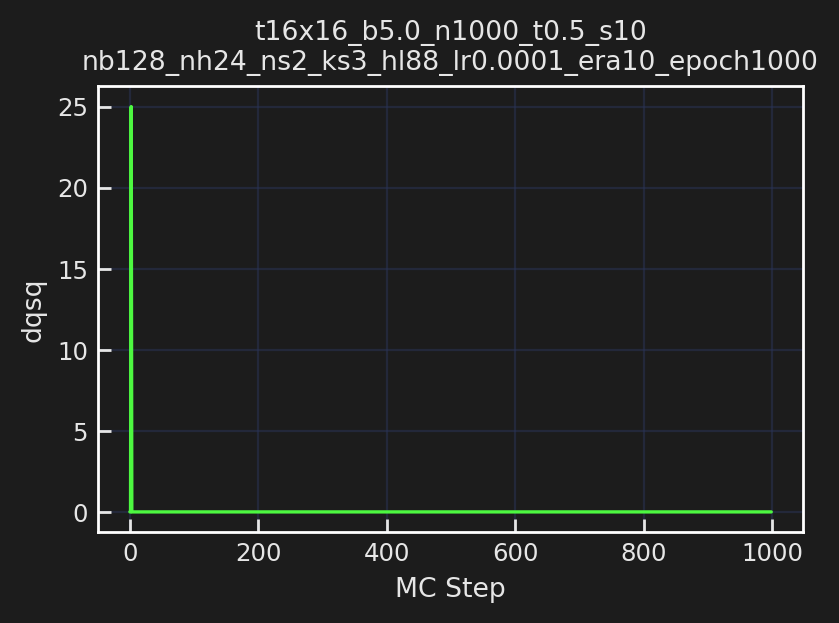

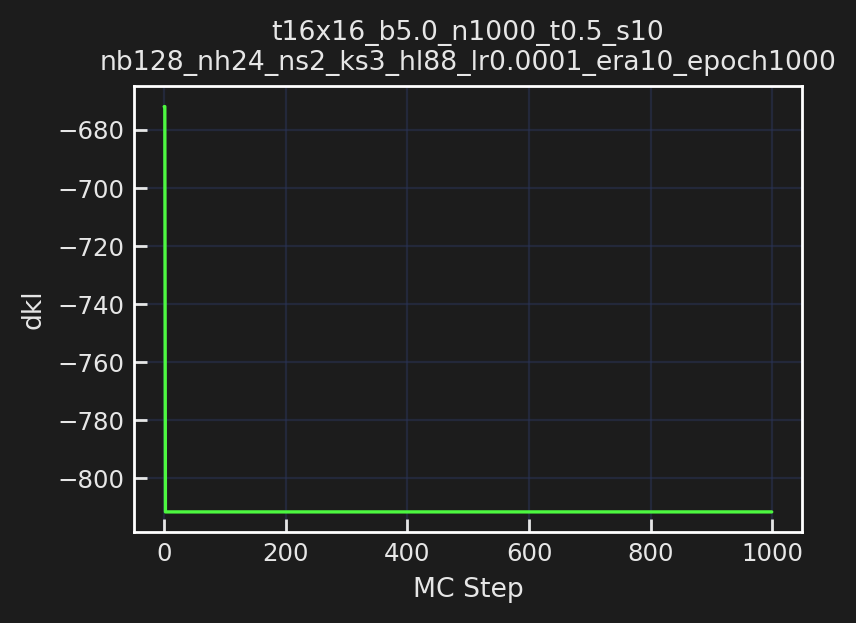

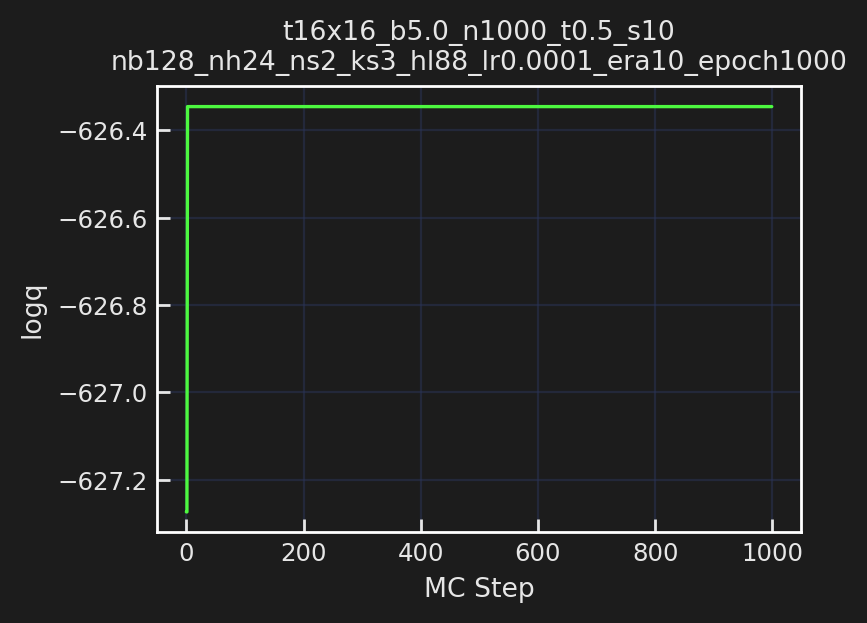

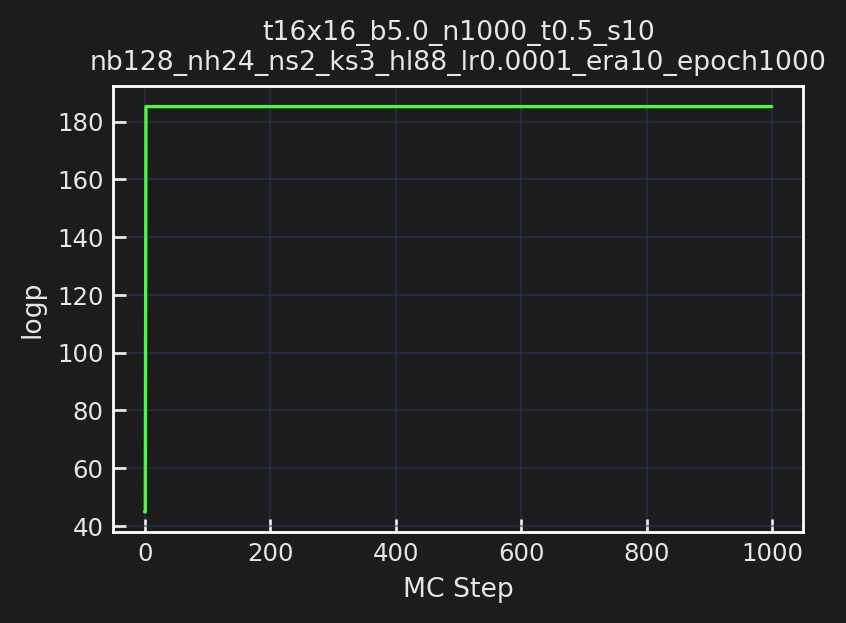

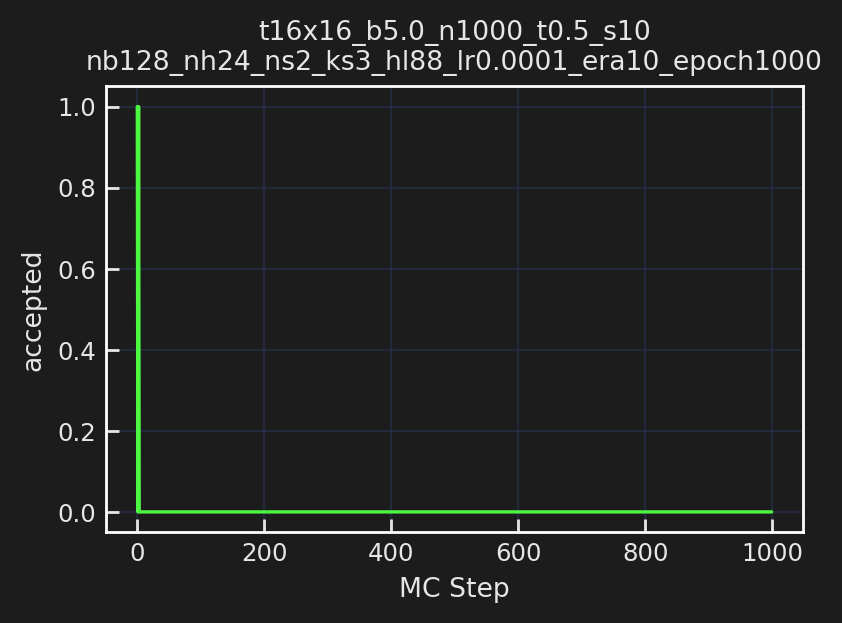

In [24]:
# ----------------------------------------------------------------
# Run inference on transferred model and evaluate / plot metrics
# ----------------------------------------------------------------
import fthmc.utils.qed_helpers as qed
from fthmc.utils.plot_helpers import plot_history
from fthmc.utils.samplers import make_mcmc_ensemble

sns.set_context('paper')

param16 = train_outputs16['param']
train_config16 = train_outputs16['config']
model16 = train_outputs16['model']
outputs16 = train_outputs16['outputs']

action_fn16 = qed.BatchAction(param16.beta)
dirs16 = outputs16['dirs']
logdir16 = dirs16['logdir']

inf_dir16 = os.path.join(logdir16, 'inference')
inf_pdir16 = os.path.join(inf_dir16, 'plots')
history16 = make_mcmc_ensemble(model=model16,
                               action_fn=action_fn16,
                               batch_size=train_config16.batch_size,
                               num_samples=1000)
plot_history(history=history16,
             param=param16, config=train_config16, skip=['epoch', 'x'],
             num_chains=4, therm_frac=0.0, xlabel='MC Step', outdir=inf_pdir16)

ModuleList(
  (0): GaugeEquivCouplingLayer(
    (plaq_coupling): NCPPlaqCouplingLayer(
      (net): Sequential(
        (0): Conv2d(2, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (1): SiLU()
        (2): Conv2d(8, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (3): SiLU()
        (4): Conv2d(8, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
      )
    )
  )
  (1): GaugeEquivCouplingLayer(
    (plaq_coupling): NCPPlaqCouplingLayer(
      (net): Sequential(
        (0): Conv2d(2, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (1): SiLU()
        (2): Conv2d(8, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (3): SiLU()
        (4): Conv2d(8, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
      )
    )
  )
  (2): GaugeEquivCouplingLayer(
    (plaq_coupling): NCPPlaqCouplingLaye

[23:48:15]  Creating directory: ../../logs/hmc/t16x16_b5.0_n1000_t0.5_s10/2021-06-21-234815

[23:48:15]  Creating directory:                                                              
            ../../logs/hmc/t16x16_b5.0_n1000_t0.5_s10/2021-06-21-234815/plots

[23:48:15]  Param:                                                                           
            ----------------                                                                 
            beta=5.0                                                                         
            L=16                                                                             
            tau=0.5                                                                          
            nstep=10                                                                         
            ntraj=1000                                                                       
            nrun=1                                                                           
            nprint=100                                                                       
            seed=1331                                                                        
            randinit=False                                                                   
            nth_interop=2                                                                    
            nth=2                                                                            
            lat=[16, 16]                                                                     
            nd=2                                                                             
            shape=[2, 16, 16]                                                                
            volume=256                                                                       
            dt=0.05

──────────────────────────────── RUN: 0, last took: 0 m 0 s ─────────────────────────────────

            plaq=1.000 q=0.000

            traj=2 dt=0.007 acc=1.000 dH=-0.393 q=0 dqsq=0 plaq=0.925

[23:48:16]  traj=102 dt=0.006 acc=1.000 dH=-0.040 q=0 dqsq=0 plaq=0.886

            traj=202 dt=0.007 acc=1.000 dH=-0.041 q=0 dqsq=0 plaq=0.892

[23:48:17]  traj=302 dt=0.006 acc=1.000 dH=0.108 q=0 dqsq=0 plaq=0.902

[23:48:18]  traj=402 dt=0.006 acc=1.000 dH=0.171 q=0 dqsq=0 plaq=0.896

            traj=502 dt=0.006 acc=1.000 dH=-0.104 q=0 dqsq=0 plaq=0.895

[23:48:19]  traj=602 dt=0.006 acc=1.000 dH=0.057 q=0 dqsq=0 plaq=0.901

            traj=702 dt=0.006 acc=1.000 dH=-0.132 q=0 dqsq=0 plaq=0.897

[23:48:20]  traj=802 dt=0.006 acc=1.000 dH=-0.024 q=0 dqsq=0 plaq=0.896

[23:48:21]  traj=902 dt=0.006 acc=1.000 dH=-0.134 q=0 dqsq=0 plaq=0.892

[23:48:21]  Creating directory:                                                              
            ../../logs/hmc/t16x16_b5.0_n1000_t0.5_s10/2021-06-21-234815/plots/run0

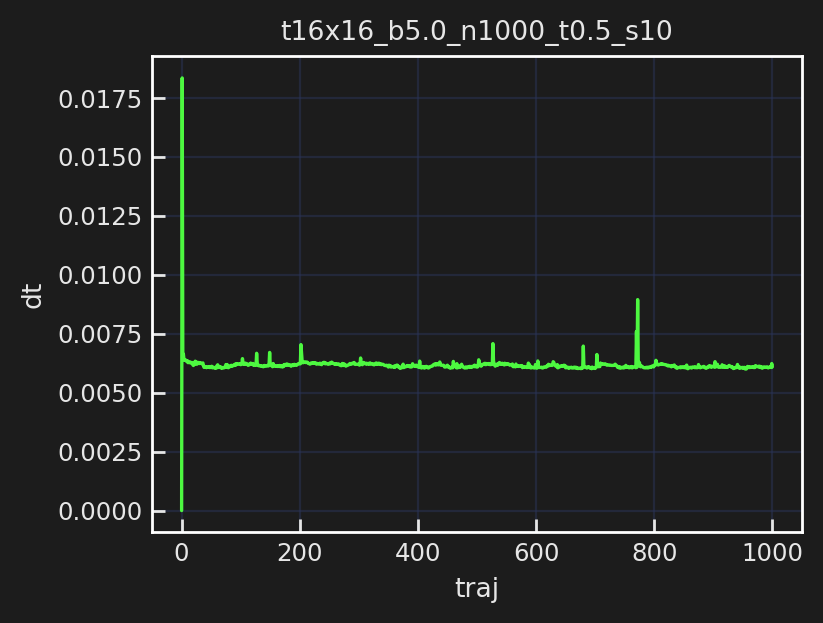

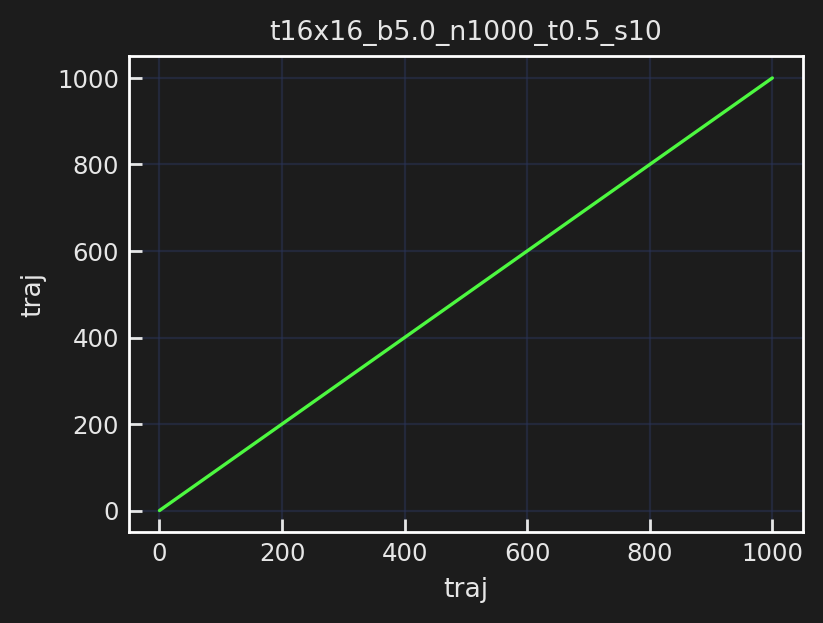

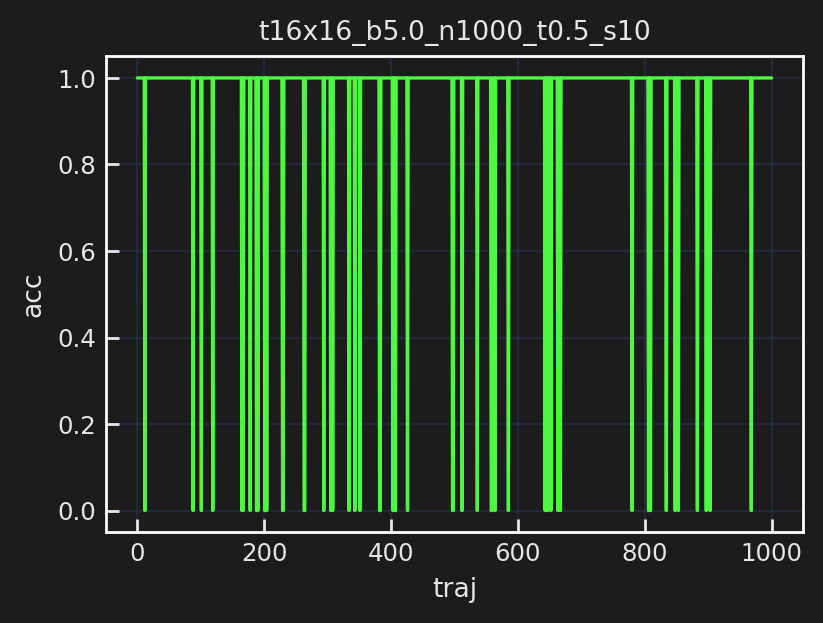

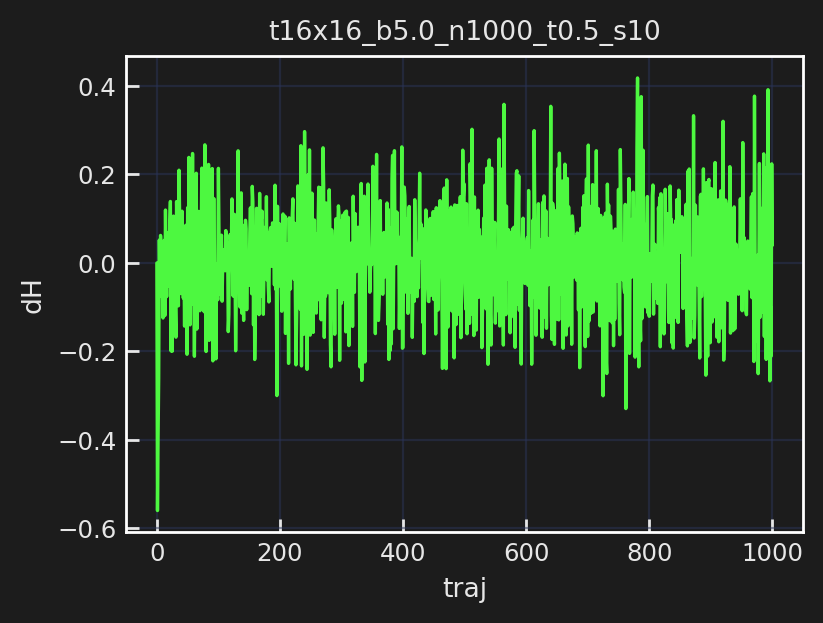

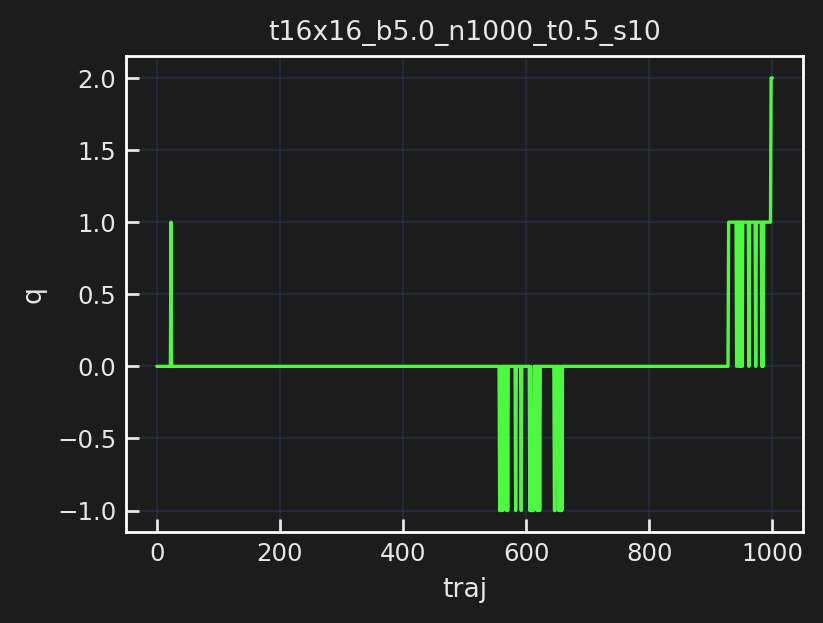

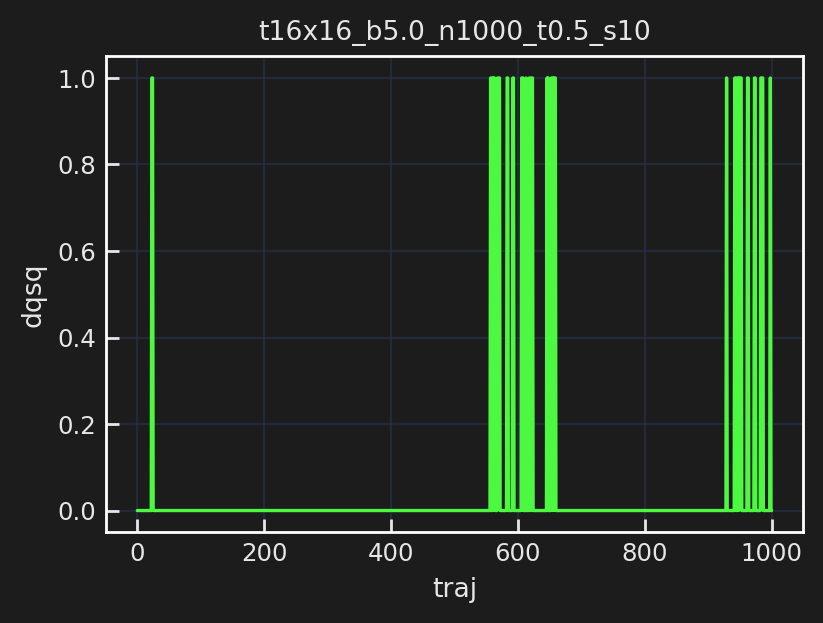

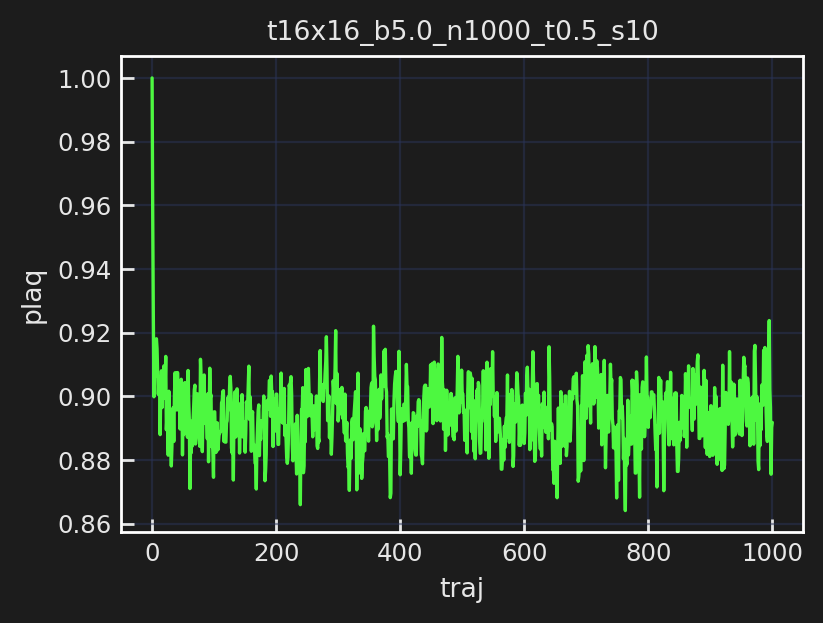

[23:48:23]  Run times: ['6.3122']

            Per trajectory: ['0.0063']

[23:48:23]  Saving hmc_histories to                                                          
            ../../logs/hmc/t16x16_b5.0_n1000_t0.5_s10/2021-06-21-234815/hmc_histories.z.

[23:48:23]  Saving hmc_fields_arr to                                                         
            ../../logs/hmc/t16x16_b5.0_n1000_t0.5_s10/2021-06-21-234815/hmc_fields_arr.z.

[23:48:24]  Creating directory: ../../logs/t16x16_b5.0_n1000_t0.5_s10/nb128_nh24_ns2_ks3_hl88
            _lr0.0001_era10_epoch1000/training/2021-06-21-234824

[23:48:24]  Creating directory: ../../logs/t16x16_b5.0_n1000_t0.5_s10/nb128_nh24_ns2_ks3_hl88
            _lr0.0001_era10_epoch1000/training/2021-06-21-234824/plots

[23:48:24]  Creating directory: ../../logs/t16x16_b5.0_n1000_t0.5_s10/nb128_nh24_ns2_ks3_hl88
            _lr0.0001_era10_epoch1000/training/2021-06-21-234824/checkpoints

[23:48:24]  Scheduler created!

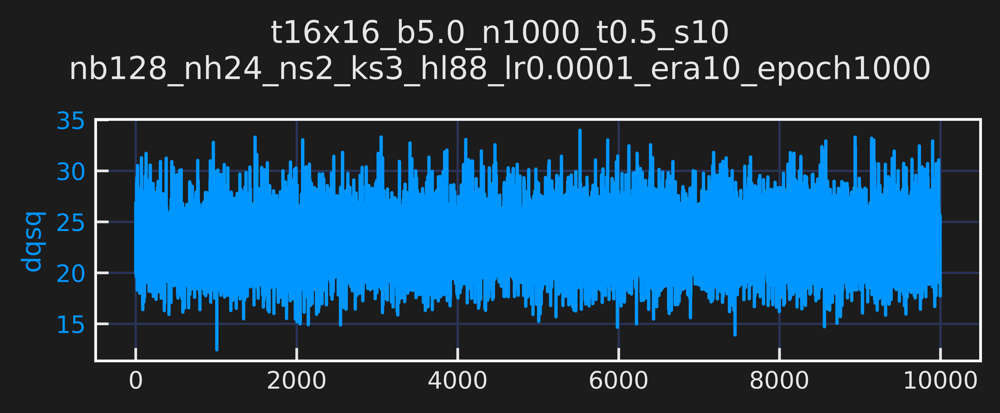

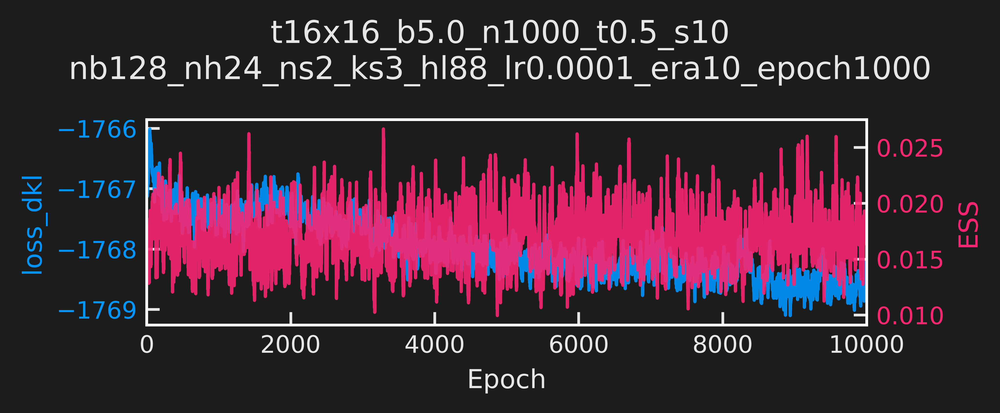

─────────────────────────────── ERA=0, last took: 0 min 0 sec ───────────────────────────────

[23:49:32]  (now) epoch: 499 dt=0.133 ess=0.017 loss_dkl=-1767.209 logp=1122.356             
            logq=-644.852 dqsq=23.922 plaq=0.877

            (avg) epoch: 499 dt=0.133 ess=0.019 loss_dkl=-1767.272 logp=1123.081             
            logq=-644.191 dqsq=23.243 plaq=0.877

[23:50:40]  (now) epoch: 999 dt=0.131 ess=0.018 loss_dkl=-1766.513 logp=1122.524             
            logq=-643.989 dqsq=24.875 plaq=0.877

            (avg) epoch: 999 dt=0.132 ess=0.017 loss_dkl=-1767.516 logp=1122.299             
            logq=-645.216 dqsq=23.631 plaq=0.877

[23:50:41]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t16x16_b5.0_n10
            00_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/2021-06-21-
            234824/checkpoints/ckpt-era0-epoch999.tar

───────────────────────────── ERA=1, last took: 2 min 16.43 sec ─────────────────────────────

[23:51:47]  (now) epoch: 499 dt=0.130 ess=0.008 loss_dkl=-1767.491 logp=1123.376             
            logq=-644.115 dqsq=25.977 plaq=0.878

            (avg) epoch: 499 dt=0.131 ess=0.014 loss_dkl=-1767.404 logp=1122.756             
            logq=-644.648 dqsq=23.712 plaq=0.877

[23:52:54]  (now) epoch: 999 dt=0.130 ess=0.033 loss_dkl=-1767.119 logp=1121.102             
            logq=-646.016 dqsq=20.094 plaq=0.876

            (avg) epoch: 999 dt=0.131 ess=0.015 loss_dkl=-1767.406 logp=1122.641             
            logq=-644.765 dqsq=23.627 plaq=0.877

[23:52:55]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t16x16_b5.0_n10
            00_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/2021-06-21-
            234824/checkpoints/ckpt-era1-epoch999.tar

───────────────────────────── ERA=2, last took: 2 min 14.36 sec ─────────────────────────────

[23:54:02]  (now) epoch: 499 dt=0.131 ess=0.009 loss_dkl=-1767.834 logp=1124.880             
            logq=-642.954 dqsq=19.688 plaq=0.879

            (avg) epoch: 499 dt=0.131 ess=0.018 loss_dkl=-1767.506 logp=1123.178             
            logq=-644.328 dqsq=22.711 plaq=0.877

[23:55:09]  (now) epoch: 999 dt=0.131 ess=0.016 loss_dkl=-1766.806 logp=1123.037             
            logq=-643.769 dqsq=18.906 plaq=0.877

            (avg) epoch: 999 dt=0.131 ess=0.015 loss_dkl=-1767.727 logp=1123.623             
            logq=-644.103 dqsq=23.349 plaq=0.878

[23:55:10]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t16x16_b5.0_n10
            00_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/2021-06-21-
            234824/checkpoints/ckpt-era2-epoch999.tar

───────────────────────────── ERA=3, last took: 2 min 14.76 sec ─────────────────────────────

[23:56:17]  (now) epoch: 499 dt=0.131 ess=0.020 loss_dkl=-1767.955 logp=1123.672             
            logq=-644.283 dqsq=20.500 plaq=0.878

            (avg) epoch: 499 dt=0.131 ess=0.017 loss_dkl=-1767.907 logp=1122.984             
            logq=-644.923 dqsq=24.584 plaq=0.877

[23:57:24]  (now) epoch: 999 dt=0.132 ess=0.025 loss_dkl=-1767.633 logp=1122.848             
            logq=-644.785 dqsq=23.562 plaq=0.877

            (avg) epoch: 999 dt=0.131 ess=0.017 loss_dkl=-1768.048 logp=1123.563             
            logq=-644.485 dqsq=21.777 plaq=0.878

[23:57:26]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t16x16_b5.0_n10
            00_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/2021-06-21-
            234824/checkpoints/ckpt-era3-epoch999.tar

───────────────────────────── ERA=4, last took: 2 min 14.94 sec ─────────────────────────────

[23:58:32]  (now) epoch: 499 dt=0.131 ess=0.018 loss_dkl=-1767.897 logp=1123.093             
            logq=-644.804 dqsq=26.875 plaq=0.877

            (avg) epoch: 499 dt=0.131 ess=0.015 loss_dkl=-1768.028 logp=1123.742             
            logq=-644.285 dqsq=23.866 plaq=0.878

[23:59:40]  (now) epoch: 999 dt=0.131 ess=0.009 loss_dkl=-1767.350 logp=1123.038             
            logq=-644.312 dqsq=24.172 plaq=0.877

            (avg) epoch: 999 dt=0.131 ess=0.017 loss_dkl=-1768.161 logp=1123.720             
            logq=-644.441 dqsq=22.163 plaq=0.878

[23:59:41]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t16x16_b5.0_n10
            00_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/2021-06-21-
            234824/checkpoints/ckpt-era4-epoch999.tar

───────────────────────────── ERA=5, last took: 2 min 15.03 sec ─────────────────────────────

[00:00:48]  (now) epoch: 499 dt=0.131 ess=0.009 loss_dkl=-1767.268 logp=1119.863             
            logq=-647.405 dqsq=18.844 plaq=0.875

            (avg) epoch: 499 dt=0.131 ess=0.013 loss_dkl=-1768.218 logp=1122.711             
            logq=-645.507 dqsq=21.999 plaq=0.877

[00:01:55]  (now) epoch: 999 dt=0.131 ess=0.008 loss_dkl=-1767.557 logp=1122.580             
            logq=-644.977 dqsq=25.758 plaq=0.877

            (avg) epoch: 999 dt=0.131 ess=0.021 loss_dkl=-1768.501 logp=1123.103             
            logq=-645.397 dqsq=23.209 plaq=0.877

[00:01:56]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t16x16_b5.0_n10
            00_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/2021-06-21-
            234824/checkpoints/ckpt-era5-epoch999.tar

───────────────────────────── ERA=6, last took: 2 min 15.14 sec ─────────────────────────────

[00:03:03]  (now) epoch: 499 dt=0.131 ess=0.012 loss_dkl=-1768.795 logp=1123.969             
            logq=-644.827 dqsq=21.352 plaq=0.878

            (avg) epoch: 499 dt=0.131 ess=0.019 loss_dkl=-1768.379 logp=1123.575             
            logq=-644.804 dqsq=22.425 plaq=0.878

[00:04:11]  (now) epoch: 999 dt=0.131 ess=0.014 loss_dkl=-1767.238 logp=1122.798             
            logq=-644.440 dqsq=22.219 plaq=0.877

            (avg) epoch: 999 dt=0.131 ess=0.021 loss_dkl=-1768.124 logp=1123.878             
            logq=-644.246 dqsq=22.852 plaq=0.878

[00:04:12]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t16x16_b5.0_n10
            00_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/2021-06-21-
            234824/checkpoints/ckpt-era6-epoch999.tar

───────────────────────────── ERA=7, last took: 2 min 15.33 sec ─────────────────────────────

[00:05:19]  (now) epoch: 499 dt=0.131 ess=0.009 loss_dkl=-1768.557 logp=1124.226             
            logq=-644.331 dqsq=24.734 plaq=0.878

            (avg) epoch: 499 dt=0.131 ess=0.016 loss_dkl=-1768.353 logp=1124.027             
            logq=-644.326 dqsq=23.347 plaq=0.878

[00:06:27]  (now) epoch: 999 dt=0.132 ess=0.025 loss_dkl=-1768.178 logp=1122.737             
            logq=-645.442 dqsq=25.766 plaq=0.877

            (avg) epoch: 999 dt=0.131 ess=0.017 loss_dkl=-1768.525 logp=1123.751             
            logq=-644.773 dqsq=22.706 plaq=0.878

[00:06:28]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t16x16_b5.0_n10
            00_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/2021-06-21-
            234824/checkpoints/ckpt-era7-epoch999.tar

───────────────────────────── ERA=8, last took: 2 min 15.47 sec ─────────────────────────────

[00:07:35]  (now) epoch: 499 dt=0.131 ess=0.008 loss_dkl=-1768.420 logp=1123.670             
            logq=-644.750 dqsq=28.922 plaq=0.878

            (avg) epoch: 499 dt=0.131 ess=0.018 loss_dkl=-1768.604 logp=1123.784             
            logq=-644.820 dqsq=23.292 plaq=0.878

[00:08:44]  (now) epoch: 999 dt=0.134 ess=0.009 loss_dkl=-1768.372 logp=1123.214             
            logq=-645.158 dqsq=24.648 plaq=0.878

            (avg) epoch: 999 dt=0.134 ess=0.015 loss_dkl=-1768.479 logp=1124.342             
            logq=-644.137 dqsq=23.829 plaq=0.878

[00:08:45]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t16x16_b5.0_n10
            00_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/2021-06-21-
            234824/checkpoints/ckpt-era8-epoch999.tar

───────────────────────────── ERA=9, last took: 2 min 16.35 sec ─────────────────────────────

[00:09:54]  (now) epoch: 499 dt=0.134 ess=0.011 loss_dkl=-1769.213 logp=1125.611             
            logq=-643.602 dqsq=19.359 plaq=0.879

            (avg) epoch: 499 dt=0.134 ess=0.017 loss_dkl=-1768.620 logp=1124.093             
            logq=-644.527 dqsq=22.130 plaq=0.878

[00:11:04]  (now) epoch: 999 dt=0.134 ess=0.025 loss_dkl=-1769.145 logp=1125.661             
            logq=-643.484 dqsq=18.383 plaq=0.879

            (avg) epoch: 999 dt=0.134 ess=0.019 loss_dkl=-1768.421 logp=1123.502             
            logq=-644.919 dqsq=22.542 plaq=0.878

[00:11:05]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t16x16_b5.0_n10
            00_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/2021-06-21-
            234824/checkpoints/ckpt-era9-epoch999.tar

[00:11:06]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t16x16_b5.0_n10
            00_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/2021-06-21-
            234824/checkpoints/ckpt-era10-epoch1001.tar

[00:11:07]  Saving live plots to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t16x16_b5.0_n10
            00_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/2021-06-21-
            234824/plots

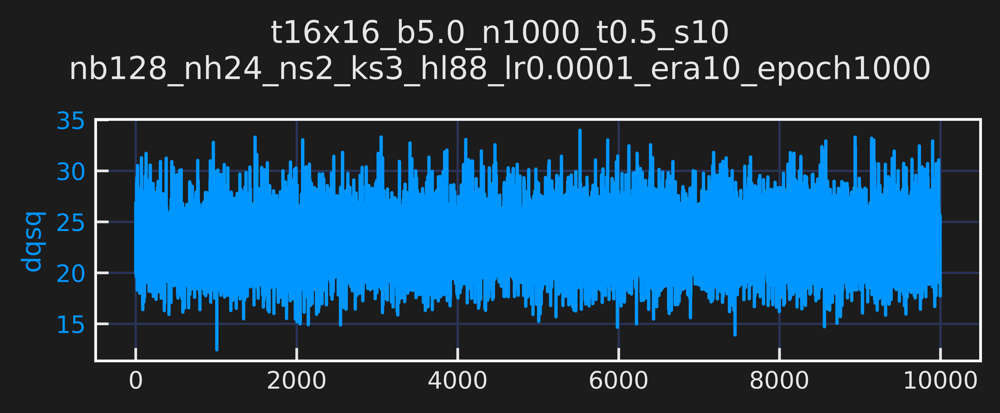

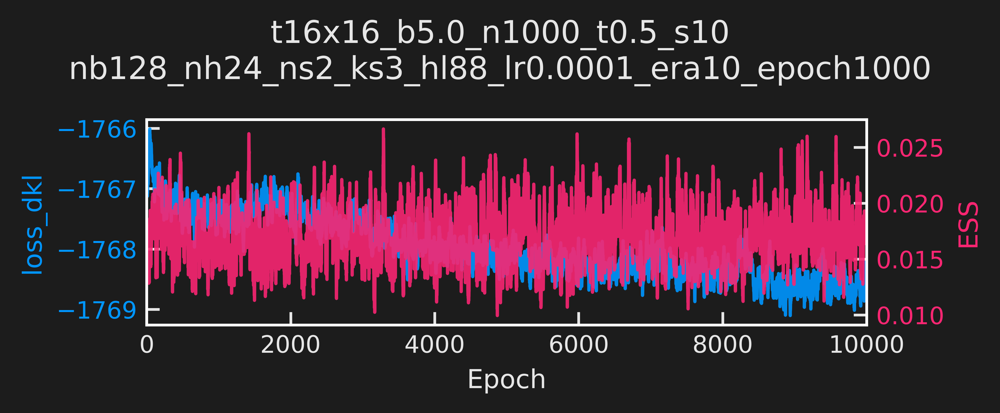

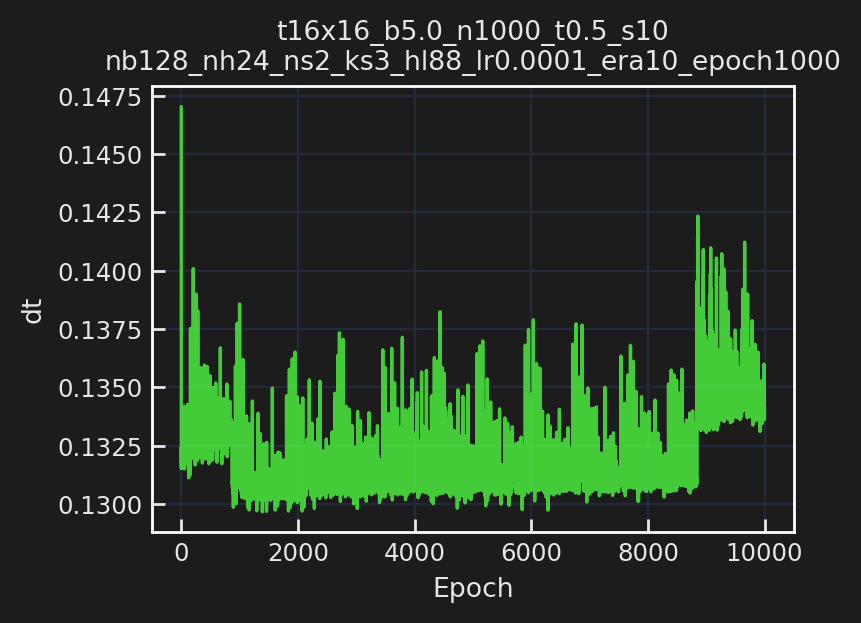

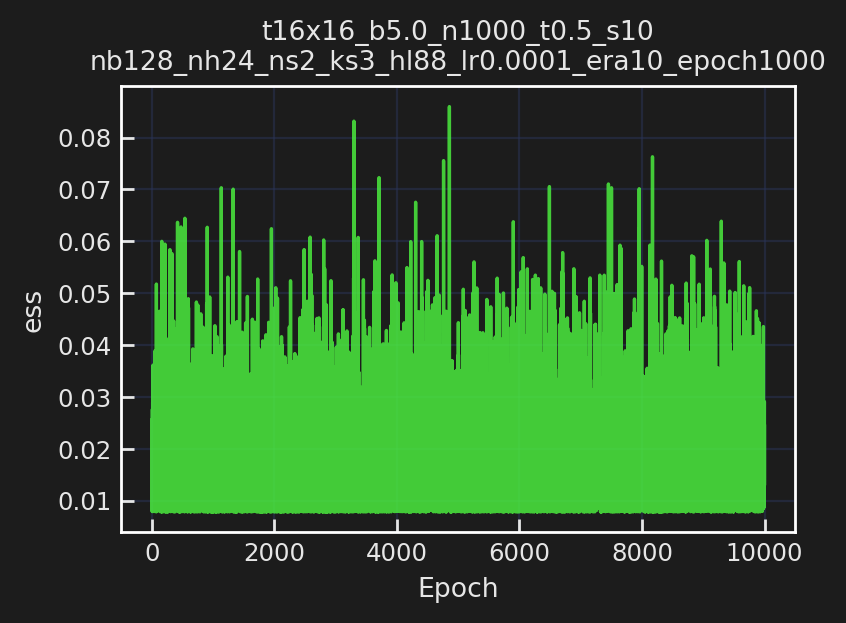

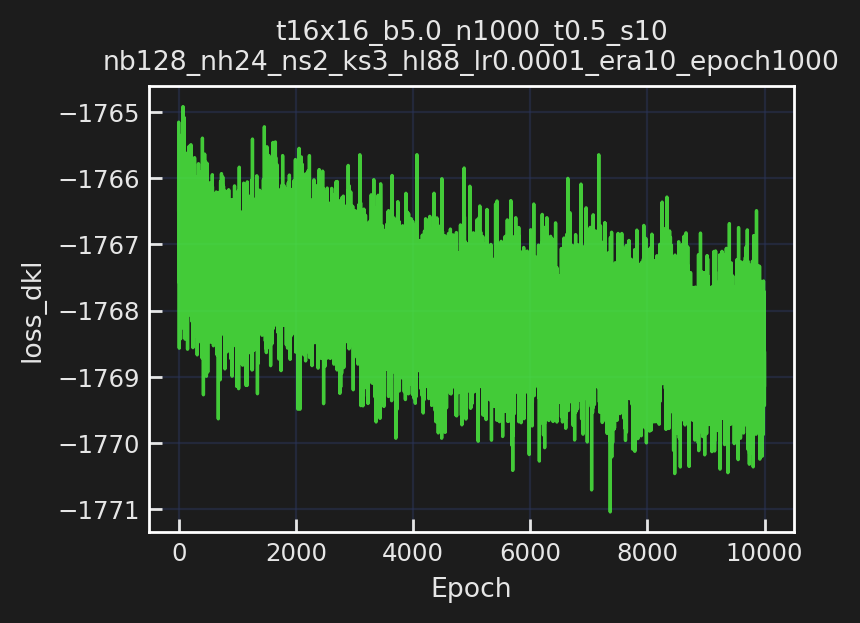

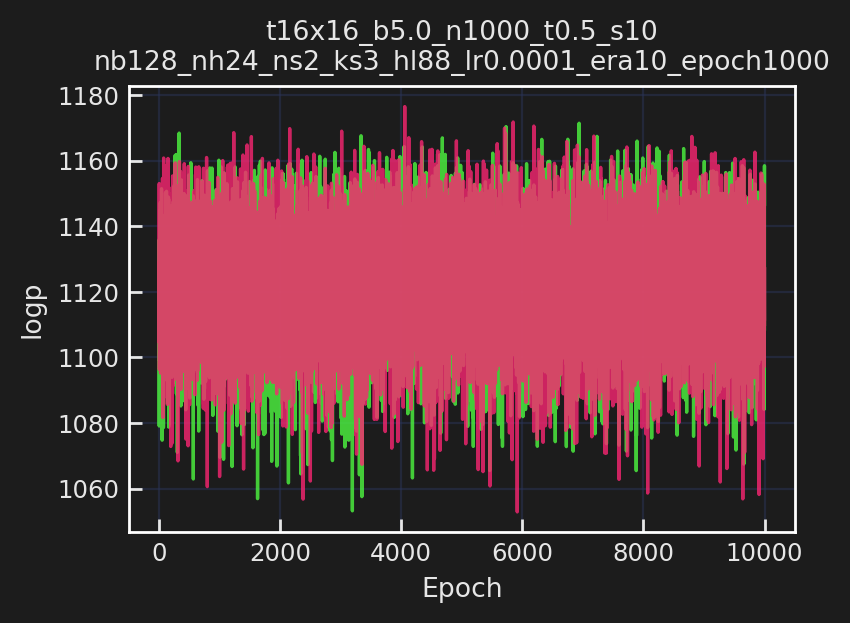

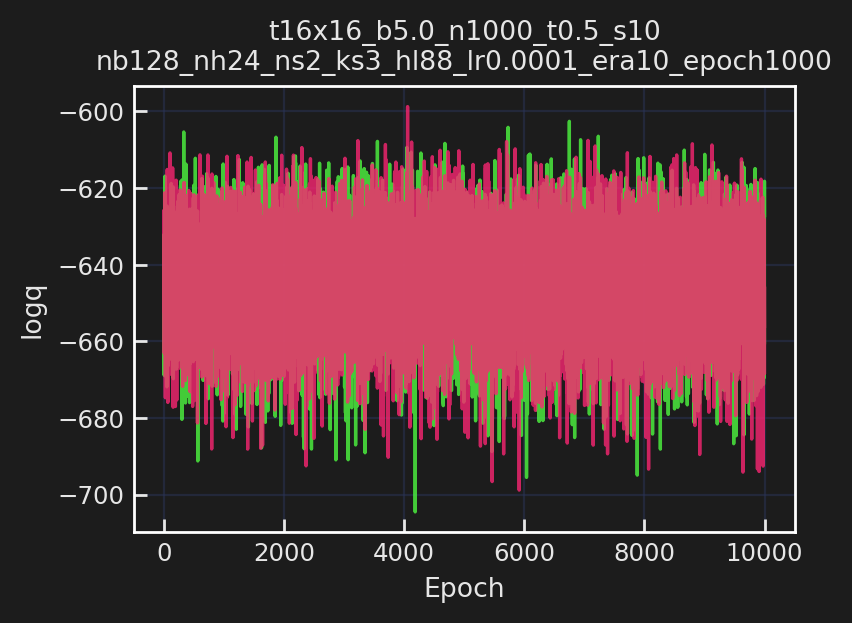

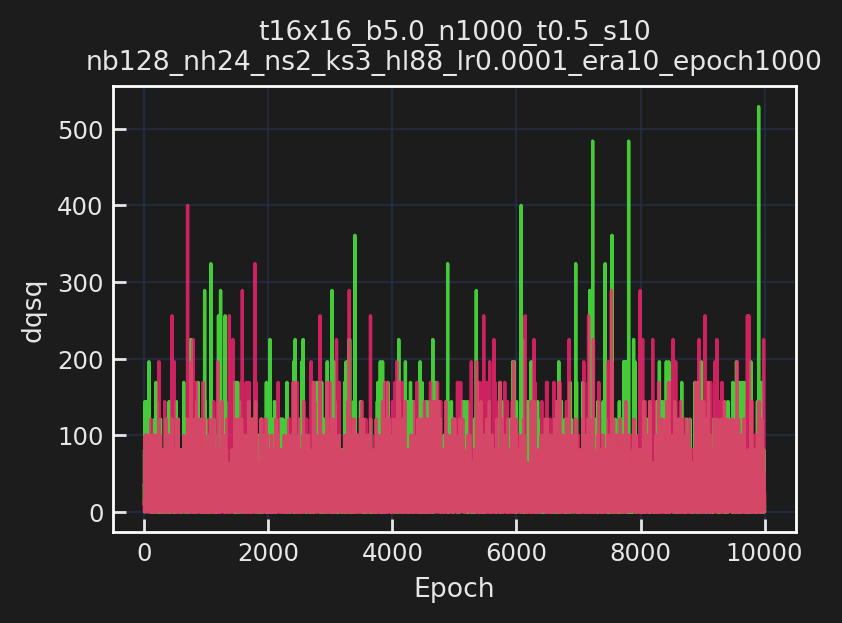

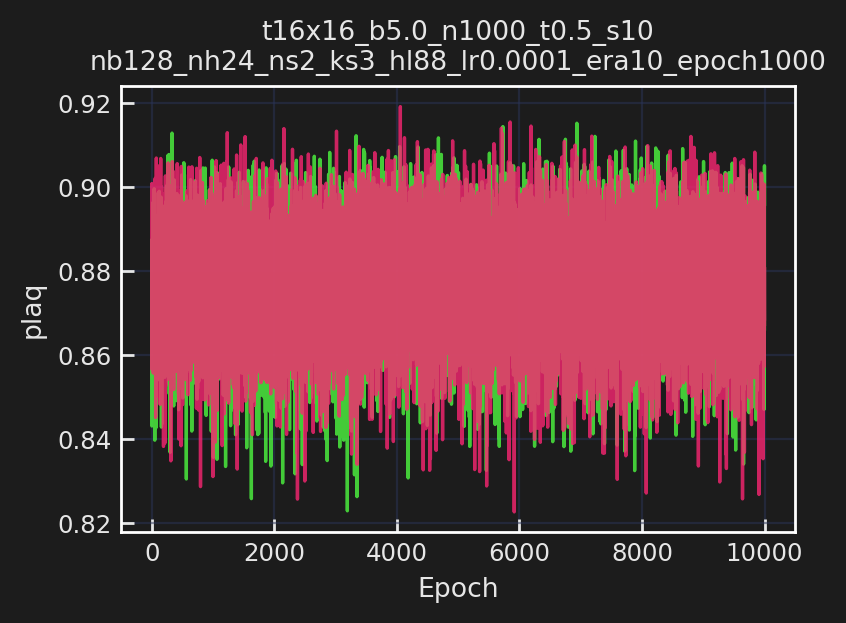

[00:11:11]  Saving train_history to ../../logs/t16x16_b5.0_n1000_t0.5_s10/nb128_nh24_ns2_ks3_
            hl88_lr0.0001_era10_epoch1000/training/2021-06-21-234824/train_history.z.

KeyError: 'dirs'

In [26]:
layers = train_outputs8['model'].layers #['layers']
layers.train()
train_outputs16 = transfer(L=16, param_init=param8,
                          config_init=train_config8,
                          layers_init=layers, 
                          new_lr=0.0001, run_hmc=True)

# ----------------------------------------------------------------
# Run inference on transferred model and evaluate / plot metrics
# ----------------------------------------------------------------
import fthmc.utils.qed_helpers as qed
from fthmc.utils.plot_helpers import plot_history
from fthmc.utils.samplers import make_mcmc_ensemble

sns.set_context('paper')
action_fn16 = qed.BatchAction(param8.beta)
dirs16 = train_outputs16['dirs']
logdir16 = dirs16['logdir']

inf_dir16 = os.path.join(logdir16, 'inference')
inf_pdir16 = os.path.join(inf_dir16, 'plots')
history16 = make_mcmc_ensemble(model=train_outputs16['model'],
                               action_fn=action_fn16,
                               batch_size=train_config16.batch_size,
                               num_samples=1000)
plot_history(history=history16,
             param=16, config=train_config16, skip=['epoch', 'x'],
             num_chains=4, therm_frac=0.0, xlabel='MC Step', outdir=inf_pdir16)

In [ ]:
model16.layers

In [27]:
param16

Param:
----------------
beta=5.0
L=16
tau=0.5
nstep=10
ntraj=1000
nrun=1
nprint=100
seed=1331
randinit=False
nth_interop=2
nth=2
lat=[16, 16]
nd=2
shape=[2, 16, 16]
volume=256
dt=0.05

In [ ]:
from fthmc.ft_hmc import ft_run
fields, metrics = ft_run(param16, model16.layers)

In [29]:
%debug

> /lus/grand/projects/DLHMC/conda/pytorch/2021-05-12/lib/python3.8/site-packages/numpy/core/arrayprint.py(703)_extendLine()
    701 
    702     if needs_wrap:
--> 703         s += line.rstrip() + "\n"
    704         line = next_line_prefix
    705     line += word

ipdb> up
> /lus/grand/projects/DLHMC/conda/pytorch/2021-05-12/lib/python3.8/site-packages/numpy/core/arrayprint.py(715)_extendLine_pretty()
    713     words = word.splitlines()
    714     if len(words) == 1 or legacy == '1.13':
--> 715         return _extendLine(s, line, word, line_width, next_line_prefix, legacy)
    716 
    717     max_word_length = max(len(word) for word in words)

ipdb> up
> /lus/grand/projects/DLHMC/conda/pytorch/2021-05-12/lib/python3.8/site-packages/numpy/core/arrayprint.py(802)recurser()
    800             for i in range(trailing_items, 1, -1):
    801                 word = recurser(index + (-i,), next_hanging_indent, next_width)
--> 802                 s, line = _extendLine_pretty(
    803   

# OLD

In [3]:
%matplotlib inline

In [ ]:
import matplotlib as mpl

from fthmc.train import train
from fthmc.utils.param import Param
from fthmc.config import TrainConfig, PI
from fthmc.utils.distributions import MultivariateUniform
from fthmc.utils.layers import make_u1_equiv_layers, set_weights
from fthmc.utils.plot_helpers import save_live_plots

import fthmc.utils.qed_helpers as qed

import datetime

from fthmc.config import LOGS_DIR

mpl.rcParams['text.usetex'] = False
plt.style.use('/Users/saforem2/.matplotlib/stylelib/molokai.mplstyle')

param = {
    'L': 4,
    'tau': 0.5,
    'nrun': 2,
    'beta': 4.,
    'nstep': 5,
    'ntraj': 1000,
    'nprint': 100,
    'seed': 1331,
}

train_config = TrainConfig(**{
    'n_era': 10,
    'n_epoch': 50,
    'n_layers': 24,
    'n_s_nets': 2,
    'hidden_sizes': [8, 8],
    'kernel_size': 3,
    'batch_size': 64,
    'print_freq': 20,
    'plot_freq': 20,
})

param = Param(**param)
logger.log(repr(param))
logger.log(repr(train_config))

#logdir = io.make_experiment_dirs(param, train_config)

## Specify directories for saving model, etc

In [ ]:
from fthmc.hmc import run_hmc

#hmc_mdir = io.tstamp_dir(os.path.join(logdir, 'hmc'))
#hmc_mdir = io.tstamp_dir(os.path.join(dirs, 'hmc'))

hmc_fields, hmc_history = run_hmc(param,
                                  keep_fields=True,
                                  save_history=True)

## Define `TrainConfig` and build model as
```python
model = {
    'prior': MultivariateUniform(...),
    'model': make_u1_equiv_layers(...),
}
```

### Train `model_init`:

In [ ]:
train_config.n_epoch = 100

In [ ]:
from fthmc.train import train

%matplotlib inline
plt.style.use('default')
plt.style.use('/Users/saforem2/.matplotlib/stylelib/molokai.mplstyle')
sns.set_context('paper', font_scale=0.6)

train_outputs = train(param,
                      train_config,
                      pre_model=None,
                      figsize=(5, 2))

pre_flow_plots = train_outputs['plots']
pre_flow_history = train_outputs['history']
flow_act = train_outputs['action']
pre_flow_model = train_outputs['model']
pre_flow_optimizer = train_outputs['optimizer']

## Run inference on trained model and plot history

In [ ]:
import fthmc.utils.qed_helpers as qed
from fthmc.utils.plot_helpers import plot_history
from fthmc.utils.samplers import make_mcmc_ensemble

action_fn = qed.BatchAction(param.beta)
dirs = train_outputs['dirs']
logdir = dirs['logdir']

inf_dir = os.path.join(logdir, 'inference')
inf_pdir = os.path.join(inf_dir, 'plots')
history = make_mcmc_ensemble(model=train_outputs['model'], action_fn=action_fn,
                             batch_size=train_config.batch_size, num_samples=1000)
plot_history(history=history,
             param=param, config=train_config, skip=['epoch', 'x'],
             num_chains=4, therm_frac=0.0, xlabel='MC Step', outdir=inf_pdir)

### Transfer to new lattice

In [ ]:
from dataclasses import asdict
from fthmc.train import train, transfer_to_new_lattice
%matplotlib inline

plt.style.use('default')
plt.style.use('/Users/saforem2/.matplotlib/stylelib/molokai.mplstyle')
sns.set_context('paper', font_scale=0.6)

layers = train_outputs['model']['layers']


xfr = transfer_to_new_lattice(L=6,
                              layers=layers,
                              param_init=param)
param6 = xfr['param']
model6 = xfr['model']

cfg_dict = asdict(train_config)
cfg_dict['base_lr'] = 0.0005
train_config6 = TrainConfig(**cfg_dict)

train_outputs6 = train(param6,
                       train_config6,
                       model=model6,
                       pre_model=None,
                       figsize=(5, 2))

#pre_flow_plots = train_outputs['plots']
#pre_flow_history = train_outputs['history']
#flow_act = train_outputs['action']
#pre_flow_model = train_outputs['model']
#pre_flow_optimizer = train_outputs['optimizer']

In [ ]:
txfrtxfr

In [ ]:
from fthmc.utils.samplers import make_mcmc_ensemble
import fthmc.utils.qed_helpers as qed

tstamp = io.get_timestamp('%Y-%m-%d-%H%M%S')

history = make_mcmc_ensemble(model=train_outputs['model'],
                             action_fn=train_outputs['action'],
                             batch_size=train_config.batch_size,
                             num_samples=1000)

pdir = os.path.join(PLOTS_DIR, 'inference', 'pre_flow_model', TSTAMP)
if os.path.isdir(pdir):
    pdir = os.path.join(PLOTS_DIR, 'inference', 'pre_flow_model', tstamp)
    
mdir = os.path.join(PLOTS_DIR,' inference', 'pre_flow_model', TSTAMP)
if os.path.isdir(mdir):
    mdir = os.path.join(METRICS_DIR, 'inference', 'pre_flow_model', TSTAMP)
    
io.check_else_make_dir(pdir)
io.check_else_make_dir(mdir)

plot_history(history=history,
             param=param, skip=['epoch', 'x'],
             num_chains=2, therm_frac=0.0,#, thin=10,
             xlabel='MC Step', outdir=pdir, alpha=0.5)

mfile = os.path.join(mdir, 'inference_metrics.z')

io.save_history(history, mfile, name='inference_metrics')

logger.log(f'Accept rate: {np.mean(history["accepted"])}')

In [ ]:
from fthmc.config import grab

#for key, val in history.items():
#    #x = grab(val)
#    if key == 'x':
#        continue
#        
#    logger.log(f'({key}) shape: {val.shape}, mean: {np.mean(val)}')
np.mean(history['accepted'])
#np.mean(history['accepted'])

In [ ]:
from fthmc.utils.samplers import generate_ensemble

outputs = generate_ensemble(pre_flow_model, flow_act, logger=logger)

history = outputs['history']
#u1_ens = outputs['ensemble']

pre_flow = pre_flow_model['layers']

In [ ]:
import matplotlib.pyplot as plt

from fthmc.utils.plot_helpers import plot_history

tstamp = io.get_timestamp('%Y-%m-%d-%H%M%S')

pdir = os.path.join(PLOTS_DIR, 'training', 'pre_flow_model', TSTAMP)
if os.path.isdir(pdir):
    pdir = os.path.join(PLOTS_DIR, 'training', 'pre_flow_model', tstamp)
    
mdir = os.path.join(METRICS_DIR, 'training', 'pre_flow_model', TSTAMP)
if os.path.isdir(mdir):
    mdir = os.path.join(METRICS_DIR, 'training', 'pre_flow_model', tstamp)
    
io.check_else_make_dir(pdir)
io.check_else_make_dir(mdir)

plot_history(history=train_outputs['history'],
             param=param, skip=['epoch'],
             num_chains=2, therm_frac=0.0, thin=10,
             xlabel='Epoch', outdir=outdir, alpha=0.5)

mfile = os.path.join(mdir, 'train_metrics.z')
io.save_history(train_outputs['history'], mfile, name='train_metrics')

In [ ]:
train_force = False
flow_model = None

if train_force:
    flow_model, flow_act = flow_train(param, with_force=True, pre_model=pre_flow_model)
else:
    flow_model = pre_flow_model
    
u1_ens = generate_ensemble(flow_model, flow_act, logger=logger)
flow = flow_model['layers']
flow.eval()

# Try increasing $\beta$ on `4x4` lattice

In [ ]:
from dataclasses import asdict

pdict = asdict(param)
logger.log(pdict)

In [ ]:
type(pre_flow_model['layers'])

In [ ]:
from math import pi as PI
from fthmc.utils.distributions import MultivariateUniform
from fthmc.utils.layers import make_net_from_layers, get_nets
from fthmc.utils.samplers import make_mcmc_ensemble
import fthmc.utils.qed_helpers as qed
from fthmc.utils.plot_helpers import plot_history

param4 = Param(**{
    'L': 4,
    'tau': 1.,
    'nrun': 5,
    'beta': 4.5,
    'nstep': 10,
    'ntraj': 256,
    'nprint': 100,
    'seed': 1331,
})

logger.log(repr(param4))

flow4 = make_net_from_layers(lattice_shape=tuple(param.lat),
                              nets=get_nets(pre_flow_model['layers']))


train_config4 = TrainConfig(**{
    'n_era': 10,
    'n_epoch': 100,
    'n_layers': 24,
    'n_s_nets': 2,
    'hidden_sizes': [8, 8],
    'kernel_size': 3,
    'batch_size': 256,
    'print_freq': 100,
    'plot_freq': 100,
})

prior4 = MultivariateUniform(torch.zeros((2, *param4.lat)),
                              2. * PI * torch.ones(tuple(param4.lat)))

model4 = {'layers': flow4, 'prior': prior4}

DAYSTR4 = io.get_timestamp('%Y-%m-%d')
NOW4 = io.get_timestamp('%Y-%m-%d-%H%M%S')
TSTAMP4 = io.get_timestamp('%Y-%m-%d-%H%M')

PARAM_DIR4 = os.path.join(LOGS_DIR,
                           param4.uniquestr())
METRICS_DIR4 = os.path.join(PARAM_DIR4, 'metrics')
MODEL_DIR4 = os.path.join(PARAM_DIR4, 'models')
PLOTS_DIR4 = os.path.join(PARAM_DIR4, 'plots')
#OUTDIR = os.path.join(METRICS_DIR)

io.check_else_make_dir(PARAM_DIR4)
io.check_else_make_dir(MODEL_DIR4)
io.check_else_make_dir(METRICS_DIR4)
io.check_else_make_dir(PLOTS_DIR4)

train_outputs4 = train(param4,
                        train_config4,
                        model=model4,
                        pre_model=None,
                        logger=logger,
                        figsize=(7.5, 2))

pre_flow_plots4 = train_outputs4['plots']
pre_flow_history4 = train_outputs4['history']
flow_act4 = train_outputs4['action']

pre_flow_model4 = train_outputs4['model']
pre_flow_optimizer4 = train_outputs4['optimizer_kdl']

# Save model, optimizer, and history to checkpoint
step4 = train_config4.n_era * train_config4.n_epoch

outfile4 = os.path.join(MODEL_DIR4, 'pre_flow_model', TSTAMP4, 'pre_flow_model.tar')
io.save_checkpoint(
    epoch=step4,
    outfile=outfile4,
    model=pre_flow_model4['layers'],
    optimizer=pre_flow_optimizer4,
    history=train_outputs4['history'],
    overwrite=True,
)

plots4 = train_outputs4['plots']
outdir4 = os.path.join(PLOTS_DIR4, 'training', 'pre_flow_model', TSTAMP4)

save_live_plots(plots4, outdir4)


tstamp4 = io.get_timestamp('%Y-%m-%d-%H%M%S')

pdir4 = os.path.join(PLOTS_DIR4, 'training', 'pre_flow_model', TSTAMP4)
if os.path.isdir(pdir4):
    pdir4 = os.path.join(PLOTS_DIR4, 'training', 'pre_flow_model', tstamp4)
    
mdir4 = os.path.join(METRICS_DIR4, 'training', 'pre_flow_model', TSTAMP4)
if os.path.isdir(mdir4):
    mdir4 = os.path.join(METRICS_DIR4, 'training', 'pre_flow_model', tstamp4)
    
io.check_else_make_dir(pdir4)
io.check_else_make_dir(mdir4)

plot_history(history=train_outputs4['history'],
             param=param, skip=['epoch'],
             num_chains=2, therm_frac=0.0, thin=10,
             xlabel='Epoch', outdir=pdir4, alpha=0.5)

mfile4 = os.path.join(mdir4, 'train_metrics.z')
io.save_history(train_outputs4['history'], mfile4, name='train_metrics')


history4 = make_mcmc_ensemble(model=train_outputs4['model'],
                               action_fn=train_outputs4['action'],
                               batch_size=train_config4.batch_size,
                               num_samples=10000)

pdir4 = os.path.join(PLOTS_DIR4, 'inference', 'pre_flow_model', TSTAMP4)
if os.path.isdir(pdir):
    pdir4 = os.path.join(PLOTS_DIR4, 'inference', 'pre_flow_model', tstamp4)
    
mdir4 = os.path.join(PLOTS_DIR4,'inference', 'pre_flow_model', TSTAMP4)
if os.path.isdir(mdir):
    mdir4 = os.path.join(METRICS_DIR4, 'inference', 'pre_flow_model', TSTAMP4)
    
io.check_else_make_dir(pdir4)
io.check_else_make_dir(mdir4)

plot_history(history=history4,
             param=param4,
             outdir=pdir4,
             skip=['epoch', 'x'],
             num_chains=2,
             therm_frac=0.0,#, thin=10,
             xlabel='MC Step',
             alpha=0.5)

mfile4 = os.path.join(mdir4, 'inference_metrics.z')

io.save_history(history4, mfile4, name='inference_metrics')

logger.log(f'Accept rate: {np.mean(history["accepted"])}')

## Extract layers from `pre_flow_model` and transfer learning to larger lattice

## Transfer up to $8\times8$ lattice

In [ ]:
logger.log(repr(param))
logger.log(train_config)

In [ ]:
from math import pi as PI
from fthmc.utils.distributions import MultivariateUniform
from fthmc.utils.layers import make_net_from_layers, get_nets
from fthmc.utils.samplers import make_mcmc_ensemble
import fthmc.utils.qed_helpers as qed
from fthmc.utils.plot_helpers import plot_history

param8 = Param(**{
    'L': 8,
    'tau': 1.,
    'nrun': 5,
    'beta': 4.5,
    'nstep': 10,
    'ntraj': 256,
    'nprint': 100,
    'seed': 1331,
})

logger.log(repr(param8))

flow8 = make_net_from_layers(lattice_shape=tuple(param8.lat),
                             nets=get_nets(pre_flow_model['layers']))


train_config8 = TrainConfig(**{
    'n_era': 10,
    'n_epoch': 100,
    'n_layers': 24,
    'n_s_nets': 2,
    'hidden_sizes': [8, 8],
    'kernel_size': 3,
    'batch_size': 256,
    'print_freq': 100,
    'plot_freq': 100,
})
logger.log(repr(param8))

prior8 = MultivariateUniform(torch.zeros((2, *param8.lat)),
                              2. * PI * torch.ones(tuple(param8.lat)))

model8 = {'layers': flow8, 'prior': prior8}

DAYSTR8 = io.get_timestamp('%Y-%m-%d')
NOW8 = io.get_timestamp('%Y-%m-%d-%H%M%S')
TSTAMP8 = io.get_timestamp('%Y-%m-%d-%H%M')

PARAM_DIR8 = os.path.join(LOGS_DIR,
                           param8.uniquestr())
METRICS_DIR8 = os.path.join(PARAM_DIR8, 'metrics')
MODEL_DIR8 = os.path.join(PARAM_DIR8, 'models')
PLOTS_DIR8 = os.path.join(PARAM_DIR8, 'plots')
#OUTDIR = os.path.join(METRICS_DIR)

io.check_else_make_dir(PARAM_DIR8)
io.check_else_make_dir(MODEL_DIR8)
io.check_else_make_dir(METRICS_DIR8)
io.check_else_make_dir(PLOTS_DIR8)

train_outputs8 = train(param8,
                        train_config8,
                        model=model8,
                        pre_model=None,
                        logger=logger,
                        figsize=(7.5, 2))

pre_flow_plots8 = train_outputs8['plots']
pre_flow_history8 = train_outputs8['history']
flow_act8 = train_outputs8['action']

pre_flow_model8 = train_outputs8['model']
pre_flow_optimizer8 = train_outputs8['optimizer_kdl']

# Save model, optimizer, and history to checkpoint
step8 = train_config8.n_era * train_config8.n_epoch

outfile8 = os.path.join(MODEL_DIR8, 'pre_flow_model', TSTAMP8, 'pre_flow_model.tar')
io.save_checkpoint(
    epoch=step8,
    outfile=outfile8,
    model=pre_flow_model8['layers'],
    optimizer=pre_flow_optimizer8,
    history=train_outputs8['history'],
    overwrite=True,
)

plots8 = train_outputs8['plots']
outdir8 = os.path.join(PLOTS_DIR8, 'training', 'pre_flow_model', TSTAMP8)

save_live_plots(plots8, outdir8)


tstamp8 = io.get_timestamp('%Y-%m-%d-%H%M%S')

pdir8 = os.path.join(PLOTS_DIR8, 'training', 'pre_flow_model', TSTAMP8)
if os.path.isdir(pdir8):
    pdir8 = os.path.join(PLOTS_DIR8, 'training', 'pre_flow_model', tstamp8)
    
mdir8 = os.path.join(METRICS_DIR8, 'training', 'pre_flow_model', TSTAMP8)
if os.path.isdir(mdir8):
    mdir8 = os.path.join(METRICS_DIR8, 'training', 'pre_flow_model', tstamp8)
    
io.check_else_make_dir(pdir8)
io.check_else_make_dir(mdir8)

plot_history(history=train_outputs8['history'],
             param=param, skip=['epoch'],
             num_chains=2, therm_frac=0.0, thin=10,
             xlabel='Epoch', outdir=pdir8, alpha=0.5)

mfile8 = os.path.join(mdir8, 'train_metrics.z')
io.save_history(train_outputs8['history'], mfile8, name='train_metrics')


history8 = make_mcmc_ensemble(model=train_outputs8['model'],
                               action_fn=train_outputs8['action'],
                               batch_size=train_config8.batch_size,
                               num_samples=10000)

pdir8 = os.path.join(PLOTS_DIR8, 'inference', 'pre_flow_model', TSTAMP8)
if os.path.isdir(pdir):
    pdir8 = os.path.join(PLOTS_DIR8, 'inference', 'pre_flow_model', tstamp8)
    
mdir8 = os.path.join(PLOTS_DIR8,'inference', 'pre_flow_model', TSTAMP8)
if os.path.isdir(mdir):
    mdir8 = os.path.join(METRICS_DIR8, 'inference', 'pre_flow_model', TSTAMP8)
    
io.check_else_make_dir(pdir8)
io.check_else_make_dir(mdir8)

plot_history(history=history8,
             param=param8,
             outdir=pdir8,
             skip=['epoch', 'x'],
             num_chains=2,
             therm_frac=0.0,#, thin=10,
             xlabel='MC Step',
             alpha=0.5)

mfile8 = os.path.join(mdir8, 'inference_metrics.z')

io.save_history(history8, mfile8, name='inference_metrics')

logger.log(f'Accept rate: {np.mean(history["accepted"])}')

# Try increasing $\beta$, using previously trained `8x8` network

In [ ]:
param8_1 = Param(
    beta=3.,
    L=8,
    tau=0.5,
    nstep=10,
    ntraj=256,
    nrun=5,
    nprint=100,
    seed=1331,
    randinit=False,
    nth=2,
    nth_interop=2,
)

logger.log(repr(param8_1))

flow8_1 = make_net_from_layers(lattice_shape=tuple(param8_1.lat),
                              nets=get_nets(pre_flow_model['layers']))


train_config8_1 = TrainConfig(
    n_era=10,
    n_epoch=100,
    n_layers=24,
    n_s_nets=2,
    hidden_sizes=[8, 8],
    kernel_size=3,
    base_lr=0.001,
    batch_size=64,
    print_freq=10,
    plot_freq=10,
    with_force=False,
)

prior8_1 = MultivariateUniform(torch.zeros((2, *param8_1.lat)),
                              2. * PI * torch.ones(tuple(param8_1.lat)))

model8_1 = {'layers': flow8_1, 'prior': prior8_1}

DAYSTR8_1 = io.get_timestamp('%Y-%m-%d')
NOW8_1 = io.get_timestamp('%Y-%m-%d-%H%M%S')
TSTAMP8_1 = io.get_timestamp('%Y-%m-%d-%H%M')

PARAM_DIR8_1 = os.path.join(LOGS_DIR,
                           param8_1.uniquestr())
METRICS_DIR8_1 = os.path.join(PARAM_DIR8_1, 'metrics')
MODEL_DIR8_1 = os.path.join(PARAM_DIR8_1, 'models')
PLOTS_DIR8_1 = os.path.join(PARAM_DIR8_1, 'plots')
#OUTDIR = os.path.join(METRICS_DIR)

io.check_else_make_dir(PARAM_DIR8_1)
io.check_else_make_dir(MODEL_DIR8_1)
io.check_else_make_dir(METRICS_DIR8_1)
io.check_else_make_dir(PLOTS_DIR8_1)

train_outputs8_1 = train(param8_1,
                        train_config8_1,
                        model=model8_1,
                        pre_model=None,
                        logger=logger,
                        figsize=(7.5, 2))

pre_flow_plots8_1 = train_outputs8_1['plots']
pre_flow_history8_1 = train_outputs8_1['history']
flow_act8_1 = train_outputs8_1['action']

pre_flow_model8_1 = train_outputs8_1['model']
pre_flow_optimizer8_1 = train_outputs8_1['optimizer_kdl']

# Save model, optimizer, and history to checkpoint
step8_1 = train_config8_1.n_era * train_config8_1.n_epoch

outfile8_1 = os.path.join(MODEL_DIR8_1, 'pre_flow_model', TSTAMP8_1, 'pre_flow_model.tar')
io.save_checkpoint(
    epoch=step8_1,
    outfile=outfile8_1,
    model=pre_flow_model8_1['layers'],
    optimizer=pre_flow_optimizer8_1,
    history=train_outputs8_1['history'],
    overwrite=True,
)

plots8_1 = train_outputs8_1['plots']
outdir8_1 = os.path.join(PLOTS_DIR8_1, 'training', 'pre_flow_model', TSTAMP8_1)

save_live_plots(plots8_1, outdir8_1)


tstamp8_1 = io.get_timestamp('%Y-%m-%d-%H%M%S')

pdir8_1 = os.path.join(PLOTS_DIR8_1, 'training', 'pre_flow_model', TSTAMP8_1)
if os.path.isdir(pdir8_1):
    pdir8_1 = os.path.join(PLOTS_DIR8_1, 'training', 'pre_flow_model', tstamp8_1)
    
mdir8_1 = os.path.join(METRICS_DIR8_1, 'training', 'pre_flow_model', TSTAMP8_1)
if os.path.isdir(mdir8_1):
    mdir8_1 = os.path.join(METRICS_DIR8_1, 'training', 'pre_flow_model', tstamp8_1)
    
io.check_else_make_dir(pdir8_1)
io.check_else_make_dir(mdir8_1)

plot_history(history=train_outputs8_1['history'],
             param=param, skip=['epoch'],
             num_chains=2, therm_frac=0.0, thin=10,
             xlabel='Epoch', outdir=pdir8_1, alpha=0.5)

mfile8_1 = os.path.join(mdir8_1, 'train_metrics.z')
io.save_history(train_outputs8_1['history'], mfile8_1, name='train_metrics')


history8_1 = make_mcmc_ensemble(model=train_outputs8_1['model'],
                               action_fn=train_outputs8_1['action'],
                               batch_size=train_config8_1.batch_size,
                               num_samples=10000)

pdir8_1 = os.path.join(PLOTS_DIR8_1, 'inference', 'pre_flow_model', TSTAMP8_1)
if os.path.isdir(pdir):
    pdir8_1 = os.path.join(PLOTS_DIR8_1, 'inference', 'pre_flow_model', tstamp8_1)
    
mdir8_1 = os.path.join(PLOTS_DIR8_1,'inference', 'pre_flow_model', TSTAMP8_1)
if os.path.isdir(mdir):
    mdir8_1 = os.path.join(METRICS_DIR8_1, 'inference', 'pre_flow_model', TSTAMP8_1)
    
io.check_else_make_dir(pdir8_1)
io.check_else_make_dir(mdir8_1)

plot_history(history=history8_1,
             param=param8_1,
             outdir=pdir8_1,
             skip=['epoch', 'x'],
             num_chains=2,
             therm_frac=0.0,#, thin=10,
             xlabel='MC Step',
             alpha=0.5)

mfile8_1 = os.path.join(mdir8_1, 'inference_metrics.z')

io.save_history(history8_1, mfile8_1, name='inference_metrics')

logger.log(f'Accept rate: {np.mean(history["accepted"])}')

# Try increasing $\beta$ again...

In [ ]:
param8_1 = Param(
    beta=3.,
    L=8,
    tau=0.5,
    nstep=10,
    ntraj=256,
    nrun=5,
    nprint=100,
    seed=1331,
    randinit=False,
    nth=2,
    nth_interop=2,
)

logger.log(repr(param8_1))

flow8_1 = make_net_from_layers(lattice_shape=tuple(param8_1.lat),
                              nets=get_nets(pre_flow_model['layers']))


train_config8_1 = TrainConfig(
    n_era=10,
    n_epoch=100,
    n_layers=24,
    n_s_nets=2,
    hidden_sizes=[8, 8],
    kernel_size=3,
    base_lr=0.001,
    batch_size=64,
    print_freq=10,
    plot_freq=10,
    with_force=False,
)

prior8_1 = MultivariateUniform(torch.zeros((2, *param8_1.lat)),
                              2. * PI * torch.ones(tuple(param8_1.lat)))

model8_1 = {'layers': flow8_1, 'prior': prior8_1}

DAYSTR8_1 = io.get_timestamp('%Y-%m-%d')
NOW8_1 = io.get_timestamp('%Y-%m-%d-%H%M%S')
TSTAMP8_1 = io.get_timestamp('%Y-%m-%d-%H%M')

PARAM_DIR8_1 = os.path.join(LOGS_DIR,
                           param8_1.uniquestr())
METRICS_DIR8_1 = os.path.join(PARAM_DIR8_1, 'metrics')
MODEL_DIR8_1 = os.path.join(PARAM_DIR8_1, 'models')
PLOTS_DIR8_1 = os.path.join(PARAM_DIR8_1, 'plots')
#OUTDIR = os.path.join(METRICS_DIR)

io.check_else_make_dir(PARAM_DIR8_1)
io.check_else_make_dir(MODEL_DIR8_1)
io.check_else_make_dir(METRICS_DIR8_1)
io.check_else_make_dir(PLOTS_DIR8_1)

train_outputs8_1 = train(param8_1,
                        train_config8_1,
                        model=model8_1,
                        pre_model=None,
                        logger=logger,
                        figsize=(7.5, 2))

pre_flow_plots8_1 = train_outputs8_1['plots']
pre_flow_history8_1 = train_outputs8_1['history']
flow_act8_1 = train_outputs8_1['action']

pre_flow_model8_1 = train_outputs8_1['model']
pre_flow_optimizer8_1 = train_outputs8_1['optimizer_kdl']

# Save model, optimizer, and history to checkpoint
step8_1 = train_config8_1.n_era * train_config8_1.n_epoch

outfile8_1 = os.path.join(MODEL_DIR8_1, 'pre_flow_model', TSTAMP8_1, 'pre_flow_model.tar')
io.save_checkpoint(
    epoch=step8_1,
    outfile=outfile8_1,
    model=pre_flow_model8_1['layers'],
    optimizer=pre_flow_optimizer8_1,
    history=train_outputs8_1['history'],
    overwrite=True,
)

plots8_1 = train_outputs8_1['plots']
outdir8_1 = os.path.join(PLOTS_DIR8_1, 'training', 'pre_flow_model', TSTAMP8_1)

save_live_plots(plots8_1, outdir8_1)


tstamp8_1 = io.get_timestamp('%Y-%m-%d-%H%M%S')

pdir8_1 = os.path.join(PLOTS_DIR8_1, 'training', 'pre_flow_model', TSTAMP8_1)
if os.path.isdir(pdir8_1):
    pdir8_1 = os.path.join(PLOTS_DIR8_1, 'training', 'pre_flow_model', tstamp8_1)
    
mdir8_1 = os.path.join(METRICS_DIR8_1, 'training', 'pre_flow_model', TSTAMP8_1)
if os.path.isdir(mdir8_1):
    mdir8_1 = os.path.join(METRICS_DIR8_1, 'training', 'pre_flow_model', tstamp8_1)
    
io.check_else_make_dir(pdir8_1)
io.check_else_make_dir(mdir8_1)

plot_history(history=train_outputs8_1['history'],
             param=param, skip=['epoch'],
             num_chains=2, therm_frac=0.0, thin=10,
             xlabel='Epoch', outdir=pdir8_1, alpha=0.5)

mfile8_1 = os.path.join(mdir8_1, 'train_metrics.z')
io.save_history(train_outputs8_1['history'], mfile8_1, name='train_metrics')


history8_1 = make_mcmc_ensemble(model=train_outputs8_1['model'],
                               action_fn=train_outputs8_1['action'],
                               batch_size=train_config8_1.batch_size,
                               num_samples=10000)

pdir8_1 = os.path.join(PLOTS_DIR8_1, 'inference', 'pre_flow_model', TSTAMP8_1)
if os.path.isdir(pdir):
    pdir8_1 = os.path.join(PLOTS_DIR8_1, 'inference', 'pre_flow_model', tstamp8_1)
    
mdir8_1 = os.path.join(PLOTS_DIR8_1,'inference', 'pre_flow_model', TSTAMP8_1)
if os.path.isdir(mdir):
    mdir8_1 = os.path.join(METRICS_DIR8_1, 'inference', 'pre_flow_model', TSTAMP8_1)
    
io.check_else_make_dir(pdir8_1)
io.check_else_make_dir(mdir8_1)

plot_history(history=history8_1,
             param=param8_1,
             outdir=pdir8_1,
             skip=['epoch', 'x'],
             num_chains=2,
             therm_frac=0.0,#, thin=10,
             xlabel='MC Step',
             alpha=0.5)

mfile8_1 = os.path.join(mdir8_1, 'inference_metrics.z')

io.save_history(history8_1, mfile8_1, name='inference_metrics')

logger.log(f'Accept rate: {np.mean(history["accepted"])}')

# Transfer to `12x12` lattice

In [ ]:
from math import pi as PI
from fthmc.utils.distributions import MultivariateUniform
from fthmc.utils.layers import make_net_from_layers, get_nets
from fthmc.utils.samplers import make_mcmc_ensemble
import fthmc.utils.qed_helpers as qed
from fthmc.utils.plot_helpers import plot_history


param12 = {
    'L': 12,
    'tau': 0.5,
    'nrun': 5,
    'beta': 2.,
    'nstep': 10,
    'ntraj': 256,
    'nprint': 50,
    'seed': 1331,
    'randinit': True,
}

param12 = Param(**param12)
logger.log(repr(param12))

flow12 = make_net_from_layers(lattice_shape=tuple(param12.lat),
                              nets=get_nets(pre_flow_model['layers']))

train_config12 = TrainConfig(**{
    'n_era': 10,
    'n_epoch': 100,
    'n_layers': 24,
    'n_s_nets': 2,
    'hidden_sizes': [8, 8],
    'kernel_size': 3,
    'batch_size': 64,
    'print_freq': 10,
    'plot_freq': 10,
})

prior12 = MultivariateUniform(torch.zeros((2, *param12.lat)),
                              2. * PI * torch.ones(tuple(param12.lat)))

model12 = {'layers': flow12, 'prior': prior12}

DAYSTR12 = io.get_timestamp('%Y-%m-%d')
NOW12 = io.get_timestamp('%Y-%m-%d-%H%M%S')
TSTAMP12 = io.get_timestamp('%Y-%m-%d-%H%M')

PARAM_DIR12 = os.path.join(LOGS_DIR,
                           param12.uniquestr())
METRICS_DIR12 = os.path.join(PARAM_DIR12, 'metrics')
MODEL_DIR12 = os.path.join(PARAM_DIR12, 'models')
PLOTS_DIR12 = os.path.join(PARAM_DIR12, 'plots')
#OUTDIR = os.path.join(METRICS_DIR)

io.check_else_make_dir(PARAM_DIR12)
io.check_else_make_dir(MODEL_DIR12)
io.check_else_make_dir(METRICS_DIR12)
io.check_else_make_dir(PLOTS_DIR12)

train_outputs12 = train(param12,
                        train_config12,
                        model=model12,
                        pre_model=None,
                        logger=logger,
                        figsize=(7.5, 2))

pre_flow_plots12 = train_outputs12['plots']
pre_flow_history12 = train_outputs12['history']
flow_act12 = train_outputs12['action']

pre_flow_model12 = train_outputs12['model']
pre_flow_optimizer12 = train_outputs12['optimizer_kdl']

# Save model, optimizer, and history to checkpoint
step12 = train_config12.n_era * train_config12.n_epoch

outfile12 = os.path.join(MODEL_DIR12, 'pre_flow_model', TSTAMP12, 'pre_flow_model.tar')
io.save_checkpoint(
    epoch=step12,
    outfile=outfile12,
    model=pre_flow_model12['layers'],
    optimizer=pre_flow_optimizer12,
    history=train_outputs12['history'],
    overwrite=True,
)

plots12 = train_outputs12['plots']
outdir12 = os.path.join(PLOTS_DIR12, 'training', 'pre_flow_model', TSTAMP12)

save_live_plots(plots12, outdir12)


tstamp12 = io.get_timestamp('%Y-%m-%d-%H%M%S')

pdir12 = os.path.join(PLOTS_DIR12, 'training', 'pre_flow_model', TSTAMP12)
if os.path.isdir(pdir12):
    pdir12 = os.path.join(PLOTS_DIR12, 'training', 'pre_flow_model', tstamp12)
    
mdir12 = os.path.join(METRICS_DIR12, 'training', 'pre_flow_model', TSTAMP12)
if os.path.isdir(mdir12):
    mdir12 = os.path.join(METRICS_DIR12, 'training', 'pre_flow_model', tstamp12)
    
io.check_else_make_dir(pdir12)
io.check_else_make_dir(mdir12)

plot_history(history=train_outputs12['history'],
             param=param, skip=['epoch'],
             num_chains=2, therm_frac=0.0, thin=10,
             xlabel='Epoch', outdir=pdir12, alpha=0.5)

mfile12 = os.path.join(mdir12, 'train_metrics.z')
io.save_history(train_outputs12['history'], mfile12, name='train_metrics')


history12 = make_mcmc_ensemble(model=train_outputs12['model'],
                               action_fn=train_outputs12['action'],
                               batch_size=train_config12.batch_size,
                               num_samples=10000)

pdir12 = os.path.join(PLOTS_DIR12, 'inference', 'pre_flow_model', TSTAMP12)
if os.path.isdir(pdir):
    pdir12 = os.path.join(PLOTS_DIR12, 'inference', 'pre_flow_model', tstamp12)
    
mdir12 = os.path.join(PLOTS_DIR12,'inference', 'pre_flow_model', TSTAMP12)
if os.path.isdir(mdir):
    mdir12 = os.path.join(METRICS_DIR12, 'inference', 'pre_flow_model', TSTAMP12)
    
io.check_else_make_dir(pdir12)
io.check_else_make_dir(mdir12)

plot_history(history=history12,
             param=param12,
             outdir=pdir12,
             skip=['epoch', 'x'],
             num_chains=2,
             therm_frac=0.0,#, thin=10,
             xlabel='MC Step',
             alpha=0.5)

mfile12 = os.path.join(mdir12, 'inference_metrics.z')

io.save_history(history12, mfile12, name='inference_metrics')

logger.log(f'Accept rate: {np.mean(history["accepted"])}')

In [ ]:
from math import pi as PI
from fthmc.utils.distributions import MultivariateUniform
from fthmc.utils.layers import make_net_from_layers, get_nets
from fthmc.utils.samplers import make_mcmc_ensemble
import fthmc.utils.qed_helpers as qed
from fthmc.utils.plot_helpers import plot_history


param16 = {
    'L': 16,
    'tau': 0.5,
    'nrun': 5,
    'beta': 2.,
    'nstep': 10,
    'ntraj': 256,
    'nprint': 50,
    'seed': 1331,
    'randinit': True,
}

param16 = Param(**param16)
logger.log(repr(param16))

flow16 = make_net_from_layers(lattice_shape=tuple(param16.lat),
                              nets=get_nets(pre_flow_model['layers']))

train_config16 = TrainConfig(**{
    'n_era': 10,
    'n_epoch': 100,
    'n_layers': 24,
    'n_s_nets': 2,
    'hidden_sizes': [8, 8],
    'kernel_size': 3,
    'batch_size': 64,
    'print_freq': 10,
    'plot_freq': 10,
})

prior16 = MultivariateUniform(torch.zeros((2, *param16.lat)),
                              2. * PI * torch.ones(tuple(param16.lat)))

model16 = {'layers': flow16, 'prior': prior16}

DAYSTR16 = io.get_timestamp('%Y-%m-%d')
NOW16 = io.get_timestamp('%Y-%m-%d-%H%M%S')
TSTAMP16 = io.get_timestamp('%Y-%m-%d-%H%M')

PARAM_DIR16 = os.path.join(LOGS_DIR,
                           param16.uniquestr())
METRICS_DIR16 = os.path.join(PARAM_DIR16, 'metrics')
MODEL_DIR16 = os.path.join(PARAM_DIR16, 'models')
PLOTS_DIR16 = os.path.join(PARAM_DIR16, 'plots')
#OUTDIR = os.path.join(METRICS_DIR)

io.check_else_make_dir(PARAM_DIR16)
io.check_else_make_dir(MODEL_DIR16)
io.check_else_make_dir(METRICS_DIR16)
io.check_else_make_dir(PLOTS_DIR16)

train_outputs16 = train(param16,
                        train_config16,
                        model=model16,
                        pre_model=None,
                        logger=logger,
                        figsize=(7.5, 2))

pre_flow_plots16 = train_outputs16['plots']
pre_flow_history16 = train_outputs16['history']
flow_act16 = train_outputs16['action']

pre_flow_model16 = train_outputs16['model']
pre_flow_optimizer16 = train_outputs16['optimizer_kdl']

# Save model, optimizer, and history to checkpoint
step16 = train_config16.n_era * train_config16.n_epoch

outfile16 = os.path.join(MODEL_DIR16, 'pre_flow_model', TSTAMP16, 'pre_flow_model.tar')
io.save_checkpoint(
    epoch=step16,
    outfile=outfile16,
    model=pre_flow_model16['layers'],
    optimizer=pre_flow_optimizer16,
    history=train_outputs16['history'],
    overwrite=True,
)

plots16 = train_outputs16['plots']
outdir16 = os.path.join(PLOTS_DIR16, 'training', 'pre_flow_model', TSTAMP16)

save_live_plots(plots16, outdir16)


tstamp16 = io.get_timestamp('%Y-%m-%d-%H%M%S')

pdir16 = os.path.join(PLOTS_DIR16, 'training', 'pre_flow_model', TSTAMP16)
if os.path.isdir(pdir16):
    pdir16 = os.path.join(PLOTS_DIR16, 'training', 'pre_flow_model', tstamp16)
    
mdir16 = os.path.join(METRICS_DIR16, 'training', 'pre_flow_model', TSTAMP16)
if os.path.isdir(mdir16):
    mdir16 = os.path.join(METRICS_DIR16, 'training', 'pre_flow_model', tstamp16)
    
io.check_else_make_dir(pdir16)
io.check_else_make_dir(mdir16)

plot_history(history=train_outputs16['history'],
             param=param, skip=['epoch'],
             num_chains=2, therm_frac=0.0, thin=10,
             xlabel='Epoch', outdir=pdir16, alpha=0.5)

mfile16 = os.path.join(mdir16, 'train_metrics.z')
io.save_history(train_outputs16['history'], mfile16, name='train_metrics')


history16 = make_mcmc_ensemble(model=train_outputs16['model'],
                               action_fn=train_outputs16['action'],
                               batch_size=train_config16.batch_size,
                               num_samples=10000)

pdir16 = os.path.join(PLOTS_DIR16, 'inference', 'pre_flow_model', TSTAMP16)
if os.path.isdir(pdir):
    pdir16 = os.path.join(PLOTS_DIR16, 'inference', 'pre_flow_model', tstamp16)
    
mdir16 = os.path.join(PLOTS_DIR16,'inference', 'pre_flow_model', TSTAMP16)
if os.path.isdir(mdir):
    mdir16 = os.path.join(METRICS_DIR16, 'inference', 'pre_flow_model', TSTAMP16)
    
io.check_else_make_dir(pdir16)
io.check_else_make_dir(mdir16)

plot_history(history=history16,
             param=param16,
             outdir=pdir16,
             skip=['epoch', 'x'],
             num_chains=2,
             therm_frac=0.0,#, thin=10,
             xlabel='MC Step',
             alpha=0.5)

mfile16 = os.path.join(mdir16, 'inference_metrics.z')

io.save_history(history16, mfile16, name='inference_metrics')

logger.log(f'Accept rate: {np.mean(history["accepted"])}')

In [ ]:
logger.log(repr(param))

In [ ]:
logger.log(train_config)

In [ ]:
from math import pi as PI
from fthmc.utils.distributions import MultivariateUniform
from fthmc.utils.layers import make_net_from_layers, get_nets

param12 = {
    'L': 12,
    'tau': 0.5,
    'nrun': 5,
    'beta': 2.,
    'nstep': 10,
    'ntraj': 256,
    'nprint': 50,
    'seed': 1331,
    'randinit': True,
}

param12 = Param(**param12)
logger.log(repr(param12))

flow12 = make_net_from_layers(lattice_shape=tuple(param12.lat),
                              nets=get_nets(pre_flow_model['layers']))

train_config12 = TrainConfig(**{
    'n_era': 10,
    'n_epoch': 1000,
    'n_layers': 24,
    'n_s_nets': 2,
    'hidden_sizes': [12, 12],
    'kernel_size': 5,
    'batch_size': 256,
    'print_freq': 100,
    'plot_freq': 100,
})

prior12 = MultivariateUniform(torch.zeros((2, *param12.lat)),
                              2. * PI * torch.ones(tuple(param12.lat)))

model12 = {'layers': flow12, 'prior': prior12}

In [ ]:
DAYSTR12 = io.get_timestamp('%Y-%m-%d')
NOW12 = io.get_timestamp('%Y-%m-%d-%H%M%S')
TSTAMP12 = io.get_timestamp('%Y-%m-%d-%H%M')

PARAM_DIR12 = os.path.join(LOGS_DIR,
                           param12.uniquestr())
METRICS_DIR12 = os.path.join(PARAM_DIR12, 'metrics')
MODEL_DIR12 = os.path.join(PARAM_DIR12, 'models')
PLOTS_DIR12 = os.path.join(PARAM_DIR12, 'plots')
#OUTDIR = os.path.join(METRICS_DIR)

io.check_else_make_dir(PARAM_DIR12)
io.check_else_make_dir(MODEL_DIR12)
io.check_else_make_dir(METRICS_DIR12)
io.check_else_make_dir(PLOTS_DIR12)

In [ ]:
train_outputs12 = train(param12,
                        train_config12,
                        model=model12,
                        pre_model=None,
                        logger=logger,
                        figsize=(7.5, 2))

pre_flow_plots12 = train_outputs12['plots']
pre_flow_history12 = train_outputs12['history']
flow_act12 = train_outputs12['action']

pre_flow_model12 = train_outputs12['model']
pre_flow_optimizer12 = train_outputs12['optimizer_kdl']

# Save model, optimizer, and history to checkpoint
step12 = train_config12.n_era * train_config12.n_epoch

outfile12 = os.path.join(MODEL_DIR12, 'pre_flow_model', TSTAMP12, 'pre_flow_model.tar')
io.save_checkpoint(
    epoch=step12,
    outfile=outfile12,
    model=pre_flow_model12['layers'],
    optimizer=pre_flow_optimizer12,
    history=train_outputs12['history'],
    overwrite=True,
)

plots12 = train_outputs12['plots']
outdir12 = os.path.join(PLOTS_DIR12, 'training', 'pre_flow_model', TSTAMP12)

save_live_plots(plots12, outdir12)

In [ ]:
from fthmc.utils.plot_helpers import plot_history

tstamp12 = io.get_timestamp('%Y-%m-%d-%H%M%S')

pdir12 = os.path.join(PLOTS_DIR12, 'training', 'pre_flow_model', TSTAMP12)
if os.path.isdir(pdir12):
    pdir12 = os.path.join(PLOTS_DIR12, 'training', 'pre_flow_model', tstamp12)
    
mdir12 = os.path.join(METRICS_DIR12, 'training', 'pre_flow_model', TSTAMP12)
if os.path.isdir(mdir12):
    mdir12 = os.path.join(METRICS_DIR12, 'training', 'pre_flow_model', tstamp12)
    
io.check_else_make_dir(pdir12)
io.check_else_make_dir(mdir12)

plot_history(history=train_outputs12['history'],
             param=param, skip=['epoch'],
             num_chains=2, therm_frac=0.0, thin=10,
             xlabel='Epoch', outdir=pdir12, alpha=0.5)

mfile12 = os.path.join(mdir12, 'train_metrics.z')
io.save_history(train_outputs12['history'], mfile12, name='train_metrics')

In [ ]:
from fthmc.utils.samplers import make_mcmc_ensemble
import fthmc.utils.qed_helpers as qed


history12 = make_mcmc_ensemble(model=train_outputs12['model'],
                               action_fn=train_outputs12['action'],
                               batch_size=train_config12.batch_size,
                               num_samples=10000)

pdir12 = os.path.join(PLOTS_DIR12, 'inference', 'pre_flow_model', TSTAMP12)
if os.path.isdir(pdir):
    pdir12 = os.path.join(PLOTS_DIR12, 'inference', 'pre_flow_model', tstamp12)
    
mdir12 = os.path.join(PLOTS_DIR12,'inference', 'pre_flow_model', TSTAMP12)
if os.path.isdir(mdir):
    mdir12 = os.path.join(METRICS_DIR12, 'inference', 'pre_flow_model', TSTAMP12)
    
io.check_else_make_dir(pdir12)
io.check_else_make_dir(mdir12)

plot_history(history=history12,
             param=param12,
             outdir=pdir12,
             skip=['epoch', 'x'],
             num_chains=2,
             therm_frac=0.0,#, thin=10,
             xlabel='MC Step',
             alpha=0.5)

mfile12 = os.path.join(mdir12, 'inference_metrics.z')

io.save_history(history12, mfile12, name='inference_metrics')

logger.log(f'Accept rate: {np.mean(history["accepted"])}')

In [ ]:
from math import pi as PI
from fthmc.utils.distributions import MultivariateUniform
from fthmc.utils.layers import make_net_from_layers, get_nets
from fthmc.utils.samplers import make_mcmc_ensemble
import fthmc.utils.qed_helpers as qed

from fthmc.utils.plot_helpers import plot_history

param16 = {
    'L': 16,
    'tau': 0.5,
    'nrun': 5,
    'beta': 2.,
    'nstep': 10,
    'ntraj': 256,
    'nprint': 50,
    'seed': 1331,
    'randinit': True,
}

param16 = Param(**param16)
logger.log(repr(param16))

flow16 = make_net_from_layers(lattice_shape=tuple(param16.lat),
                              nets=get_nets(pre_flow_model12['layers']))

train_config16 = TrainConfig(**{
    'n_era': 10,
    'n_epoch': 1000,
    'n_layers': 24,
    'n_s_nets': 2,
    'hidden_sizes': [16, 16],
    'kernel_size': 5,
    'batch_size': 256,
    'print_freq': 100,
    'plot_freq': 100,
})

prior16 = MultivariateUniform(torch.zeros((2, *param16.lat)),
                              2. * PI * torch.ones(tuple(param16.lat)))

model16 = {'layers': flow16, 'prior': prior16}

DAYSTR16 = io.get_timestamp('%Y-%m-%d')
NOW16 = io.get_timestamp('%Y-%m-%d-%H%M%S')
TSTAMP16 = io.get_timestamp('%Y-%m-%d-%H%M')

PARAM_DIR16 = os.path.join(LOGS_DIR,
                           param16.uniquestr())
METRICS_DIR16 = os.path.join(PARAM_DIR16, 'metrics')
MODEL_DIR16 = os.path.join(PARAM_DIR16, 'models')
PLOTS_DIR16 = os.path.join(PARAM_DIR16, 'plots')
#OUTDIR = os.path.join(METRICS_DIR)

io.check_else_make_dir(PARAM_DIR16)
io.check_else_make_dir(MODEL_DIR16)
io.check_else_make_dir(METRICS_DIR16)
io.check_else_make_dir(PLOTS_DIR16)


train_outputs16 = train(param16,
                        train_config16,
                        model=model16,
                        pre_model=None,
                        logger=logger,
                        figsize=(7.5, 2))

pre_flow_plots16 = train_outputs16['plots']
pre_flow_history16 = train_outputs16['history']
flow_act16 = train_outputs16['action']

pre_flow_model16 = train_outputs16['model']
pre_flow_optimizer16 = train_outputs16['optimizer_kdl']

# Save model, optimizer, and history to checkpoint
step16 = train_config16.n_era * train_config16.n_epoch

outfile16 = os.path.join(MODEL_DIR16, 'pre_flow_model', TSTAMP16, 'pre_flow_model.tar')
io.save_checkpoint(
    epoch=step16,
    outfile=outfile16,
    model=pre_flow_model16['layers'],
    optimizer=pre_flow_optimizer16,
    history=train_outputs16['history'],
    overwrite=True,
)

plots16 = train_outputs16['plots']
outdir16 = os.path.join(PLOTS_DIR16, 'training', 'pre_flow_model', TSTAMP16)

save_live_plots(plots16, outdir16)


tstamp16 = io.get_timestamp('%Y-%m-%d-%H%M%S')

pdir16 = os.path.join(PLOTS_DIR16, 'training', 'pre_flow_model', TSTAMP16)
if os.path.isdir(pdir16):
    pdir16 = os.path.join(PLOTS_DIR16, 'training', 'pre_flow_model', tstamp16)
    
mdir16 = os.path.join(METRICS_DIR16, 'training', 'pre_flow_model', TSTAMP16)
if os.path.isdir(mdir16):
    mdir16 = os.path.join(METRICS_DIR16, 'training', 'pre_flow_model', tstamp16)
    
io.check_else_make_dir(pdir16)
io.check_else_make_dir(mdir16)

plot_history(history=train_outputs16['history'],
             param=param, skip=['epoch'],
             num_chains=2, therm_frac=0.0, thin=10,
             xlabel='Epoch', outdir=pdir16, alpha=0.5)

mfile16 = os.path.join(mdir16, 'train_metrics.z')
io.save_history(train_outputs16['history'], mfile16, name='train_metrics')



history16 = make_mcmc_ensemble(model=train_outputs16['model'],
                               action_fn=train_outputs16['action'],
                               batch_size=train_config16.batch_size,
                               num_samples=10000)

pdir16 = os.path.join(PLOTS_DIR16, 'inference', 'pre_flow_model', TSTAMP16)
if os.path.isdir(pdir):
    pdir16 = os.path.join(PLOTS_DIR16, 'inference', 'pre_flow_model', tstamp16)
    
mdir16 = os.path.join(PLOTS_DIR16,'inference', 'pre_flow_model', TSTAMP16)
if os.path.isdir(mdir):
    mdir16 = os.path.join(METRICS_DIR16, 'inference', 'pre_flow_model', TSTAMP16)
    
io.check_else_make_dir(pdir16)
io.check_else_make_dir(mdir16)

plot_history(history=history16,
             param=param16,
             outdir=pdir16,
             skip=['epoch', 'x'],
             num_chains=2,
             therm_frac=0.0,#, thin=10,
             xlabel='MC Step',
             alpha=0.5)

mfile16 = os.path.join(mdir16, 'inference_metrics.z')

io.save_history(history16, mfile16, name='inference_metrics')

logger.log(f'Accept rate: {np.mean(history["accepted"])}')

In [ ]:
pre_flow_model.keys()

In [ ]:
layers8 = pre_flow_model['layers']
logger.log([val.shape for _, val in layers8.state_dict().items()])

In [ ]:
layers12 = model12['layers']
logger.log([val.shape for _, val in layers12.state_dict().items()])

In [ ]:
layers12 = model12['layers']
logger.log(layers12.state_dict())

In [ ]:
import seaborn as sns

from dataclasses import asdict
from copy import deepcopy
from utils.distributions import MultivariateUniform
from utils.layers import make_u1_equiv_layers, set_weights
from math import pi as PI
import utils.qed_helpers as qed

TWO_PI = 2 * PI
# from train import train

sns.set_context('notebook')
sns.set_palette('bright')

train_cfg_force = asdict(train_config)
train_cfg_force['with_force'] = True

tconfig_force = TrainConfig(**train_cfg_force)

link_shape = (2, *param.lat)
lattice_shape = tuple(param.lat)
u1_action = qed.BatchAction(param.beta)

prior = MultivariateUniform(torch.zeros(link_shape),
                            TWO_PI * torch.ones(link_shape))

tconfig_force
layers = make_u1_equiv_layers(lattice_shape=lattice_shape,
                              n_layers=tconfig_force.n_layers,
                              n_mixture_comps=tconfig_force.n_s_nets,
                              hidden_sizes=tconfig_force.hidden_sizes,
                              kernel_size=tconfig_force.kernel_size)

set_weights(layers)

model_force = {
    'prior': prior,
    'layers': layers,
}
                              

outputs = train(param, tconfig_force,
                model=model_force,
                pre_model=pre_flow_model,
                figsize=(8, 2.),
                use_alt=False,
                force_factor=0.001,
                dkl_factor=1.)#, logger=logger)

flow_model_force = outputs['model']
flow_model_force_history = outputs['history']
flow_action_force = outputs['action']

In [ ]:
def test_force(
    param: Param,
    model: dict,
    x: torch.Tensor = None,
    pre_model: dict = None
):
    """Test the force.
    
    If `x` is None:
      - Draw samples `xi (~ pre_prior)` from prior and pass through `pre_model` 
        to get `x (~ pre_posterior)`.
     
    Pass `x` backwards through the `model` to get `xi (~ prior)`.
    
    Calculate `force(xi)` and `norm(force(xi))`.
    """
    if x is None:
        if pre_model is None:
            raise ValueError(f'Either `x` or `pre_model` must be specified.')
            
        # Draw samples `xi` from prior
        pre_xi = pre_model['prior'].sample_n(1)
        
        # Pass `xi` through layers in `pre_model`
        x = qed.ft_flow(pre_model['layers'], pre_xi)
        
    # Pass `x` backwards through layers in `model`
    xi = qed.ft_flow_inv(model['layers'], x)
    # Calculate force
    force = qed.ft_force(param, model['layers'], xi)
    force_norm = torch.linalg.norm(force)
    return force_norm

In [ ]:
from train import run as hmc_run
fields, metrics = hmc_run(param, logger=logger, keep_fields=True)

#metrics_dir = os.path.join(OUTDIR, 'metrics', 'hmc')
#metrics_file = os.path.join(metrics_dir, 'metrics.z')
#io.savez(metrics, metrics_file)

In [ ]:
#field_arr = torch.stack(tuple(fields.values()), dim=0)
len(fields)
#
field_arr = np.array([qed.grab(torch.stack(i)) for i in fields])
field_arr.shape
#logger.log(field_arr.shape)

In [ ]:
for field in field_arr:
    force_tf = test_force(param, flow_model_force, pre_model=pre_flow_model)
    logger.log(f'ft_flow(players, pxi), (pxi ~ pre_prior): {force_tf:.5g}') 
    
    x = torch.from_numpy(field[-1]).squeeze()[None, :]
    if torch.cuda.is_available():
        x = x.cuda()
    
    #x_ = field_arr.squeeze()[None, :]
    force_ = test_force(param, flow_model_force, x=x, pre_model=pre_flow_model)
    logger.log(f'ft_flow(layers, field_arr), (pxi ~ pre_prior): {force_:.5g}')

In [ ]:
# field_arr generated from generic HMC run
for idx, fields in enumerate(field_arr):
    # x generated from HMC
    x = torch.from_numpy(fields)
    if torch.cuda.is_available():
        x = x.cuda()
        
    # flow HMC samples backwards through `flow_model_force` and calculate force
    force1 = test_force(param, flow_model_force, x=x)
    
    # sample x ~ pre_flow_model_prior, flow through `pre_flow_model` to get xi 
    # flow xi backwards through `flow_model_force` and calculate force
    force2 = test_force(param, flow_model_force, pre_model=pre_flow_model)
    
    logger.log(f'run={idx}\n'
               f'  (xi ~ HMC): force_xi={force1:.5g}\n'
               f"  (xi ~ pre_flow_model_prior): force_xi_pre={force2:.5g}")

In [ ]:
#field_run = torch.stack(tuple(fields.values()), dim=0)
##flows = flow

#x0 = field_arr[0][None, :]
#x = field_arr[0][None, :]

# select last trajectory from last run
x = torch.from_numpy(field_arr[-1][-1][None, :]).cuda()
x0 = torch.from_numpy(field_arr[-1][-1][None, :]).cuda()

if torch.cuda.is_available():
    x = x.cuda()

plaq0 = qed.action(param, x) / (-param.beta * param.volume)
logger.log(f'plaq(field_arr[0])={plaq0:.8g}')

#logger\.log(f'plaq(field_run[0]) {qed.action(param, x) / (-param.beta*param.volume)}')
# field.requires_grad_(True)
#x = field_run[0][None, :]
logJ = 0.0
for layer in reversed(flow_model_force['layers']):
    x, lJ = layer.reverse(x)
    logJ += lJ

# x is the prior distribution now
    
x.requires_grad_(True)
    
y = x
logJy = 0.0
for layer in flow_model_force['layers']:
    y, lJ = layer.forward(y)
    logJy += lJ
    
s = qed.action(param, y[0][None, :]) - logJy

logger.log(f'sum(logJ): {qed.grab(logJ.sum())}')
logger.log(f'sum(logJy): {qed.grab(logJy.sum())}')
#print(logJ,logJy)


# print("eff_action", s + 136.3786)

logger.log(f'original_action: {qed.action(param, y[0][None, :]) + 91}')
#print("original_action", qed.action(param, y[0][None, :]) + 91)

logger.log(f'eff_action: {s + 56}')
#print("eff_action", {s + 56)

s.backward()

f = x.grad

x.requires_grad_(False)

logger.log(f'plaq(x) {qed.action(param, x[0][None, :]) / (-param.beta*param.volume)}  logJ {qed.grab(logJ)}  force.norm {torch.linalg.norm(f)}')
logger.log(f'plaq(y) {qed.action(param, y[0][None, :]) / (-param.beta*param.volume)}')
logger.log(f'plaq(x) {qed.action(param, x0) / (-param.beta*param.volume)}  force.norm {torch.linalg.norm(qed.force(param, x0))}')

In [ ]:
logger.log(x.shape)

field_tensor = torch.from_numpy(field_arr).cuda()

x = qed.ft_flow_inv(flow, field_tensor[-1])
# x = field_run
#for layer in reversed(flows):
#    x, lJ = layer.reverse(x)
ff = qed.ft_force(param, flow, x)
logger.log(torch.linalg.norm(ff))
fff = qed.ft_force(param, flow, x)
logger.log(torch.linalg.norm(fff))

In [ ]:
x = qed.ft_flow_inv(flow, field_tensor[-1])
logger.log(qed.grab(qed.ft_action(param, flow, x)))